In [43]:
%matplotlib inline
import matplotlib.pyplot as plt
import pyneb as pn

import numpy as np
import matplotlib.pyplot as plt
import astropy
from astropy.io import fits
from scipy.interpolate import Akima1DInterpolator
from scipy import optimize as opt
import sys
import emcee
import numpy as np
from scipy.optimize import curve_fit
from astropy.table import Table

import numpy as np
from astropy.io import fits
import time
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
from scipy import signal
import matplotlib.pyplot as plt
import warnings
import pandas as pd

In [47]:
RUBIES_and_CEERS_table = Table.read('MASTER_RUBIES_AND_CEERS_TABLE.fits')
redshift = RUBIES_and_CEERS_table['redshift']
flux = RUBIES_and_CEERS_table['flux']
source_name = RUBIES_and_CEERS_table['filename']
flux_error = RUBIES_and_CEERS_table['flux_error']
rest_frame = RUBIES_and_CEERS_table['rest_frame_wavelength']
flags = RUBIES_and_CEERS_table['flags']

which_catalog = RUBIES_and_CEERS_table['catalog']
wavelength_ang = RUBIES_and_CEERS_table['obs_wavelength_in_ang']
flux_lambda = RUBIES_and_CEERS_table['flux_lambda']
rest_frame_in_ang = RUBIES_and_CEERS_table['rest_frame_wavelength_in_ang']
flux_lambda_cleaned_for_each_spectra = RUBIES_and_CEERS_table['flux_lambda_cleaned']

In [48]:
RUBIES_and_CEERS_table

filename,rest_frame_wavelength,flux,redshift,flux_error,flags,ra,dec,wavelength,flux_intrinsic,flux_error_corrected,dust_corrected,ratios,which_ratio,catalog,flux_lambda,wavelength_in_ang,obs_wavelength_in_ang,flux_lambda_cleaned,rest_frame_wavelength_in_ang
bytes72,object,object,float64,object,bool,float64,float64,object,object,object,bytes3,float64,bytes6,bytes6,object,object,object,object,object
hlsp_ceers_jwst_nirspec_nirspec10-000023_comb-mgrat_v0.7_x1d-masked.fits,[0.13646702 0.13655724 0.13664746 ... 0.73018126 0.73043525 0.73068925],[ 0. 0. nan ... nan nan nan],6.0512736702065855,[nan nan nan ... nan nan nan],True,214.876469,52.839412,[0.96226629 0.96290248 0.96353867 ... 5.14870789 5.15049887 5.15228984],[ 0. 0. nan ... nan nan nan],[nan nan nan ... nan nan nan],Yes,3.947146990201957,Halpha,CEERS,[ 0. 0. nan ... nan nan nan],[ 9622.66289288 9629.02477967 9635.38667652 ... 51487.07892761\n 51504.98867357 51522.8983846 ],[ 9622.66289288 9629.02477967 9635.38667652 ... 51487.07892761\n 51504.98867357 51522.8983846 ],[ 0. 0. nan ... nan nan nan],[1364.67017775 1365.57241004 1366.47464376 ... 7301.8125995 7304.35253012\n 7306.8924558 ]
hlsp_ceers_jwst_nirspec_nirspec10-000024_comb-mgrat_v0.7_x1d-masked.fits,[0.12564756 0.12572675 0.12580594 ... 0.65776864 0.65799001 0.65821138],[nan nan nan ... nan nan nan],7.0308386300914645,[nan nan nan ... nan nan nan],True,214.839316,52.882565,[1.00905527 1.00969124 1.01032721 ... 5.28243381 5.2842116 5.28598937],[nan nan nan ... nan nan nan],[nan nan nan ... nan nan nan],Yes,2.843619959894011,Hgamma,CEERS,[nan nan nan ... nan nan nan],[10090.55268918 10096.91241293 10103.27210842 ... 52824.33807727\n 52842.11595644 52859.89370483],[10090.55268918 10096.91241293 10103.27210842 ... 52824.33807727\n 52842.11595644 52859.89370483],[nan nan nan ... nan nan nan],[1256.47558791 1257.26750069 1258.05940995 ... 6577.68640492 6579.90010638\n 6582.11379155]
hlsp_ceers_jwst_nirspec_nirspec10-000515_comb-mgrat_v0.7_x1d-masked.fits,[0.14382026 0.1439111 0.14400194 ... 0.7543949 0.75464883 0.75490275],[nan nan nan ... nan nan nan],6.002401236437165,[nan nan nan ... nan nan nan],True,214.836197,52.882693,[1.00708719 1.00772326 1.00835934 ... 5.2825758 5.28435387 5.28613193],[nan nan nan ... nan nan nan],[nan nan nan ... nan nan nan],Yes,2.273158486056008,Halpha,CEERS,[nan nan nan ... nan nan nan],[10070.87186006 10077.23263077 10083.59337318 ... 52825.75799174\n 52843.53869368 52861.31926507],[10070.87186006 10077.23263077 10083.59337318 ... 52825.75799174\n 52843.53869368 52861.31926507],[nan nan nan ... nan nan nan],[1438.20262793 1439.11099786 1440.01936375 ... 7543.94902664 7546.48825587\n 7549.02746647]
hlsp_ceers_jwst_nirspec_nirspec10-000618_comb-mgrat_v0.7_x1d-masked.fits,[0.15349724 0.15359826 0.15369928 ... 0.84247839 0.84276021 0.84304202],[nan nan nan ... nan nan nan],5.270357836745654,[nan nan nan ... nan nan nan],True,214.8880049,52.8882513,[0.96248264 0.96311607 0.96374951 ... 5.28264097 5.28440806 5.28617513],[nan nan nan ... nan nan nan],[nan nan nan ... nan nan nan],Yes,2.2970714082759898,Halpha,CEERS,[nan nan nan ... nan nan nan],[ 9624.82636336 9631.16074113 9637.49508842 ... 52826.40965778\n 52844.0805782 52861.7513363 ],[ 9624.82636336 9631.16074113 9637.49508842 ... 52826.40965778\n 52844.0805782 52861.7513363 ],[nan nan nan ... nan nan nan],[1534.97242326 1535.98263319 1536.99283826 ... 8424.78388525 8427.60205303\n 8430.42019492]
hlsp_ceers_jwst_nirspec_nirspec10-000669_comb-mgrat_v0.7_x1d-masked.fits,[0.22372734 0.22387487 0.22402241 ... 1.22775138 1.22816697 1.22858257],[nan nan nan ... nan nan nan],3.3021571636941296,[nan nan nan ... nan nan nan],True,214.8977231,52.8361155,[0.96251016 0.96314488 0.9637796 ... 5.28197937 5.28376733 5.28555529],[nan nan nan ... nan nan nan],[nan nan nan ... nan nan nan],Yes,3.1733113012013794,Halpha,CEERS,[nan nan nan ... nan nan nan],[ 9625.10157652 9631.44875692 9637.79595343 ... 52819.79374663\n 52837.67333442 52855.55289065],[ 9625.1015

In [49]:
m_to_ang = 1e+10
speed_of_light = (3*10**8) *m_to_ang
um_to_ang = 10000

h_beta = 4861.333
h_alpha = 6562.819
h_gamma = 4340.1

# OIII4960 = 4958.911
# OIII5007 = 5006.843
# OIII4363 = 4363.210
# h_beta = 4861.333
# h_alpha = 6562.819
# SII6716 = 6716.440
# SII6731 = 6730.810
# OII3726= 3726.032
# OII3729= 3728.815

#https://physics.stackexchange.com/questions/725928/converting-between-f-nu-and-f-lambda-spectral-density

def wavelength_exists(array, wavelength):
    #array = eq.cleaned
    #wavelength = halpha or hbeta
    idx = np.where((array > wavelength - 10) & (array < wavelength + 10))
    if len(flux_cleaned[idx]) == 0:
        return False
    else:
        return True

In [50]:
def gaussian(x, A, mu, sigma):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# Line model including continuum
def line(x, b):
    return np.ones(len(x)) * b

def line_model(x, A, mu, sigma, b):
    return gaussian(x, A, mu, sigma) + line(x, b)

def log_likelihood(theta, x, y, yerr):
    model = line_model(x, *theta)
    lnL = -0.5 * np.sum((y - model)**2 / yerr**2)
    return lnL

def log_prior(theta, wave_center, Amp_max):
    A, mu, sigma, b = theta
    left_mu = wave_center - 5
    right_mu = wave_center + 5
    min_A = 0
    max_A = Amp_max * 2
    sigma_window_left = 0.0001
    sigma_window_right = 50
    if (0 < A < max_A) & (left_mu <= mu <= right_mu) & (sigma_window_left <= sigma < sigma_window_right) & (b > 0):
        return 0.0
    else:
        return -np.inf

def log_probability(theta, x, y, yerr, wave_center, Amp_max):
    lp = log_prior(theta, wave_center, Amp_max)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(theta, x, y, yerr)

# Function to fit the Hα and Hβ lines
def fitting_line(wave, flux, flux_err, line_center, window_wavelength, diagnose=False):
    min_window = line_center - window_wavelength
    max_window = line_center + window_wavelength
    indx = (wave >= min_window) & (wave <= max_window)
    
    spec_window = flux[indx]
    wave_window = wave[indx]
    err_spec_window = flux_err[indx]
    
    # Initial guess for the curve fit
    guess_A = np.abs(np.max(spec_window))
    guess_mu = line_center
    guess_sigma = 1.0
    guess_b = np.abs(np.median(spec_window))
    
    low_bounds = [0, min_window, 0, -guess_b]
    high_bounds = [2 * guess_A, max_window, 100, 2 * guess_b]
    popt, _ = curve_fit(line_model, wave_window, spec_window, p0=[guess_A, guess_mu, guess_sigma, guess_b],
                        bounds=(low_bounds, high_bounds))
    if diagnose == True: 
        plotting_code = line_model(wave_window,popt[0],popt[1],popt[2],popt[3])
#         plt.figure()
#         plt.plot(wave_window,plotting_code,c='cadetblue',label='model')
#         plt.plot(wave_window,spec_window,c='purple',label='data')
#         plt.axvline(min_window)
#         plt.axvline(max_window)

#         plt.legend()
#         plt.show()
    fluxes_emcee = popt[0] * popt[2] * np.sqrt(2 * np.pi)
    
   # return fluxes_emcee
    return popt



def emcee_fit(wave, flux, flux_err, line_center, window_wavelength, 
                 diagnose = False,save=True, filename = 'Emcee_Chains_Galaxy.txt'):
    
    result = fitting_line(wave, flux, flux_err, line_center, window_wavelength, diagnose=True)
    
    #getting the results from the initial fit to then pass into emcee
    guess_A = result[0]
    guess_mu = result[1]
    guess_sigma = result[2]
    guess_b = result[3]
    
    
    #making walkers so that we can use emcee to explore the parameter space
    #centered on the best results from minimization
    amp_jump = np.random.normal(loc = guess_A,            #centered on best A from minimization
                                scale = guess_A/10,       #can wander 1/10 of the value of A
                                size = 32).reshape(-1, 1) 
    
    wavelength_jump = np.random.normal(loc = guess_mu,    #centered on best mu from minimization
                                       scale = .005,      #can wander +/- 0.005 microns 
                                       size = 32).reshape(-1, 1)
    
    sigma_jump = np.random.normal(loc = guess_sigma, scale = .002, size = 32).reshape(-1, 1)

    
    powerb = np.log10(np.abs(guess_b))
    
    b_jump = np.random.normal(loc = guess_b, scale = 1*10**powerb, size = 32).reshape(-1, 1)

    
    #################
    # Diagnostic plotting to see if the parameters were jumping to large values
    # The should be concentrated near their best fit results values
    #################
    if diagnose == True:
        print('Checking the Walker Jumps')
        fig, ax = plt.subplots(nrows = 2, ncols = 2, constrained_layout = True)
        
        ax[0, 0].hist(amp_jump)
        ax[0, 0].set_xlabel('Amplitude')
        
        ax[0, 1].hist(wavelength_jump)
        ax[0, 1].set_xlabel(r'$\mu$')
        
        ax[1, 0].hist(sigma_jump)
        ax[1, 0].set_xlabel(r'$\sigma$')
        
        ax[1, 1].hist(b_jump)
        ax[1, 1].set_xlabel('b')
        
        plt.show()
    

    #stacking along the columns
    starting_walkers = np.hstack((amp_jump,
                                  wavelength_jump, 
                                  sigma_jump, 
                                  #m_jump, 
                                  b_jump))

    #initializing window for emcee around the best result mu
    emcee_window = window_wavelength #in units of microns
    emcee_indx = np.where((wave >= (line_center - emcee_window)) & 
                          (wave <= (line_center + emcee_window)))[0]

    #emcee subsections
    emcee_spec = flux[emcee_indx]
    emcee_wave = wave[emcee_indx]
    emcee_err = flux_err[emcee_indx]
    
    
    ###########
    #NOTE:
    #need to change output name everytime you run otherwise it will overwrite
    ###########
    
    #saves the input emcee spectra
    emcee_spec_matrix = np.c_[emcee_wave, emcee_spec, emcee_err]
    #np.savetxt(f'Emcee_Spectra.txt', emcee_spec_matrix)

    #initializing walker positions
    pos = starting_walkers
    nwalkers, ndim = pos.shape

    #initializing sampler
    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, 
                                    args=(emcee_wave, emcee_spec, emcee_err, guess_mu, guess_A), 
                                    moves = [(emcee.moves.DEMove(), 0.5),
                                             (emcee.moves.DESnookerMove(), 0.5)])

    #running it
    sampler.run_mcmc(pos, 3000, progress=False)

    #getting values back
    #samples = sampler.get_chain()
    flat_samples = sampler.get_chain(flat=True)
    LnL_chain = sampler.flatlnprobability
    burn_in = 1000 
    
    emcee_df = pd.DataFrame()
    emcee_df['A'] = flat_samples[burn_in:, 0]
    emcee_df['mu'] = (flat_samples[burn_in:, 1] ) 
    emcee_df['sigma'] = flat_samples[burn_in:, 2]
    emcee_df['b'] = flat_samples[burn_in:, 3]
    emcee_df['LnL'] = LnL_chain[burn_in:]
    
    emcee_df = emcee_df[np.isfinite(emcee_df.LnL.values)]
    conversion_factor = speed_of_light / ((emcee_df['mu']* um_to_ang)**2)

    fluxes_emcee = (emcee_df['A']*conversion_factor) * (emcee_df['sigma']*um_to_ang) * np.sqrt(2 * np.pi)
    emcee_df['Fluxes'] = fluxes_emcee 
    
    if diagnose == True:
        
        print('Checking Prameter Posterior Distributions')
        fig, ax = plt.subplots(nrows = 2, ncols = 2, constrained_layout = True)
        
        emcee_df.A.hist(ax = ax[0, 0])
        emcee_df.mu.hist(ax = ax[0, 1])
        emcee_df.sigma.hist(ax = ax[1, 0])
        #emcee_df.m.hist(ax = ax[1, 0])
        emcee_df.b.hist(ax = ax[1, 1])
        
        plt.show()
    
    if diagnose == True:
        xarr = np.linspace(emcee_wave[0], emcee_wave[-1], 100)
        
        plt.figure()
        plt.title('Input Emcee Spectra and Emcee Fit')
        plt.plot(emcee_wave, emcee_spec, color = 'black', alpha = 0.5, label = 'Data')
        plt.scatter(emcee_wave, emcee_spec, color = 'black')
        plt.plot(xarr, line_model(xarr, *emcee_df.quantile(q = 0.5).values[:-2]), label = 'Model')
        plt.xlabel(r'Wavelength [$\mu$m]')
        plt.ylabel('Flux')
        plt.legend()
        plt.show()
    
    if diagnose == True:
        plt.figure()
        #xarr = np.linspace(emcee_wave[0], emcee_wave[-1], 100)
        plt.title('Residual (Data - Model)')
        #plt.plot(emcee_wave, emcee_spec, color = 'black', alpha = 0.5, label = 'Data')
        #plt.scatter(emcee_wave, emcee_spec, color = 'black')
        plt.plot(emcee_wave, line_model(emcee_wave, *emcee_df.quantile(q = 0.5).values[:-2])-emcee_spec, label = 'Model')
        plt.xlabel(r'Wavelength [$\mu$m]')
        plt.ylabel('Residual Flux')
        plt.legend()
        print(np.abs( np.mean(line_model(emcee_wave, *emcee_df.quantile(q = 0.5).values[:-2])-emcee_spec)))
        plt.show()
    ###########
    #NOTE:
    #need to also give the filename argument otherwise it will overwrite the default file
    ###########
    if save == True:
        emcee_df.to_csv(filename, sep = ' ')
        
    else:
        return np.median(emcee_df['Fluxes'])

## RUBIES DUST CORRECTION

the point of the code below is to dust correct z<6 with the Hα/Hβ balmer decrement and z>6 with Hβ/Hγ

calzetti+2001: https://iopscience.iop.org/article/10.1086/324269/pdf

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.947146990201957
obs/intrinsic  1.3753125401400546
ebv 0.29750946457097116
k [4.76342592 4.76141224 4.75940318 ... 1.27606746 1.27548637 1.27490569]


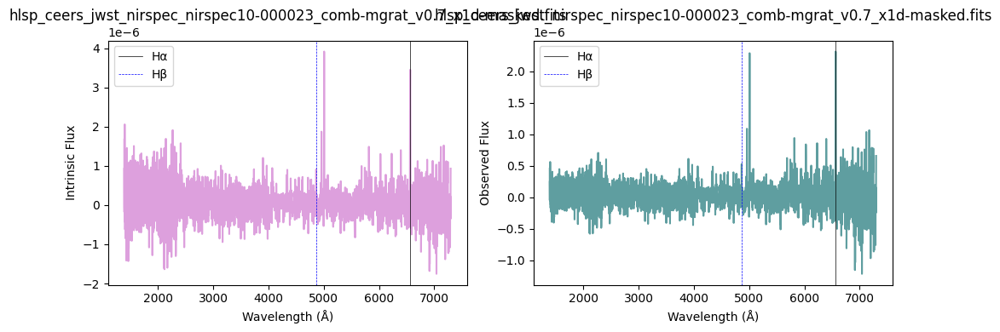

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.843619959894011
obs/intrinsic  1.3365013811489823
ebv 0.6772549026637257
k [5.11015146 5.10756322 5.10498192 ... 1.49014763 1.48950259 1.48885801]


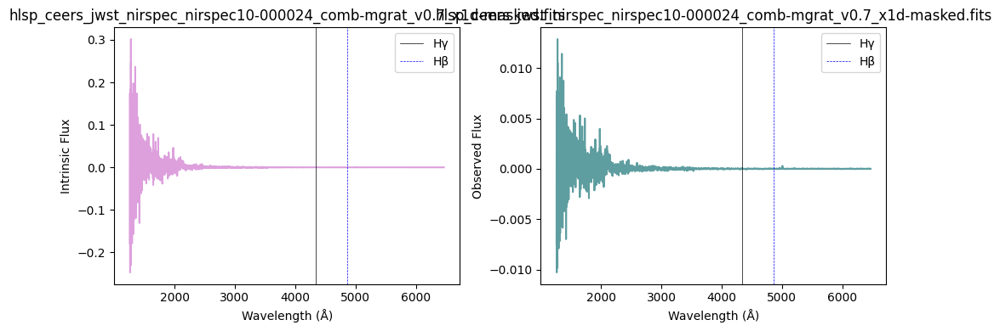

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.273158486056008
obs/intrinsic  0.7920412843400724
ebv -0.21765301088954575
k [4.64739419 4.64561813 4.64384566 ... 1.24898942 1.24842693 1.24786483]


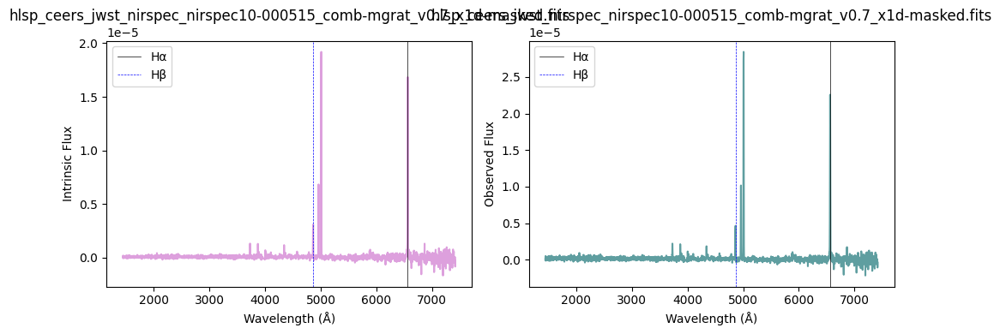

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.2970714082759898
obs/intrinsic  0.8003733129881497
ebv -0.2078834921852338
k [4.44229987 4.44072106 4.43914483 ... 1.07567217 1.07517271 1.0746736 ]


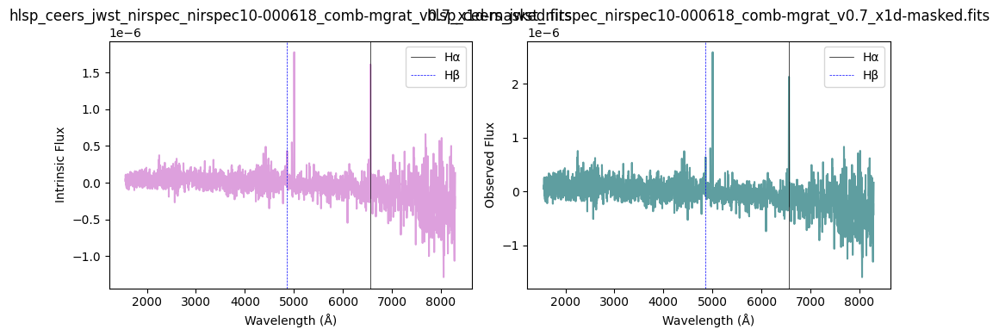

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.1733113012013794
obs/intrinsic  1.1056833802095398
ebv 0.09378929849042887
k [3.62506718 3.62371908 3.62237172 ... 0.6164973  0.6161495  0.61580195]


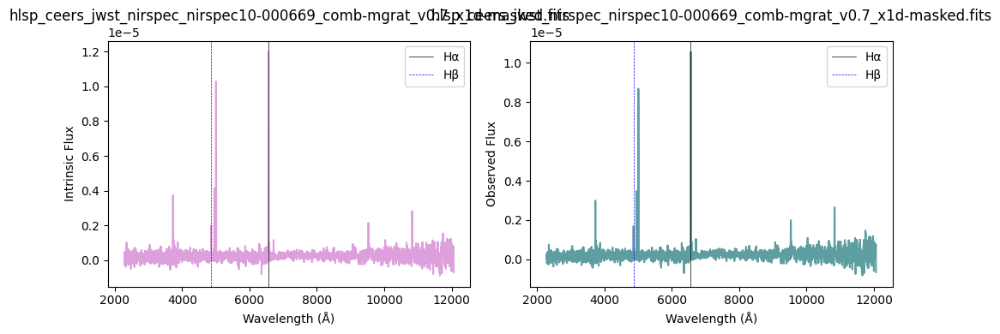

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.0811286727498266
obs/intrinsic  0.9781304761915381
ebv -0.05163015759210588
k [0.         0.         0.         ... 1.70070609 1.70004275 1.69937976]


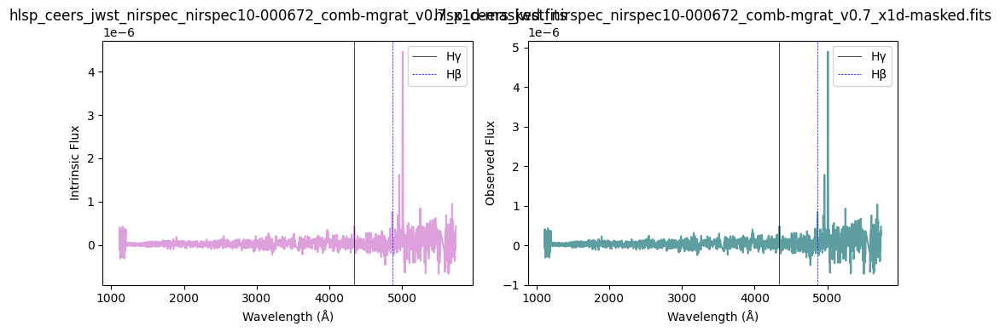

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.283637684291237
obs/intrinsic  1.4925566844220337
ebv 0.37388399350986184
k [5.02326671 5.02077657 5.01829309 ... 1.39501204 1.39439917 1.39378672]


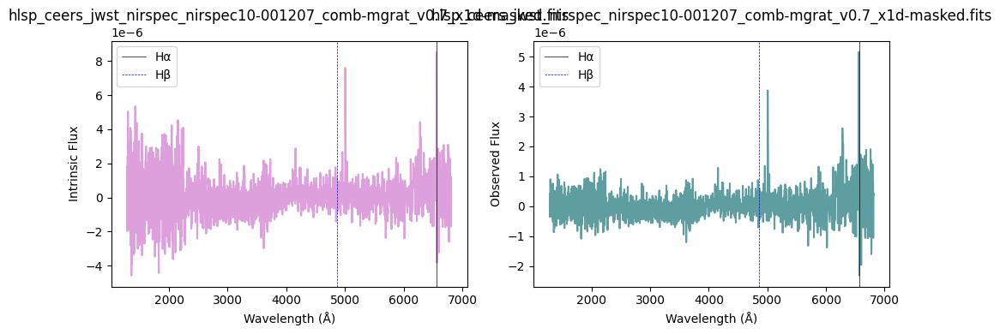

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.5355446420624403
obs/intrinsic  1.1917059817682745
ebv 0.40951139404081555
k [5.08247963 5.07986738 5.07726227 ... 1.41759215 1.41696924 1.41634676]


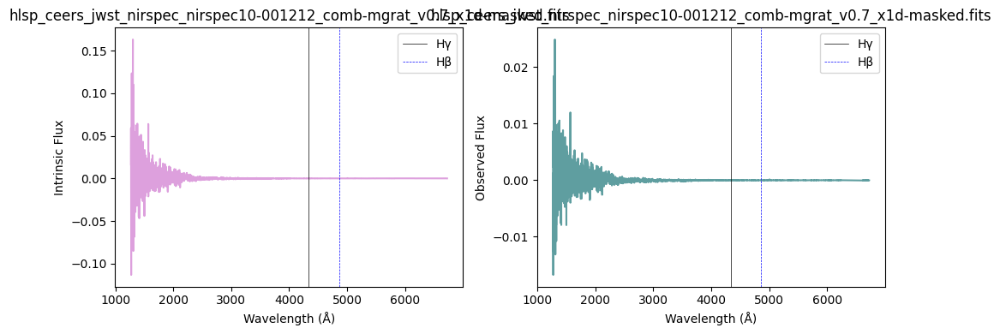

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.347653553574513
obs/intrinsic  0.8179977538587153
ebv -0.18754920218598983
k [4.59618737 4.5944288  4.59267369 ... 1.16953505 1.1690004  1.16846613]


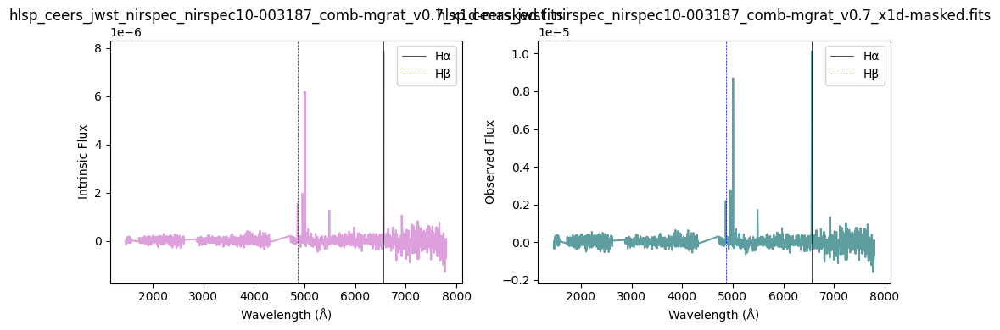

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.099597040836899
obs/intrinsic  1.0799989689327174
ebv 0.07184725036396257
k [4.78069486 4.77865178 4.77661346 ... 1.27117791 1.27060663 1.27003576]


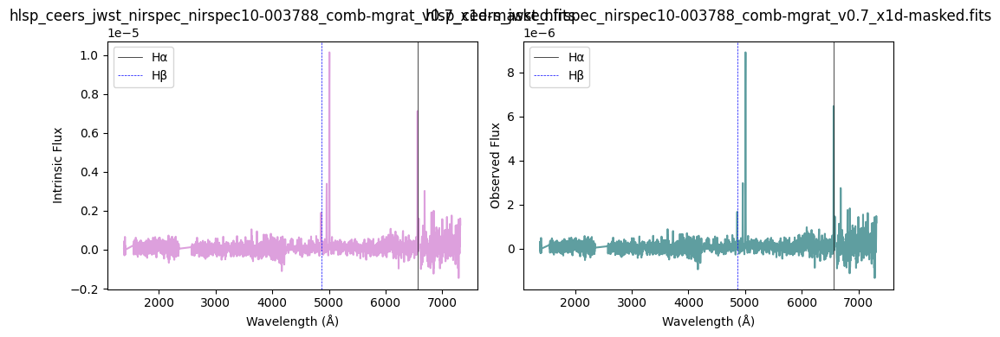

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.765346095781248
obs/intrinsic  0.8297126650164398
ebv -0.4358724765554946
k [5.32711917 5.32395282 5.32079584 ... 1.52126886 1.52060629 1.51994418]


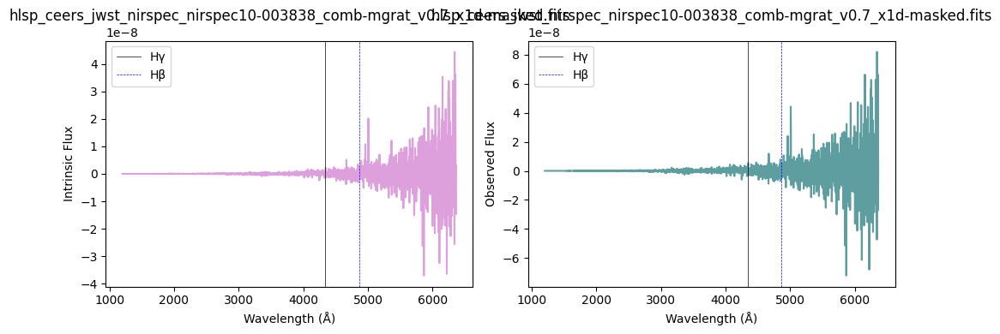

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.713537408584802
obs/intrinsic  1.2939154733744955
ebv 0.24055439904599804
k [4.42560859 4.42403697 4.42246786 ... 1.07314426 1.07263554 1.07212718]


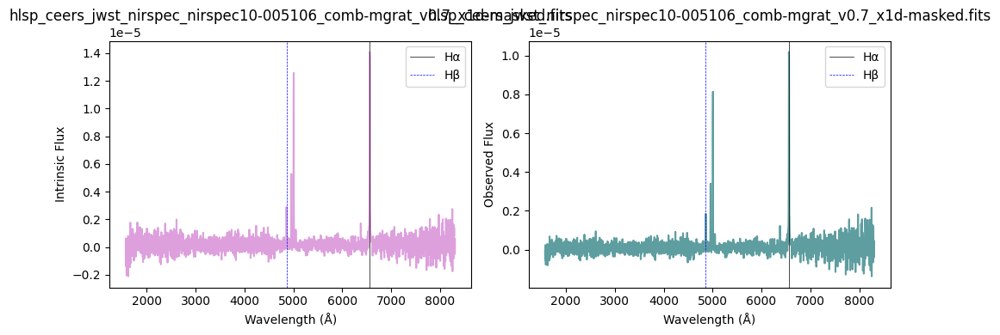

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.2489867149257936
obs/intrinsic  1.1320511201832033
ebv 0.11579114099059548
k [4.63483031 4.63301449 4.63120239 ... 1.1948899  1.19434385 1.19379818]


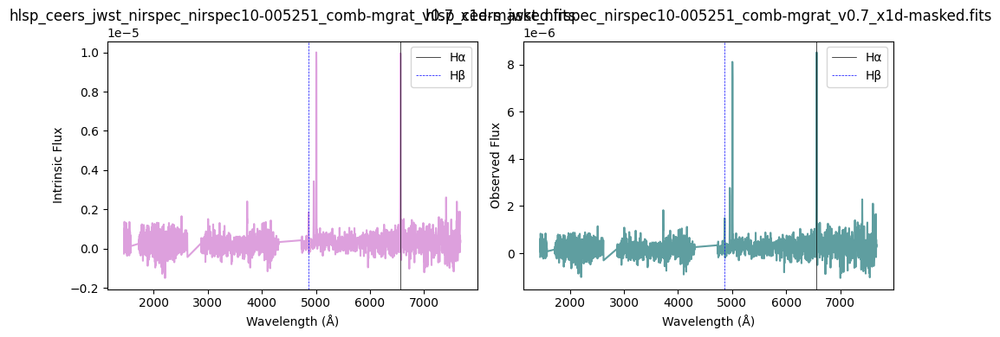

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.095895017858478
obs/intrinsic  1.0787090654559155
ebv 0.07073157470501093
k [4.7608327  4.75882564 4.75682317 ... 1.26110029 1.2605296  1.25995931]


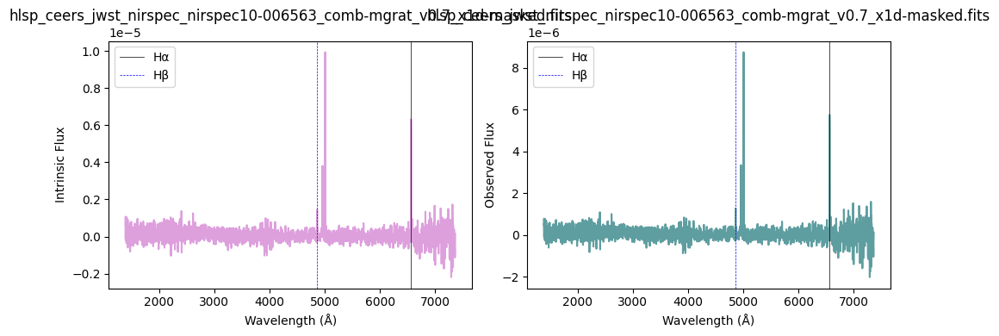

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.5450759395197644
obs/intrinsic  1.2352180973936462
ebv 0.19721334041642993
k [4.85394637 4.8517784  4.84961572 ... 1.30899664 1.30840906 1.30782189]


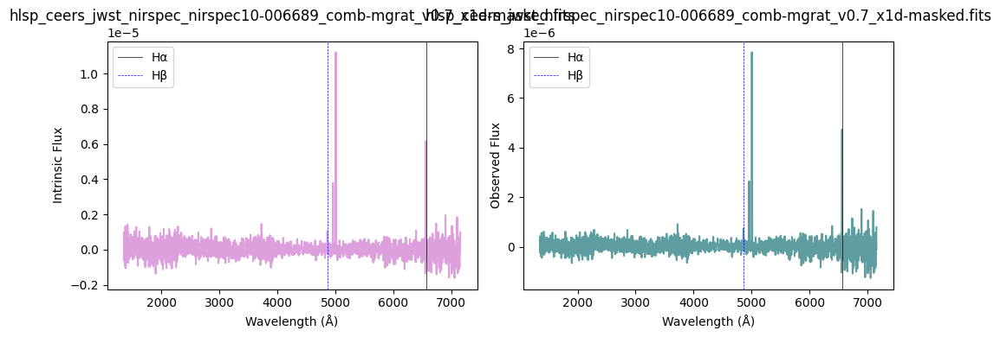

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.423486719795783
obs/intrinsic  1.1928525156082868
ebv 0.16463188044064145
k [4.13865703 4.13726747 4.1358793  ... 0.89717319 0.89672624 0.89627959]


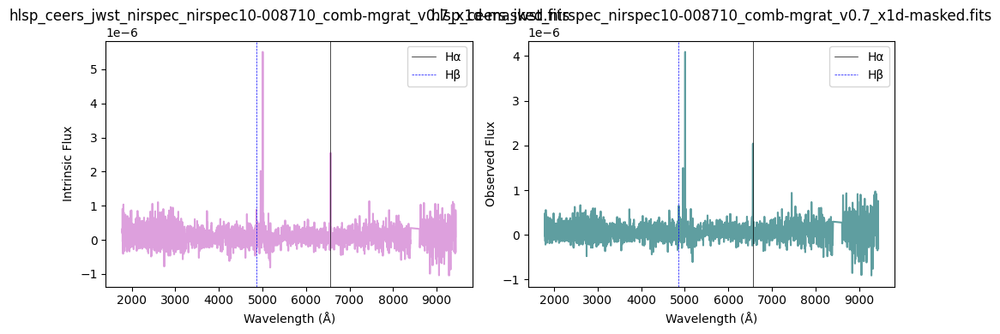

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.07869184547066
obs/intrinsic  1.0727149287354216
ebv 0.06552950267479844
k [4.16881606 4.16741767 4.16602074 ... 0.91040178 0.90995195 0.90950242]


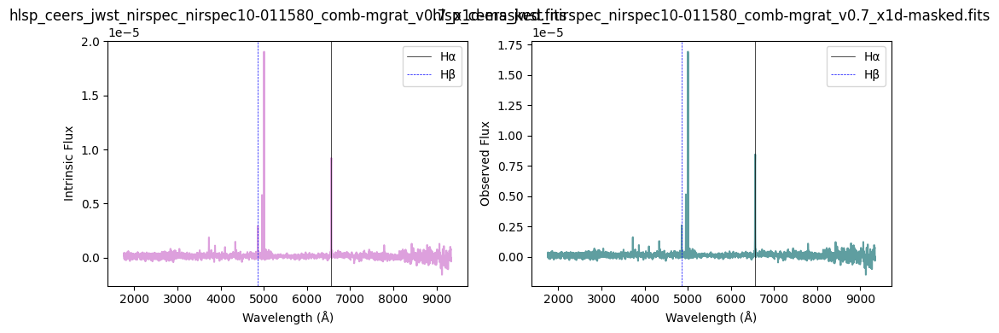

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.5034494126010616
obs/intrinsic  1.220714081045666
ebv 0.18618648802101642
k [3.61772502 3.6163854  3.6150465  ... 0.62156134 0.6212138  0.6208665 ]


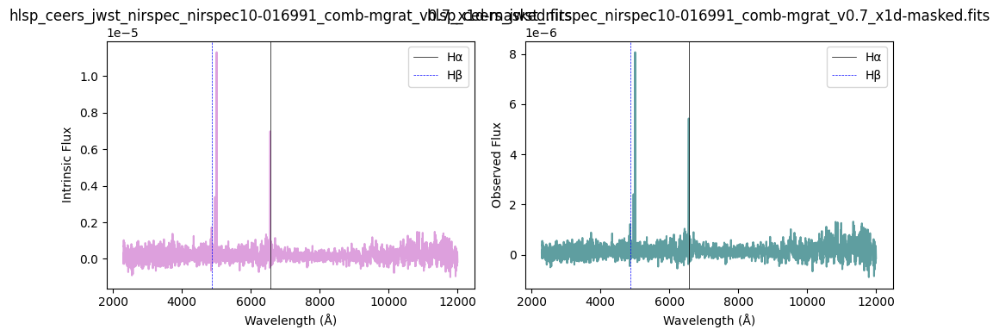

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.6143185160029871
obs/intrinsic  0.7587297025207211
ebv -0.6446930858829216
k [5.1864237  5.18359597 5.18077623 ... 1.46823468 1.46759439 1.46695455]


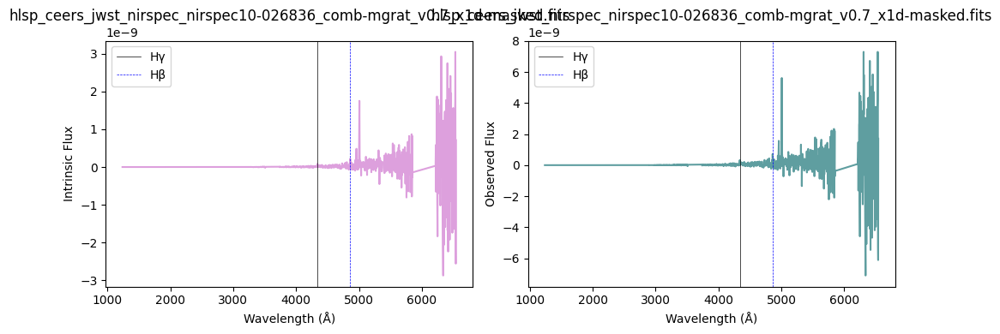

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.4747969921828497
obs/intrinsic  1.1631545863248924
ebv 0.35288944866165106
k [0.         0.         0.         ... 1.86590249 1.86523134 1.86456052]


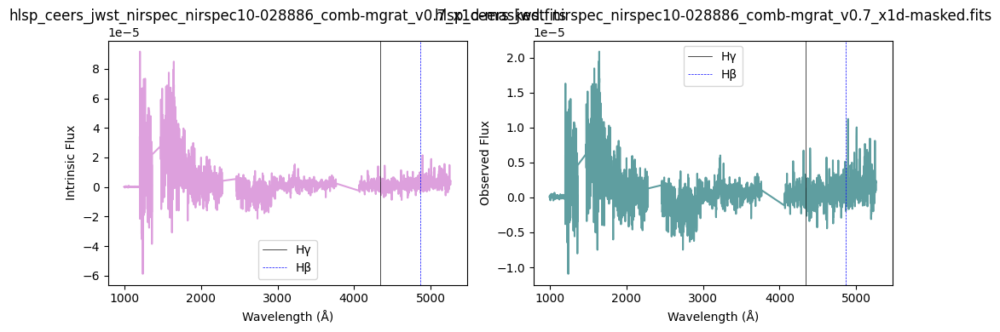

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.475092218806994
obs/intrinsic  1.1632933428382402
ebv 0.35316797188019966
k [0.         0.         0.         ... 1.68704589 1.68640357 1.68576158]


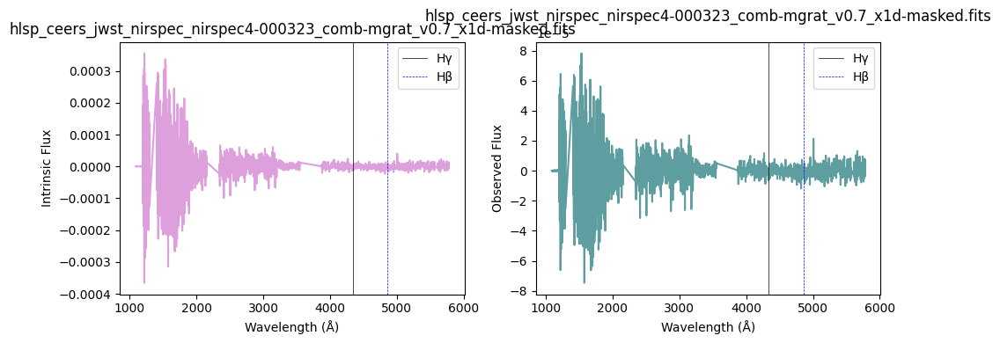

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.287347535411351
obs/intrinsic  1.1454172597252092
ebv 0.1267491895851253
k [3.32087492 3.31948781 3.31810146 ... 0.4772225  0.47692404 0.47662579]


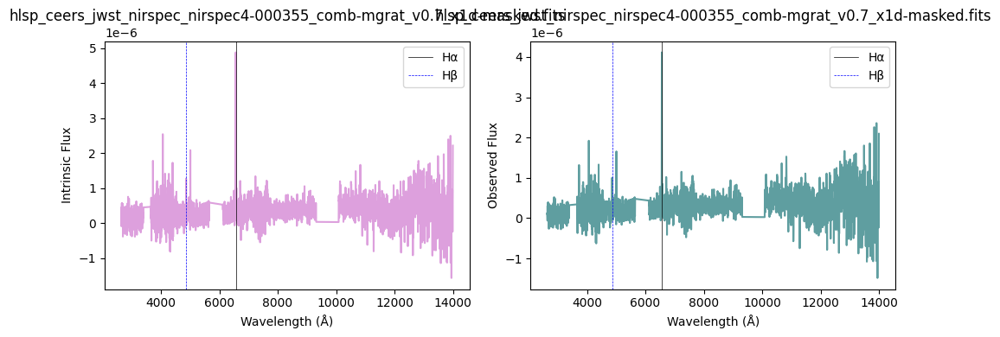

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.0104867865394427
obs/intrinsic  1.0489500998395271
ebv 0.044614850886199896
k [3.44585159 3.44460478 3.44335858 ... 0.62180035 0.62145358 0.62110706]


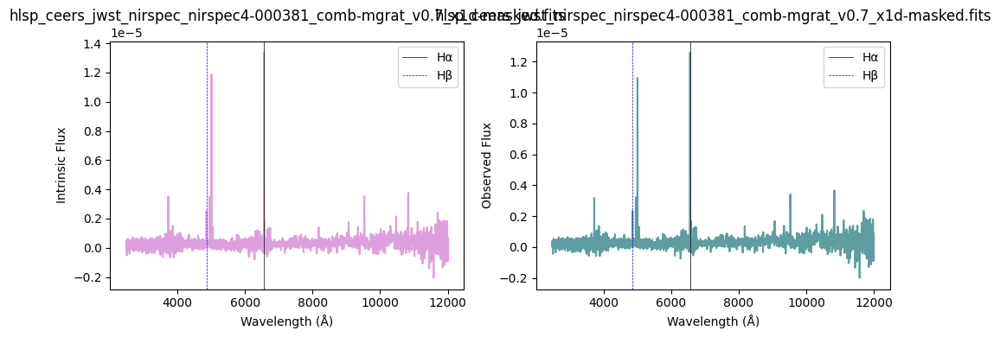

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.9273837719121145
obs/intrinsic  1.019994345613977
ebv 0.018481866373520676
k [2.27462017 2.27326664 2.27191422 ... 0.         0.         0.        ]


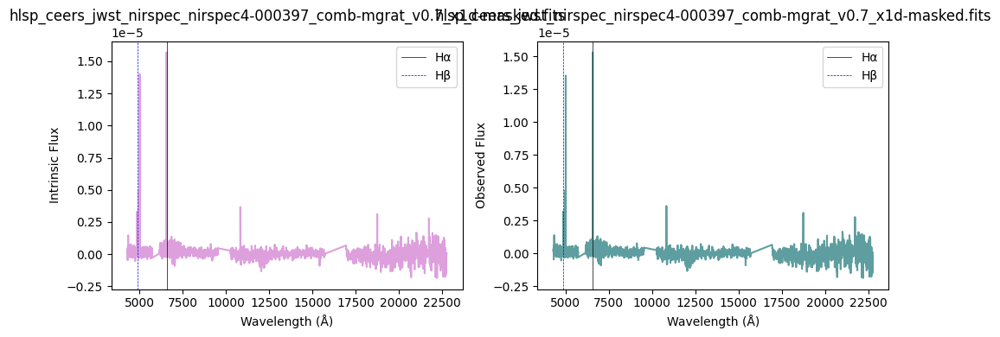

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 1.5379305784847626
obs/intrinsic  0.5358643130608929
ebv -0.5824272671744354
k [4.141901   4.1405165  4.13913338 ... 0.89466796 0.8942245  0.89378135]


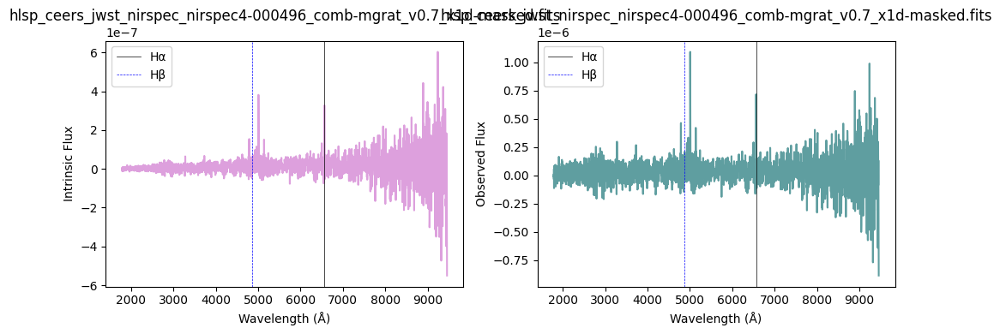

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.1633148086015384
obs/intrinsic  1.016757960041808
ebv 0.0388041995413351
k [5.32173712 5.31871868 5.3157088  ... 1.57683706 1.576217   1.57559726]


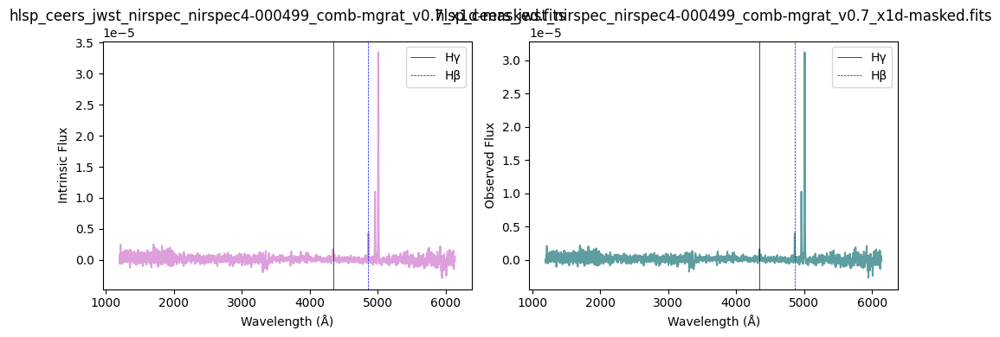

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.148487185458718
obs/intrinsic  1.445465918278299
ebv 0.3439549788778563
k [4.19314813 4.19173525 4.19032394 ... 1.00210226 1.00159237 1.00108285]


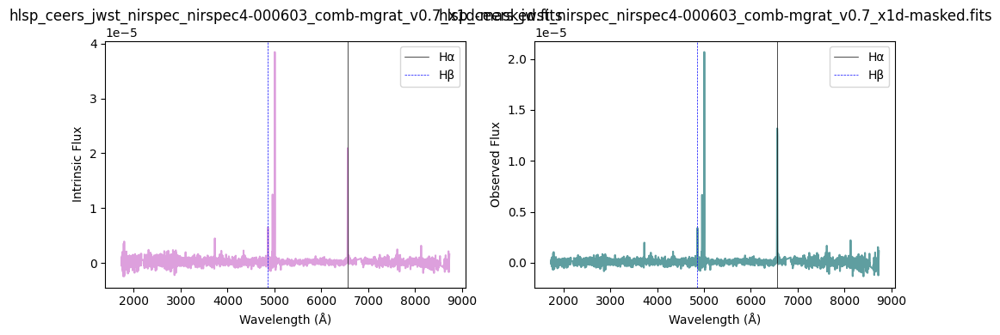

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.6742441509964543
obs/intrinsic  0.9317923871067785
ebv -0.06595193922799238
k [2.41084596 2.40959475 2.40834445 ... 0.23400714 0.23379229 0.23357758]


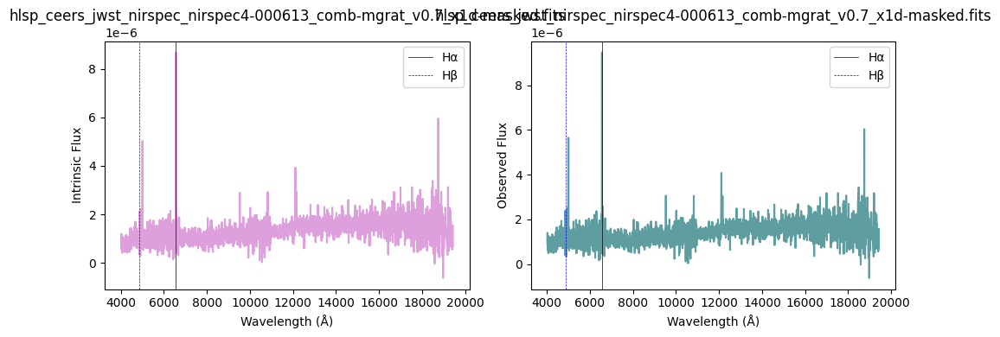

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 5.2615254930000805
obs/intrinsic  1.833284143902467
ebv 0.5658421802177916
k [3.83038719 3.82908205 3.82777773 ... 0.74794553 0.74755499 0.74716473]


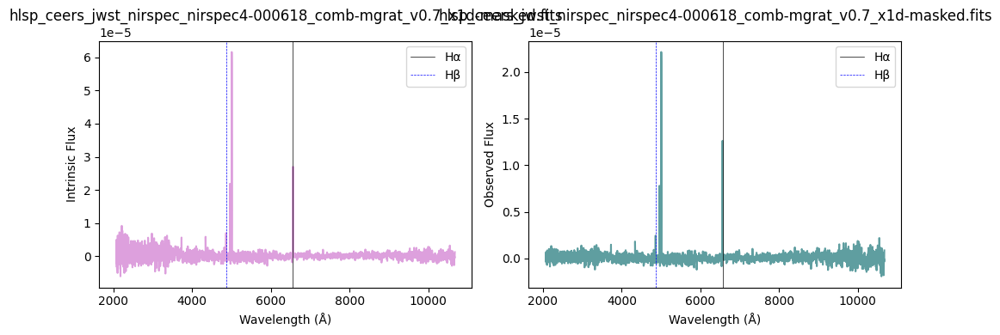

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.097332963676021
obs/intrinsic  1.079210091873178
ebv 0.07116508564663478
k [4.42518743 4.42376523 4.42234509 ... 1.21551625 1.21496553 1.2144152 ]


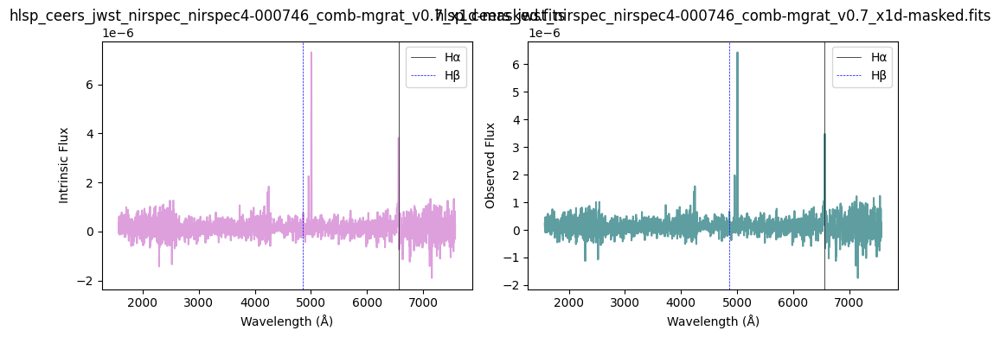

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.138307577793683
obs/intrinsic  1.0050045615621264
ebv 0.011656091168109341
k [0.         0.         0.         ... 1.81313091 1.81247378 1.81181697]


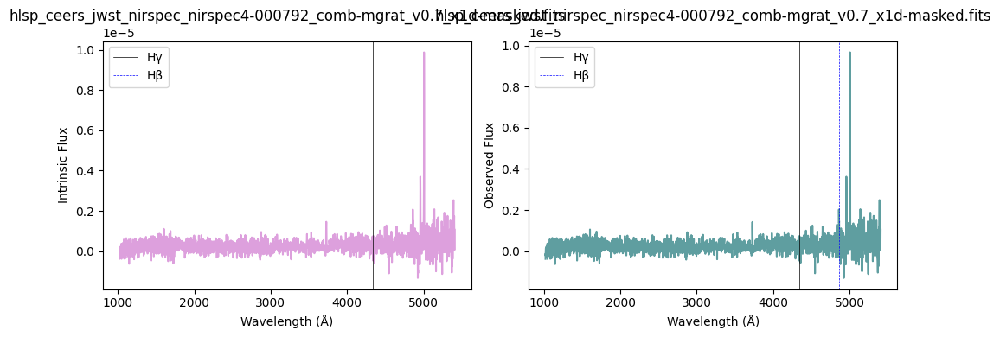

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.2181599994285435
obs/intrinsic  1.4697421600796319
ebv 0.3595037666535883
k [4.13755906 4.13614843 4.13476177 ... 0.89236427 0.89192294 0.89148192]


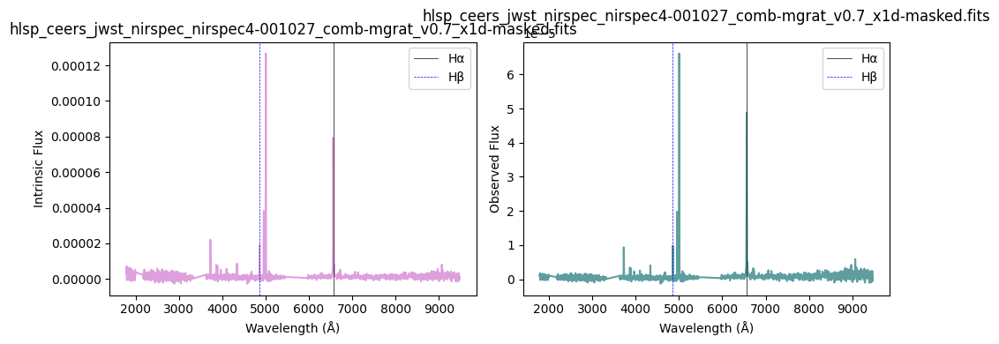

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.3530532408645555
obs/intrinsic  1.1683112337507162
ebv 0.1452247476739389
k [4.33173153 4.33033853 4.32894734 ... 1.10016394 1.09965528 1.09914698]


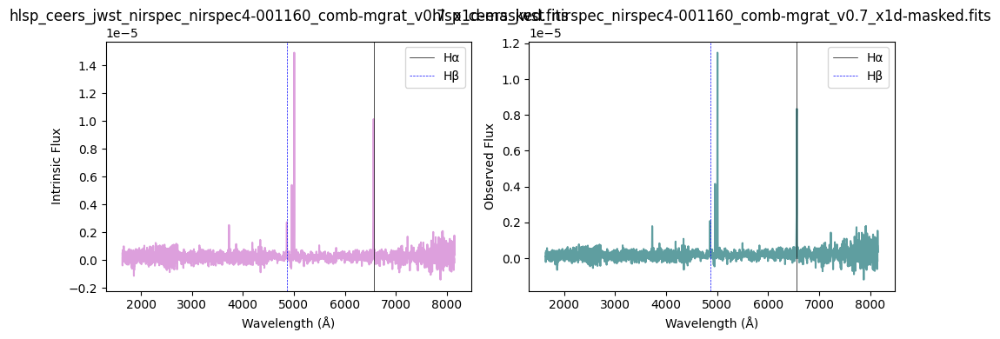

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.2161581869073643
obs/intrinsic  0.7721805529293952
ebv -0.24136100626384907
k [4.20710259 4.20568691 4.20427283 ... 0.93422779 0.93377276 0.93331805]


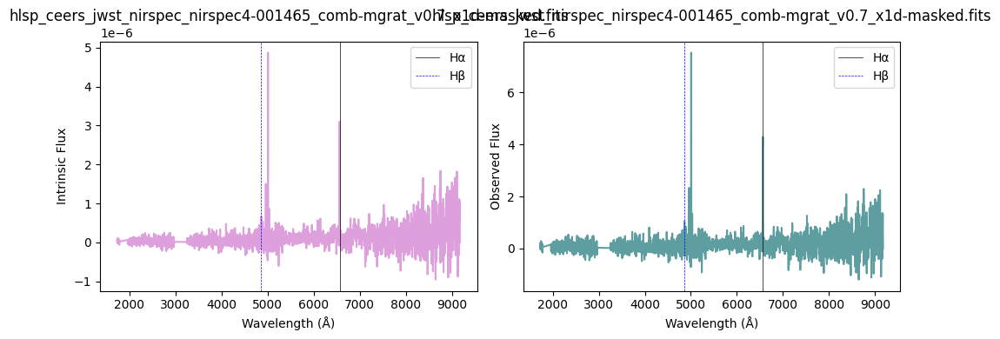

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.258783611170578
obs/intrinsic  1.1354646728817344
ebv 0.11860194924540578
k [4.42865317 4.42709004 4.4255294  ... 1.07240041 1.07190002 1.07139998]


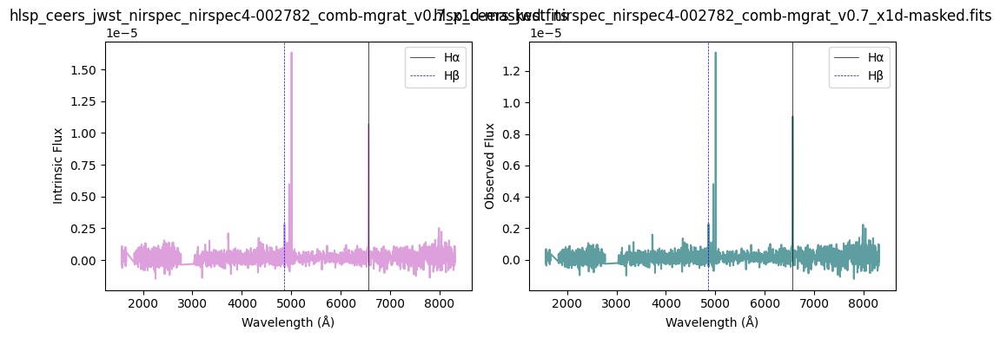

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.0193612589542527
obs/intrinsic  1.0520422505067082
ebv 0.047362815211950036
k [2.89506625 2.89365784 2.89225035 ... 0.32292192 0.32267616 0.32243057]


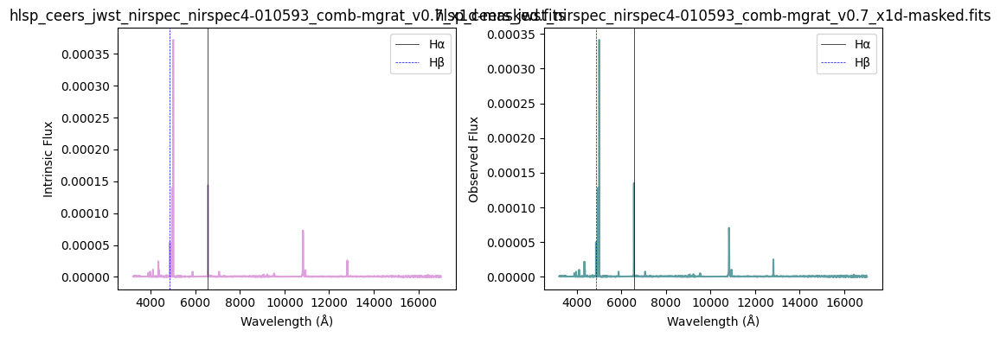

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.9925199792878177
obs/intrinsic  1.0426898882535949
ebv 0.03902657326267124
k [4.39072394 4.38918852 4.38765542 ... 1.11881914 1.1182725  1.11772627]


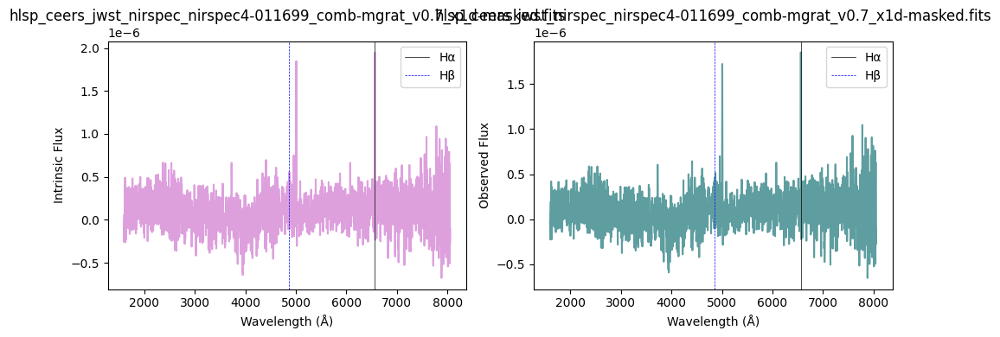

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.0617896400612
obs/intrinsic  1.0668256585579095
ebv 0.060390052656928976
k [3.68813555 3.68678517 3.68543557 ... 0.6433381  0.64298274 0.64262762]


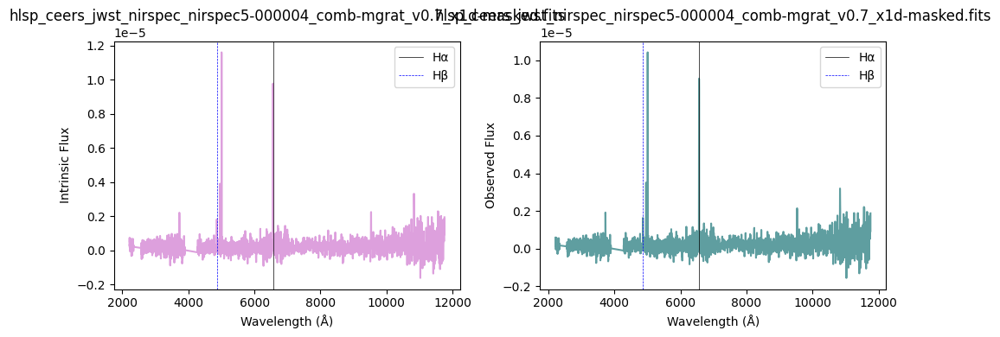

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.664530457122533
obs/intrinsic  1.2523293148464634
ebv 0.5253685310616519
k [0.         0.         0.         ... 1.64360616 1.64296792 1.64233001]


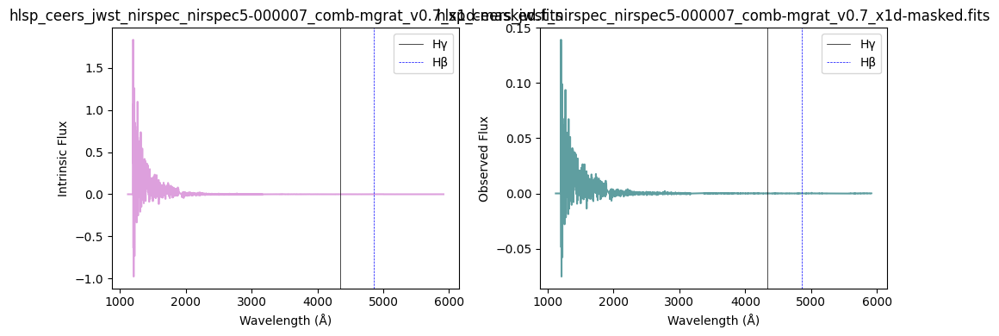

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.948240290828519
obs/intrinsic  1.0272614253757906
ebv 0.025109587828143466
k [2.57603495 2.5746429  2.57325188 ... 0.22382562 0.22361486 0.22340425]


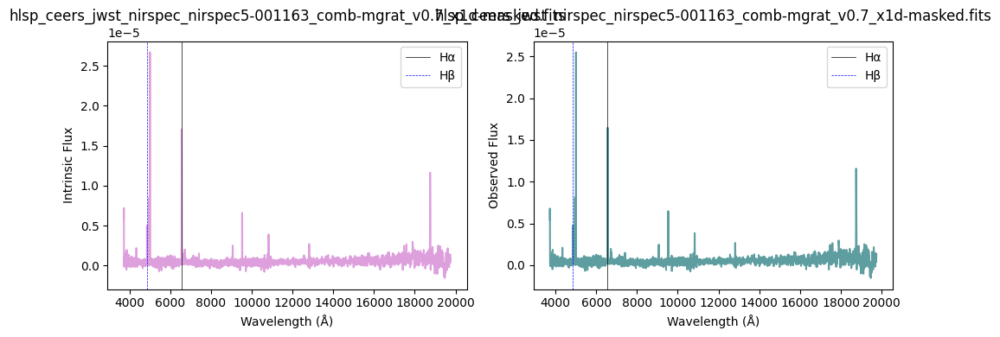

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.9684629736880823
obs/intrinsic  1.0343076563373108
ebv 0.031491271513968695
k [4.82726286 4.82514091 4.82302408 ... 1.29328456 1.29270749 1.29213082]


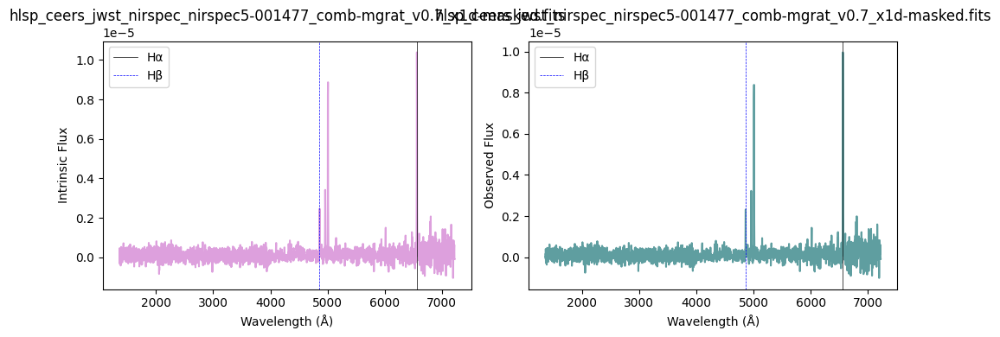

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.504926520651756
obs/intrinsic  1.2212287528403332
ebv 0.18658001044341516
k [3.65349881 3.65214606 3.65079407 ... 0.62612533 0.62577436 0.62542363]


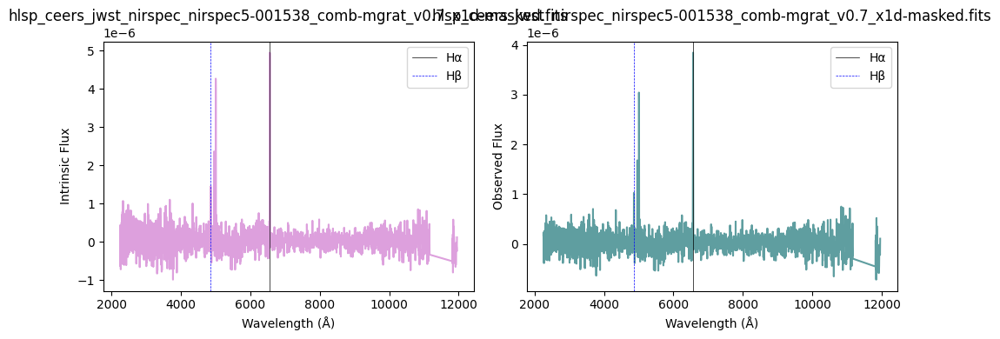

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.09153325027354
obs/intrinsic  1.4256213415587247
ebv 0.3310494155891296
k [4.87455742 4.87235124 4.87015054 ... 1.3171796  1.31659482 1.31601043]


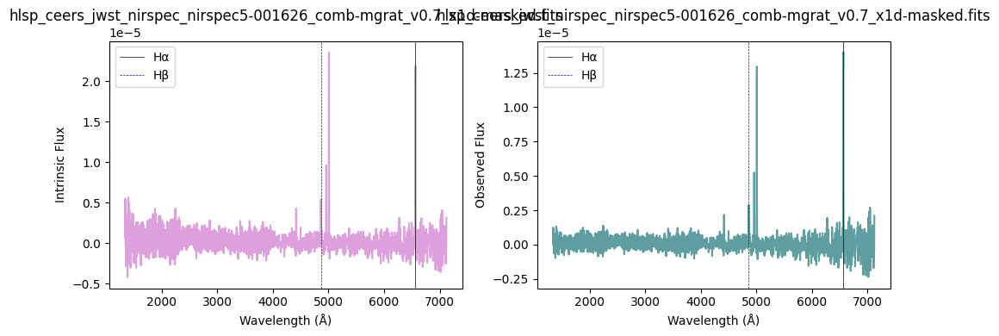

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.7258317822163853
obs/intrinsic  1.2981992272530958
ebv 0.24364003930236655
k [2.5272878  2.52589534 2.52450393 ... 0.21027568 0.21006793 0.20986032]


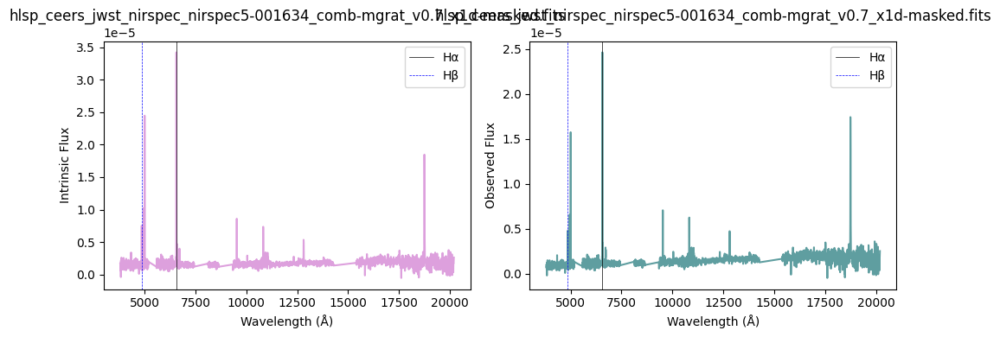

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.139901879237342
obs/intrinsic  1.442474522382349
ebv 0.3420209612981486
k [4.3321107  4.33062608 4.3291435  ... 1.01190231 1.01141895 1.01093592]


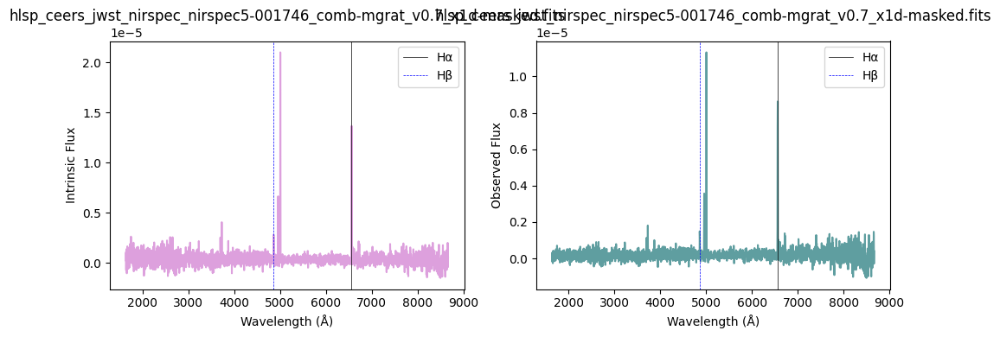

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.7702251654581005
obs/intrinsic  0.9652352492885368
ebv -0.03303273115938811
k [3.33297515 3.33158548 3.33019659 ... 0.49835129 0.49803789 0.49772471]


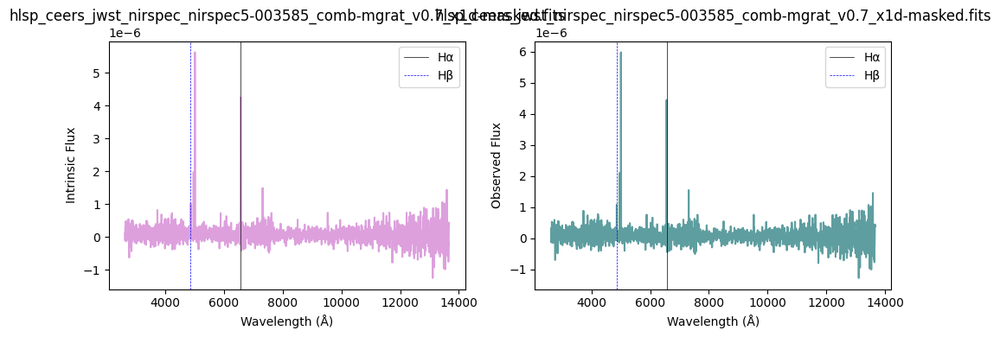

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.0007323882900887
obs/intrinsic  0.69711929905578
ebv -0.3368290930469689
k [2.38500973 2.38363952 2.3822704  ... 0.17111626 0.17092267 0.17072922]


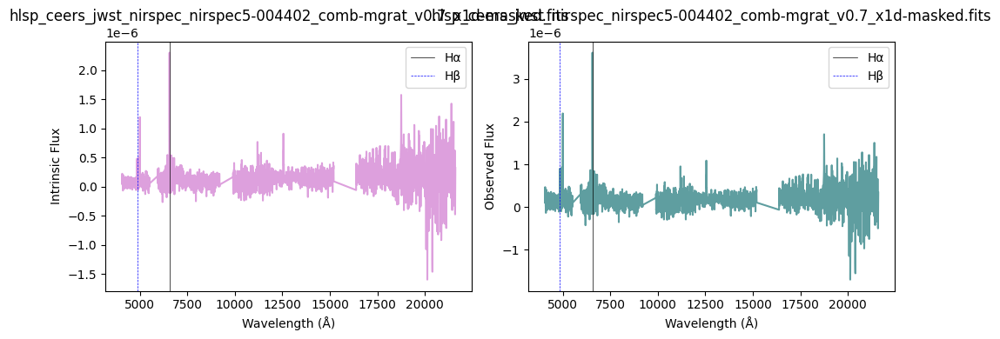

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.6631358363813464
obs/intrinsic  0.9279218942095283
ebv -0.06983787194391677
k [4.44566902 4.44407834 4.44249027 ... 1.08781996 1.08730618 1.08679276]


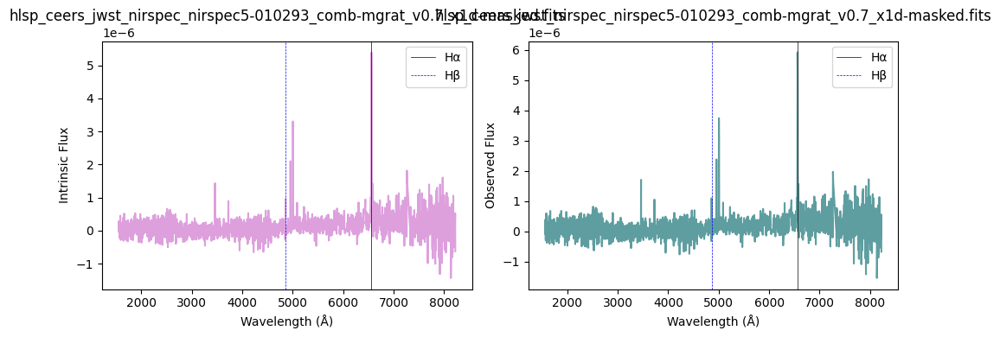

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.750786413188959
obs/intrinsic  1.3068942206233305
ebv 0.2498719635014427
k [2.27243555 2.27108414 2.26973383 ... 0.         0.         0.        ]


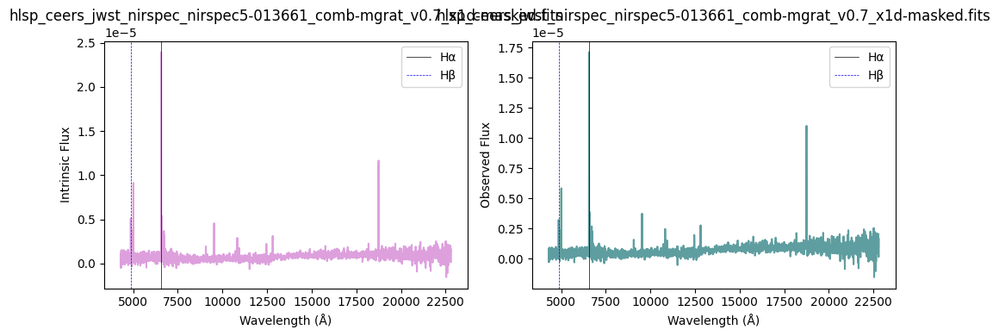

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.1200230089270513
obs/intrinsic  0.7386839752359063
ebv -0.28276294565056603
k [3.23841263 3.23701665 3.23562145 ... 0.44511635 0.44482748 0.44453881]


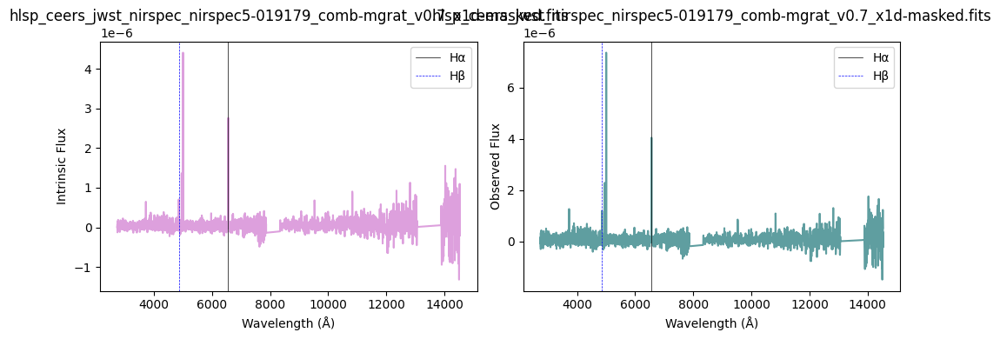

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.176925045618192
obs/intrinsic  0.7585104688565129
ebv -0.25803615813317504
k [4.45094829 4.44935351 4.44776137 ... 1.08413586 1.0836283  1.08312109]


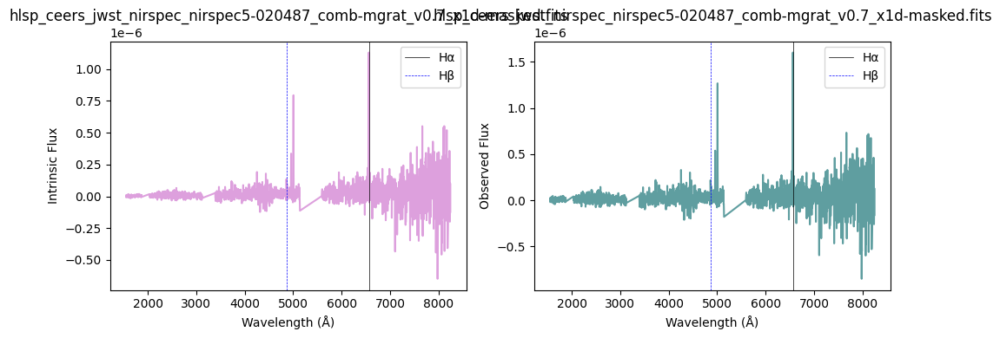

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.451173696968143
obs/intrinsic  1.1520516375739904
ebv 0.3304943311272205
k [5.19119341 5.18833359 5.18548194 ... 1.46429287 1.4636517  1.46301098]


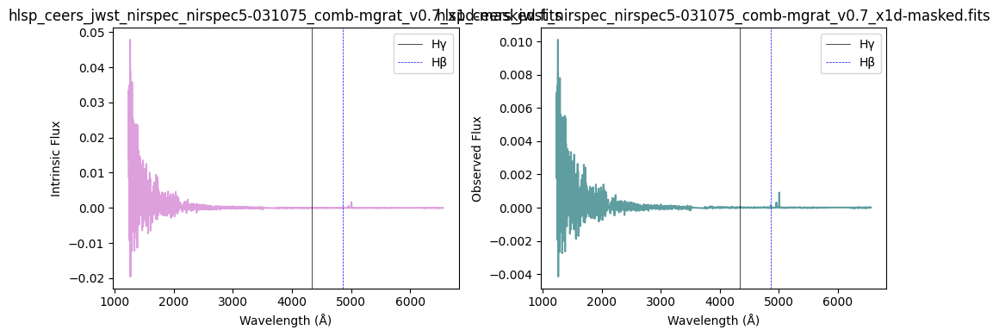

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 1.4935065432768477
obs/intrinsic  0.5203855551487274
ebv -0.6097909868448348
k [4.13714978 4.13576579 4.13438318 ... 0.89215705 0.89171518 0.89127361]


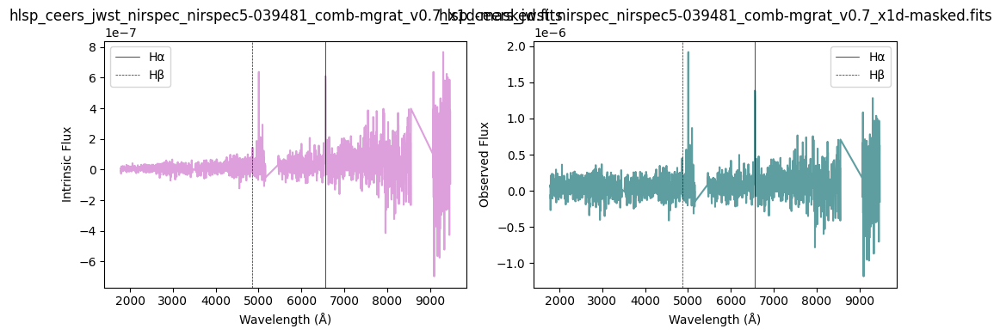

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.356175380573664
obs/intrinsic  1.1693990873078968
ebv 0.1460936168173355
k [4.23711733 4.23568491 4.23425419 ... 0.95522265 0.95475628 0.95429024]


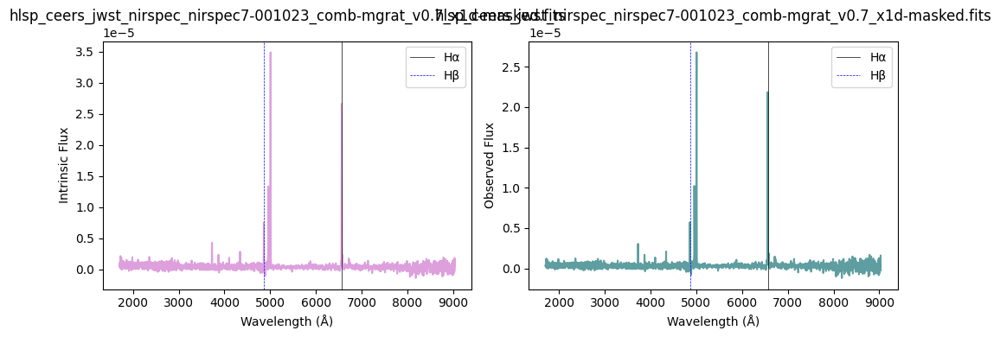

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.0914714916120776
obs/intrinsic  0.7287357113630932
ebv -0.2954212114135125
k [2.94347759 2.94215235 2.94082791 ... 0.38085941 0.3805954  0.38033157]


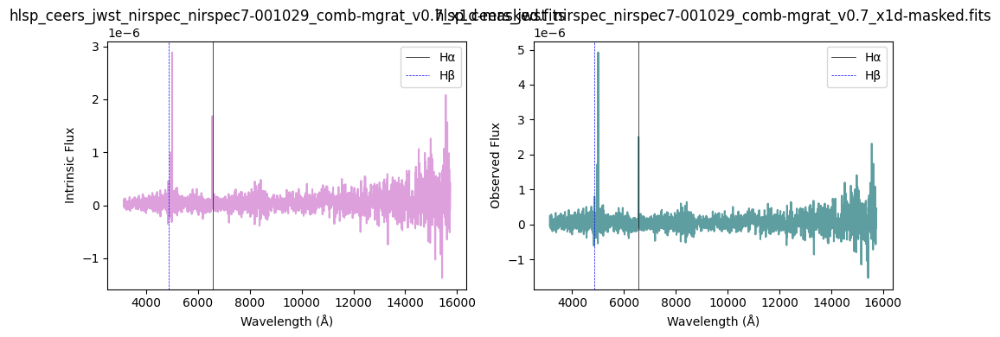

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.3246336466992035
obs/intrinsic  1.1584089361321266
ebv 0.13727837290565145
k [3.8026611  3.80131152 3.79996278 ... 0.70068259 0.70030447 0.69992661]


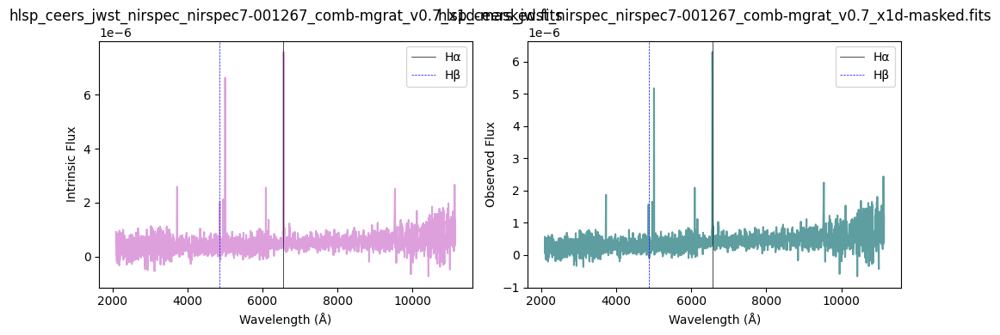

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.0156178988842424
obs/intrinsic  1.0507379438621054
ebv 0.04620467674822929
k [2.97438995 2.97298742 2.97158578 ... 0.34836927 0.34811664 0.3478642 ]


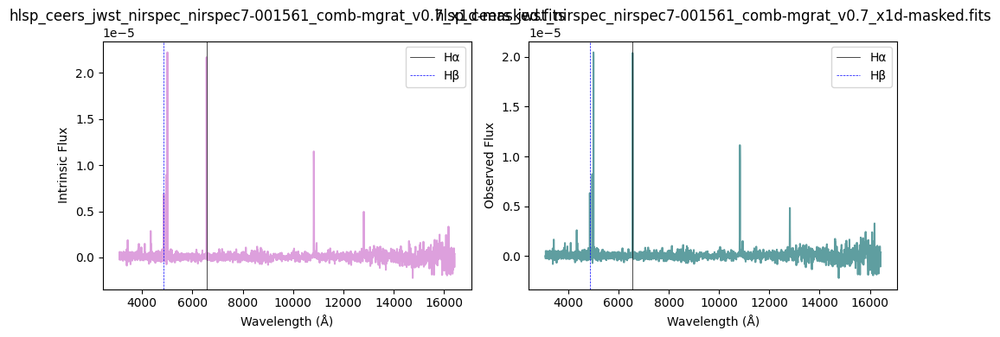

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.136733966867133
obs/intrinsic  1.441370720162764
ebv 0.3413063104157661
k [2.9717719  2.97036734 2.96896368 ... 0.34674478 0.34649208 0.34623955]


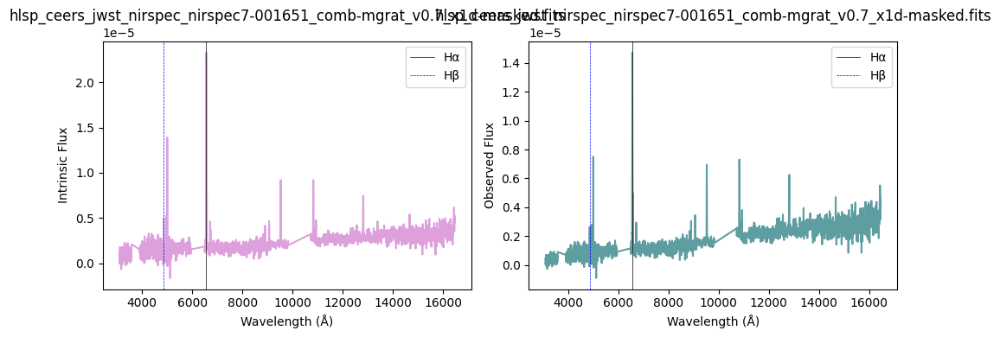

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.9050209525181447
obs/intrinsic  1.0122024224801898
ebv 0.01132281246937962
k [3.88761927 3.88627231 3.88492627 ... 0.7486559  0.74826178 0.74786795]


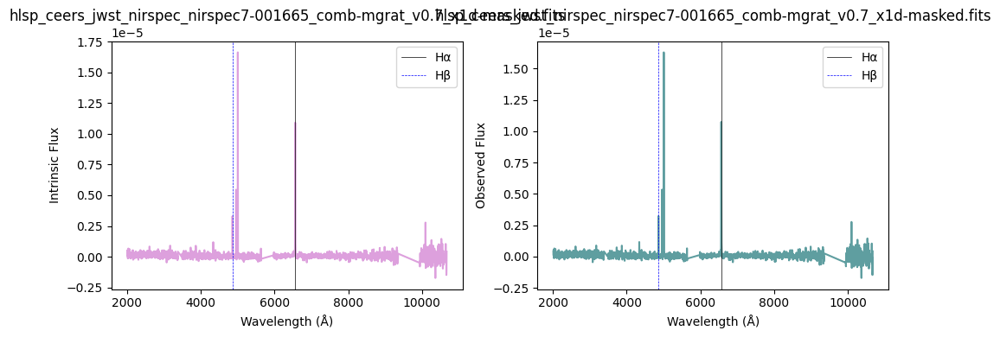

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.0176850880138706
obs/intrinsic  1.051458218820164
ebv 0.046844411134054686
k [3.11310727 3.11169941 3.1102924  ... 0.39781238 0.39753984 0.39726749]


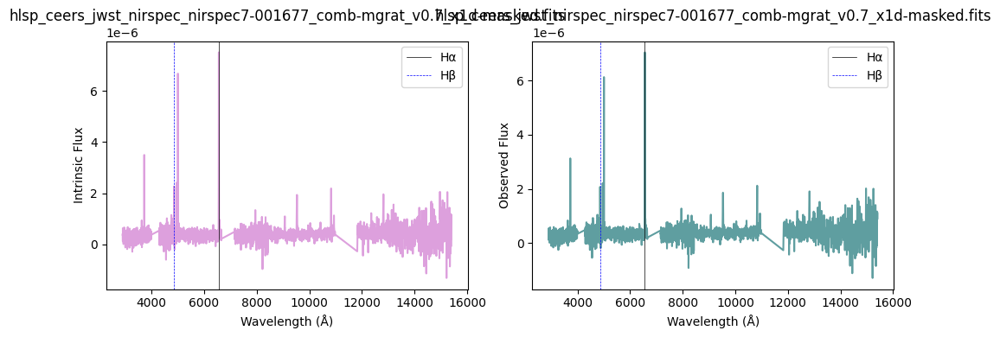

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.9835447278071214
obs/intrinsic  1.0395626229293107
ebv 0.03622239084290555
k [4.52634008 4.52466445 4.52299187 ... 1.13109047 1.13056334 1.13003657]


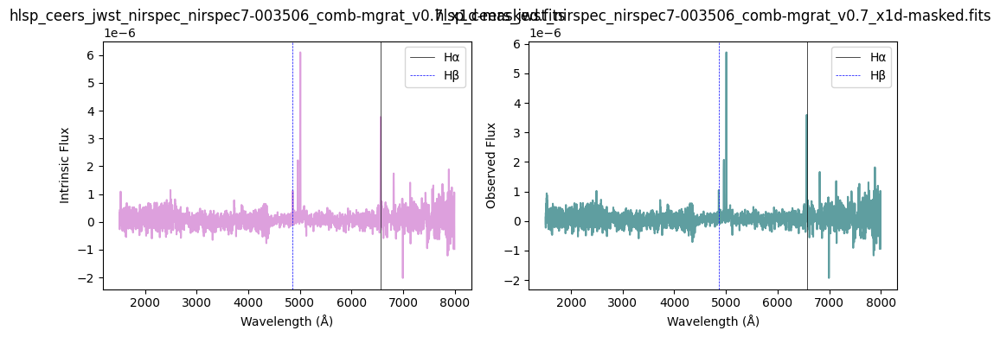

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.5883975644282615
obs/intrinsic  1.2503127402189065
ebv 0.20855257200950056
k [4.19013797 4.18873197 4.18732751 ... 0.92737412 0.92692072 0.92646763]


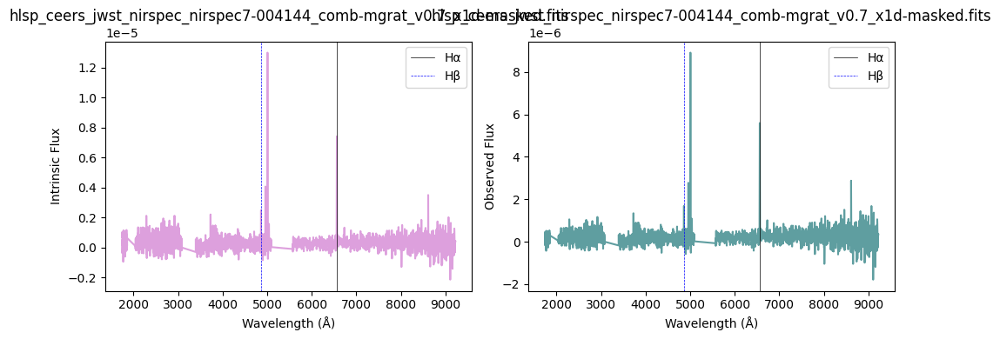

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.038551413288349
obs/intrinsic  1.0587287154314804
ebv 0.05327749874645458
k [4.18993457 4.1885275  4.18712196 ... 0.92653234 0.92607878 0.92562553]


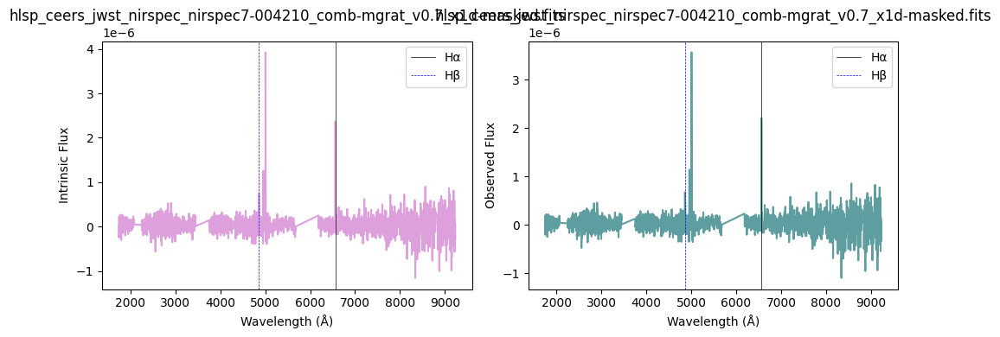

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.8076147108777596
obs/intrinsic  0.8495789141117824
ebv -0.3806251343026002
k [5.16165237 5.15887879 5.15611301 ... 1.46616633 1.46552463 1.46488338]


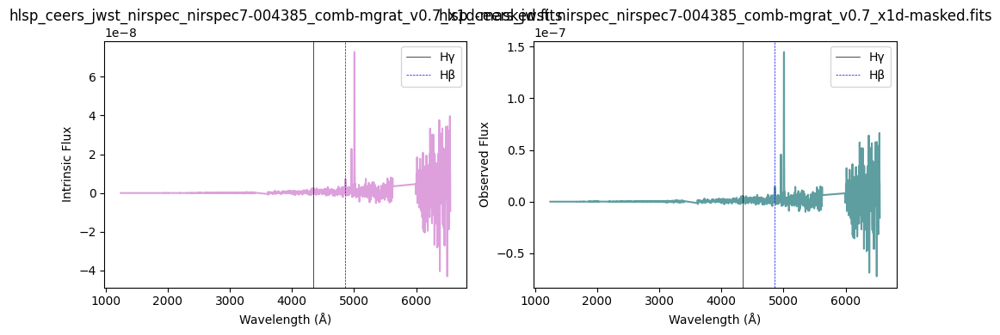

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.3512928119584036
obs/intrinsic  1.1676978438879455
ebv 0.14473447613880777
k [3.21121805 3.20981886 3.20842048 ... 0.4346763  0.43439186 0.43410762]


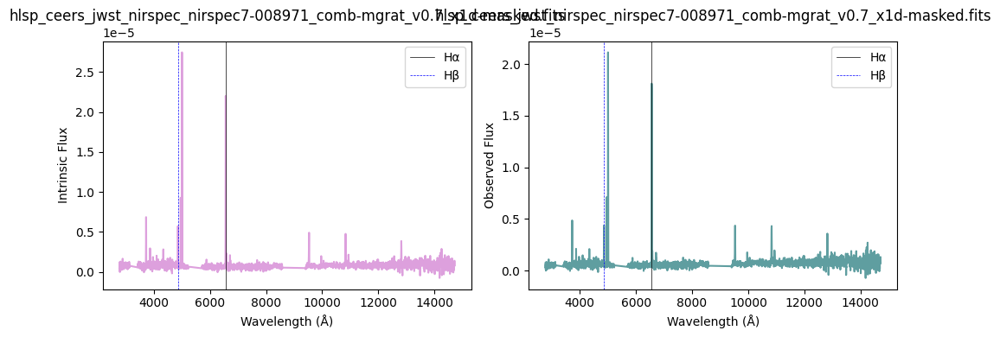

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.245488595822414
obs/intrinsic  1.4792643191018862
ebv 0.36553263518507617
k [4.13211545 4.1307266  4.12933912 ... 0.96122599 0.9607316  0.96023757]


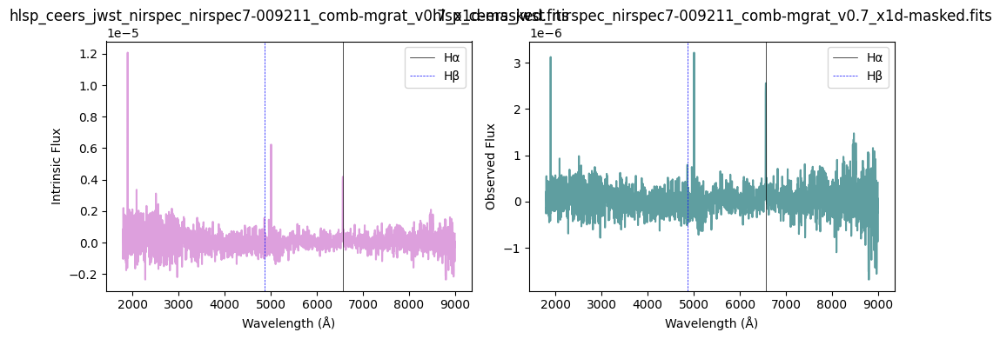

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.567440414515571
obs/intrinsic  1.243010597392185
ebv 0.2030843320546805
k [3.33830507 3.3369192  3.33553408 ... 0.48415141 0.48384886 0.48354652]


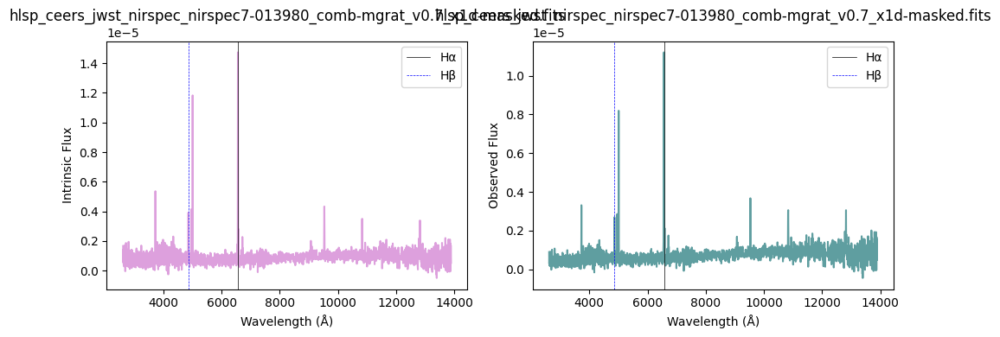

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.151724399514922
obs/intrinsic  1.0113104677711031
ebv 0.026260766213580738
k [0.         0.         0.         ... 1.7251951  1.7245435  1.72389223]


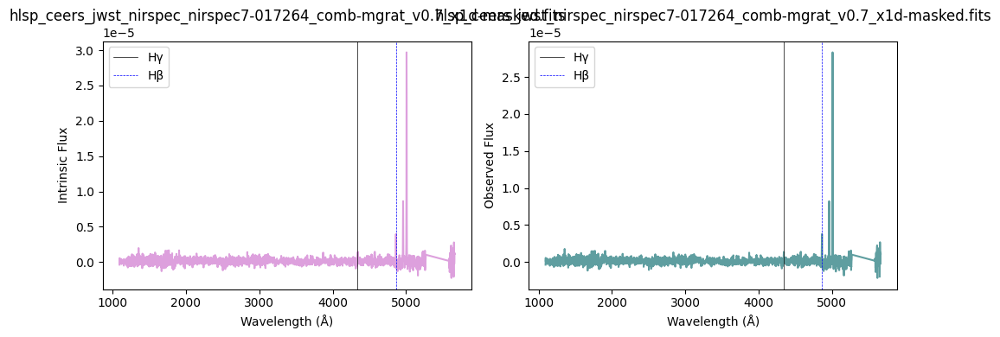

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.094360181270518
obs/intrinsic  1.0781742791883338
ebv 0.07026863098222134
k [4.06877857 4.06741101 4.06604466 ... 0.85056742 0.85013927 0.84971141]


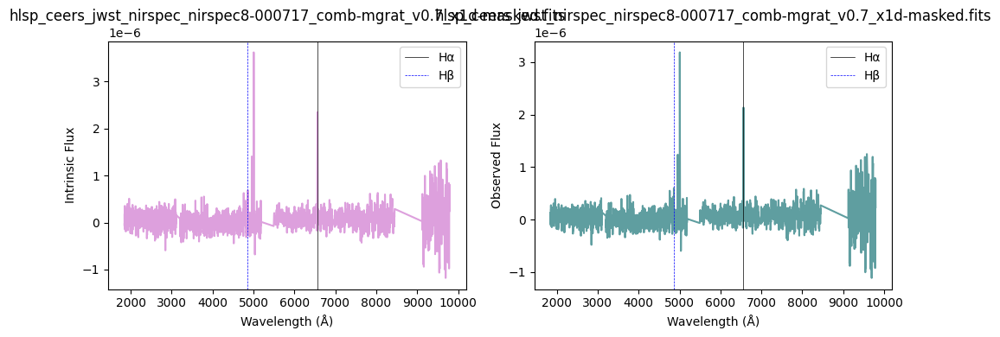

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.8562816951357886
obs/intrinsic  0.9952201028347695
ebv -0.004473044030275594
k [2.99125674 2.98985293 2.98845    ... 0.35334421 0.35309007 0.35283611]


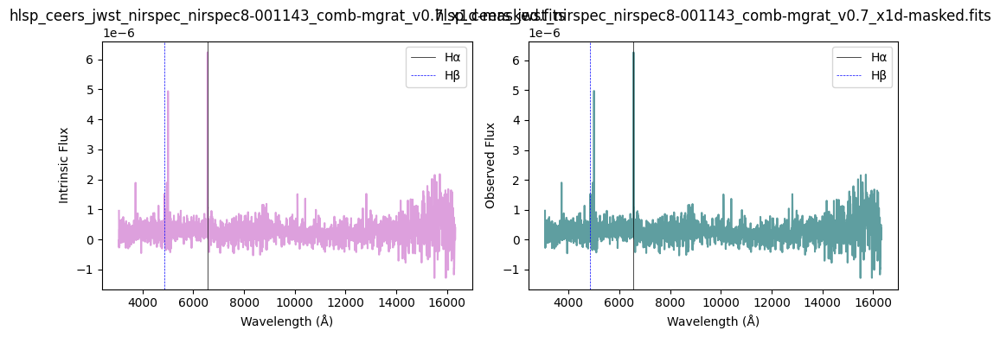

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.7305185557634473
obs/intrinsic  0.9514001936458004
ebv -0.04651067179882031
k [3.1154265  3.11401778 3.11260991 ... 0.41631025 0.41602398 0.41573792]


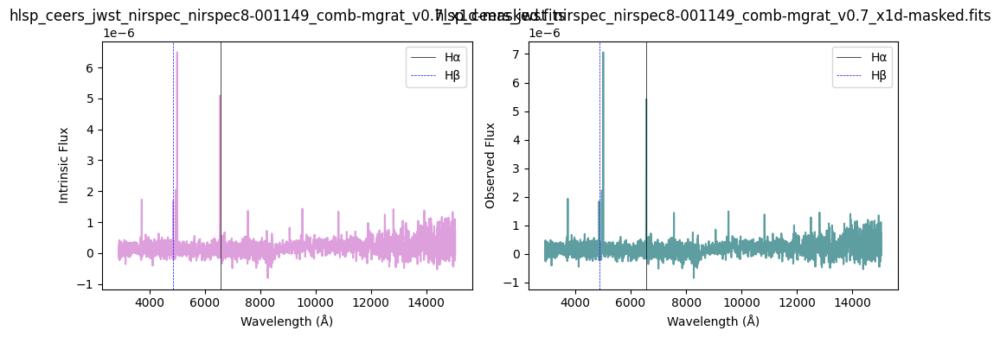

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.105685334262918
obs/intrinsic  1.0821203255271492
ebv 0.07367917990628095
k [4.27184035 4.27043834 4.26903804 ... 1.02148382 1.02099895 1.02051441]


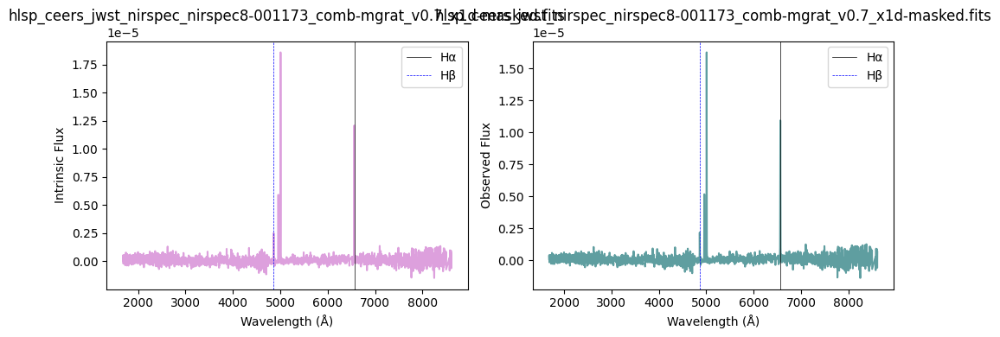

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.8011408369306894
obs/intrinsic  0.8465361933566621
ebv -0.3890025217771618
k [0.         0.         0.         ... 1.83457408 1.8339089  1.83324404]


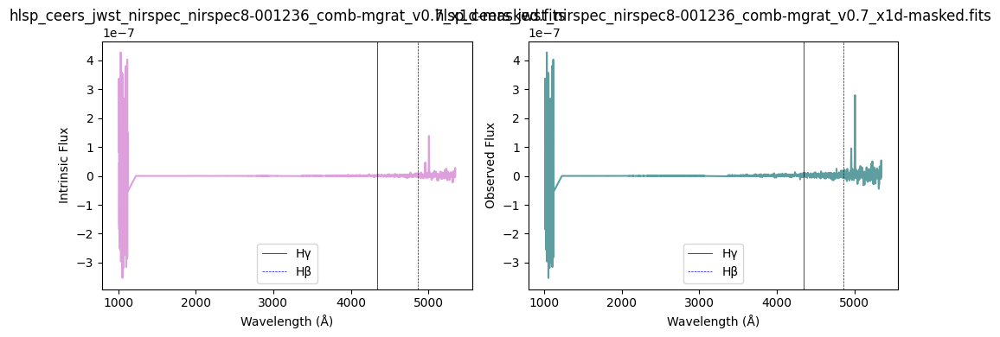

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.4601996551896868
obs/intrinsic  0.8572124234110406
ebv -0.14383392828911687
k [3.25989193 3.25850112 3.25711109 ... 0.45345361 0.45316293 0.45287246]


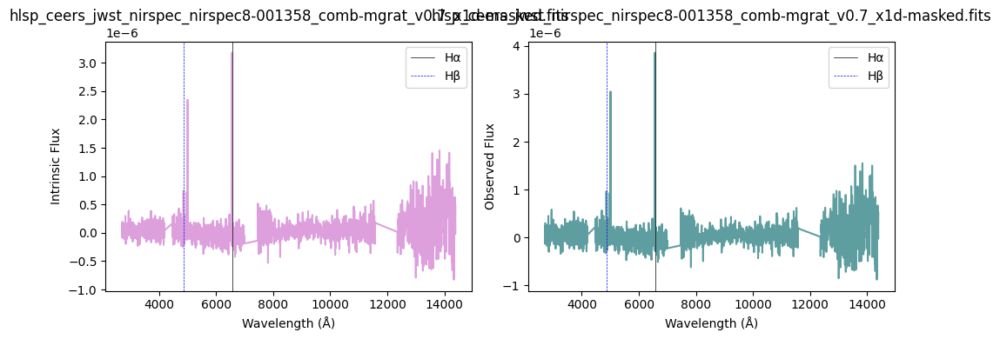

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.7941409376539497
obs/intrinsic  0.9735682709595643
ebv -0.0250077136833105
k [2.38182603 2.38045148 2.37907801 ... 0.17018237 0.1699886  0.16979497]


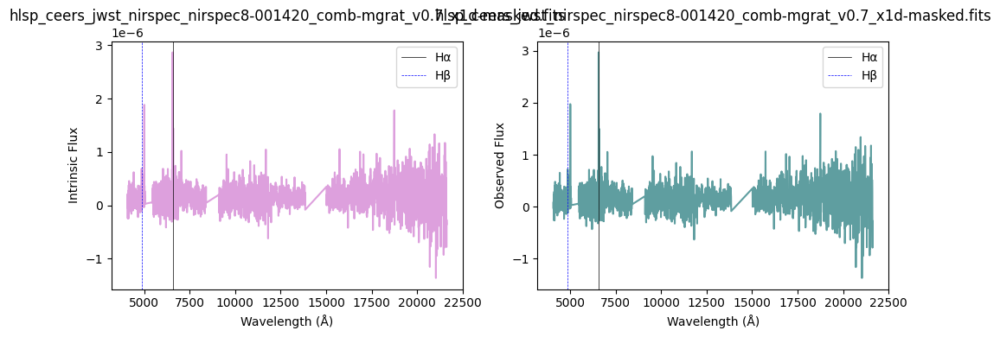

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.399175771148821
obs/intrinsic  1.1843818017940142
ebv 0.15797877422174425
k [3.45238413 3.45101062 3.44963785 ... 0.53591257 0.5355933  0.53527426]


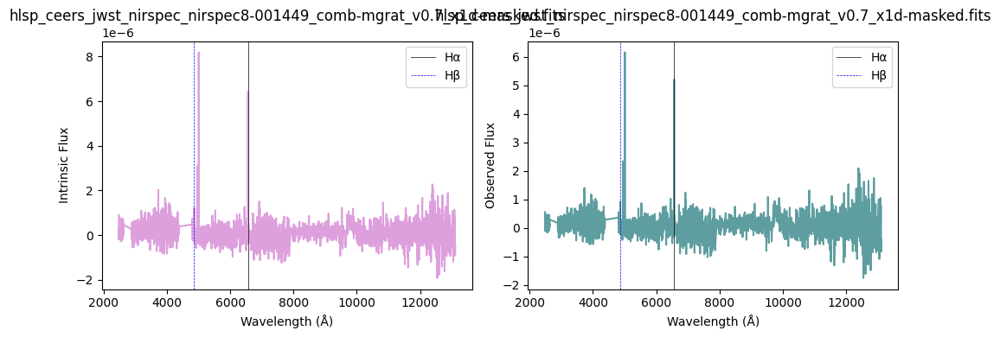

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.14702556169198
obs/intrinsic  1.4449566417045228
ebv 0.34362600079405453
k [4.29165589 4.29019333 4.28873266 ... 0.98730266 0.98682955 0.98635677]


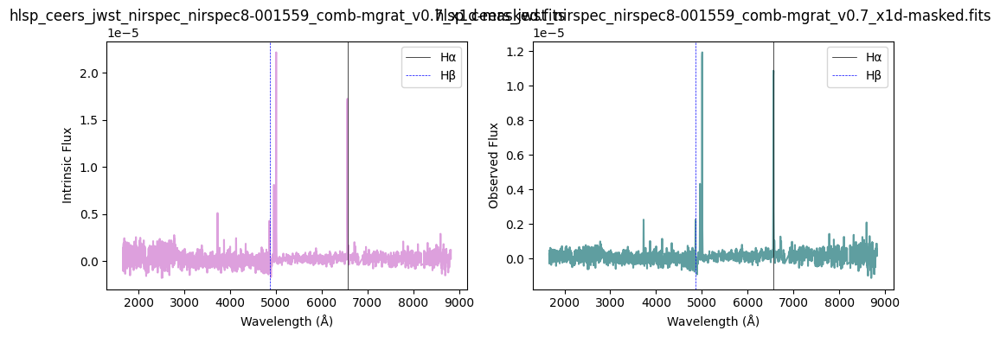

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 1.6528603403928956
obs/intrinsic  0.5759095262693016
ebv -0.5151456097004905
k [4.33971127 4.33821403 4.3367189  ... 1.01539803 1.01491261 1.01442753]


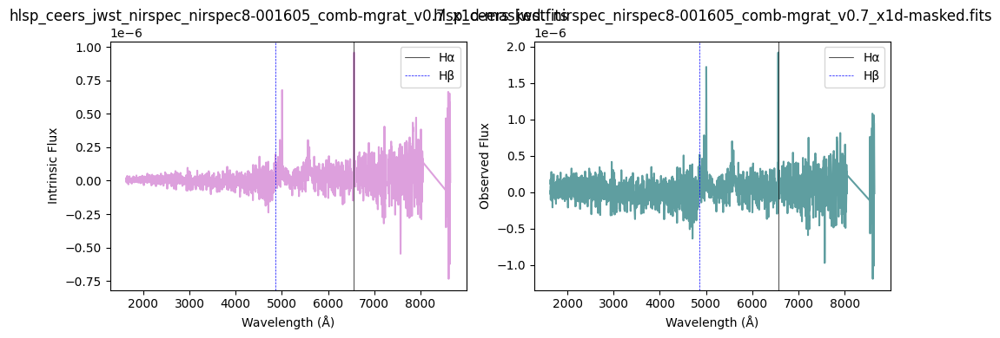

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.096767730528026
obs/intrinsic  1.0790131465254444
ebv 0.07099470354770944
k [3.63560257 3.63425184 3.63290186 ... 0.62108428 0.62073694 0.62039545]


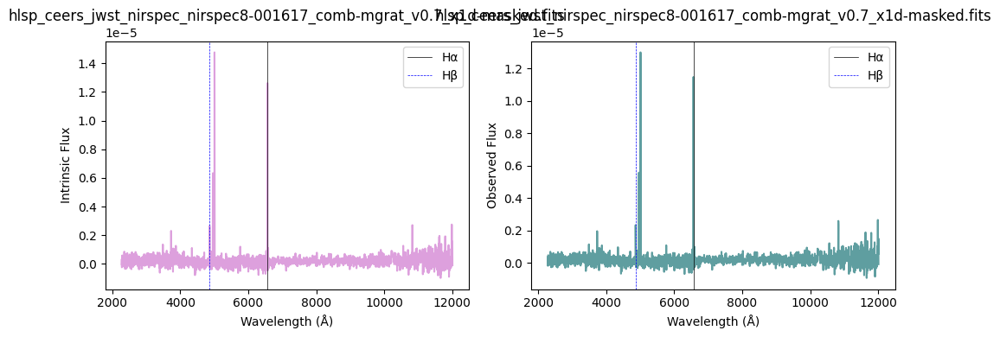

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.901564817099094
obs/intrinsic  1.0109981941111825
ebv 0.010211478581377102
k [4.05837556 4.0570118  4.05564923 ... 0.8443893  0.84396362 0.84353824]


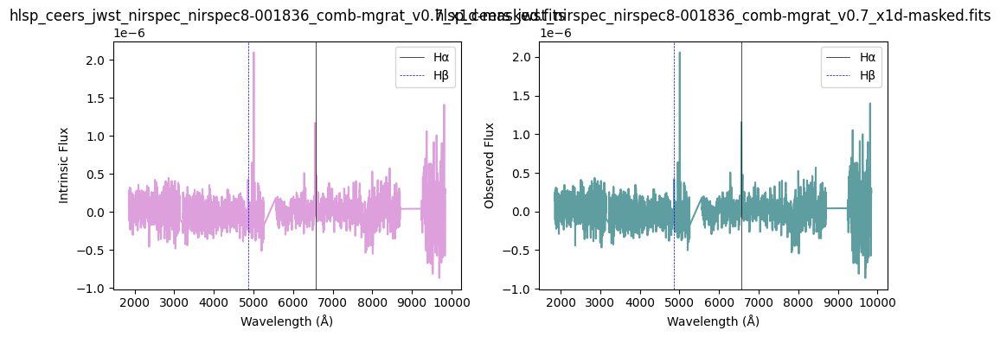

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.989225398488213
obs/intrinsic  1.389974006441886
ebv 0.30740902557387517
k [3.2734036  3.27200987 3.27061692 ... 0.45921928 0.45892608 0.45863307]


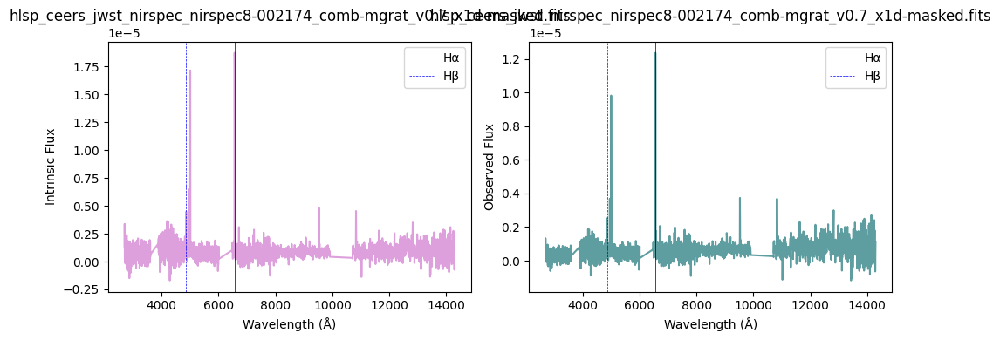

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.500071358966431
obs/intrinsic  1.2195370588733208
ebv 0.1852859029274207
k [2.52402035 2.52263284 2.52124638 ... 0.20891688 0.20870981 0.20850288]


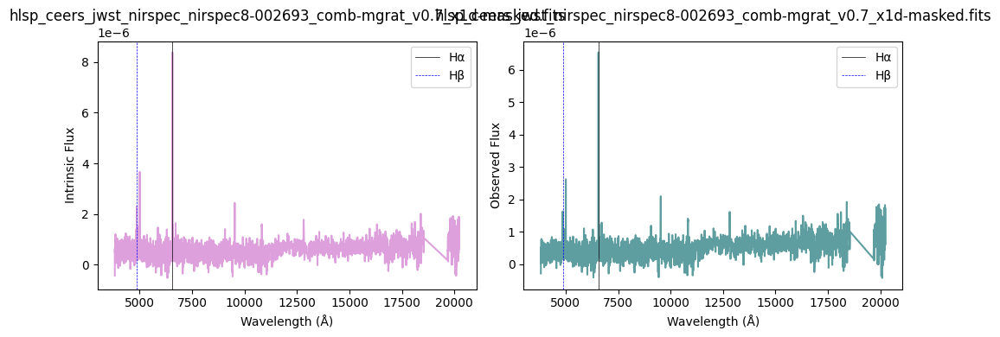

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.3361617508817507
obs/intrinsic  1.0979960229134347
ebv 0.21828369379015009
k [0.         0.         0.         ... 1.59549873 1.59487352 1.59424864]


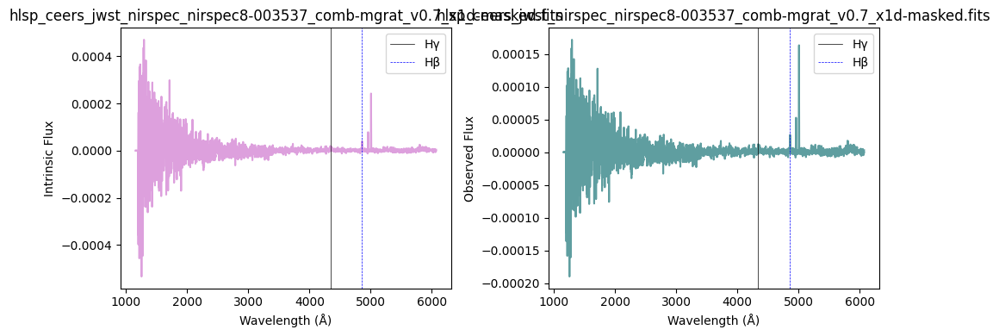

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.22699455051092
obs/intrinsic  1.124388345125756
ebv 0.10945041975260125
k [3.18743492 3.1860416  3.1846491  ... 0.42458643 0.42430792 0.42402962]


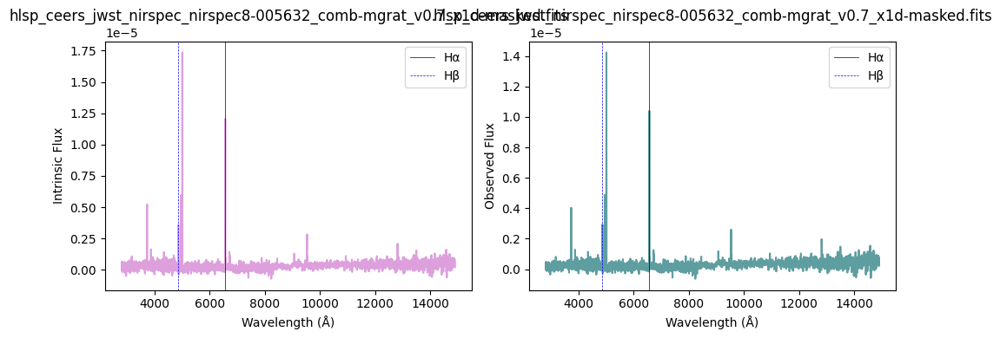

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.7742439727580877
obs/intrinsic  0.8338946671955507
ebv -0.42413335211116354
k [5.31894795 5.31582887 5.31271891 ... 1.52909881 1.52843625 1.52777415]


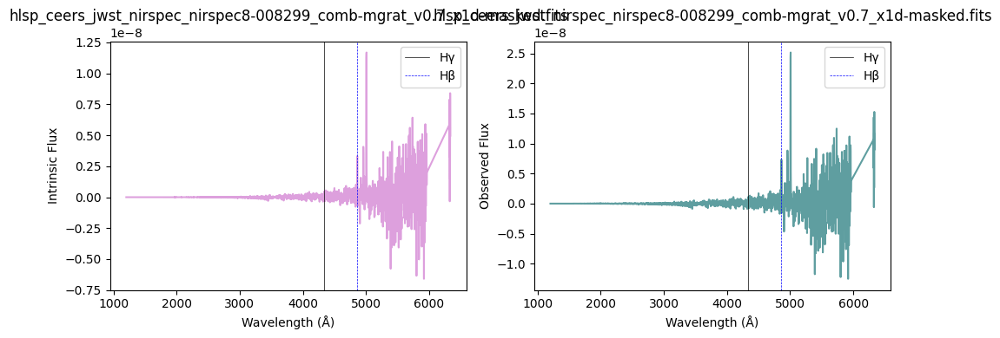

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.063870807400196
obs/intrinsic  0.9700192794772192
ebv -0.07107330048986052
k [0.         0.         0.         ... 1.82793705 1.82727003 1.82660334]


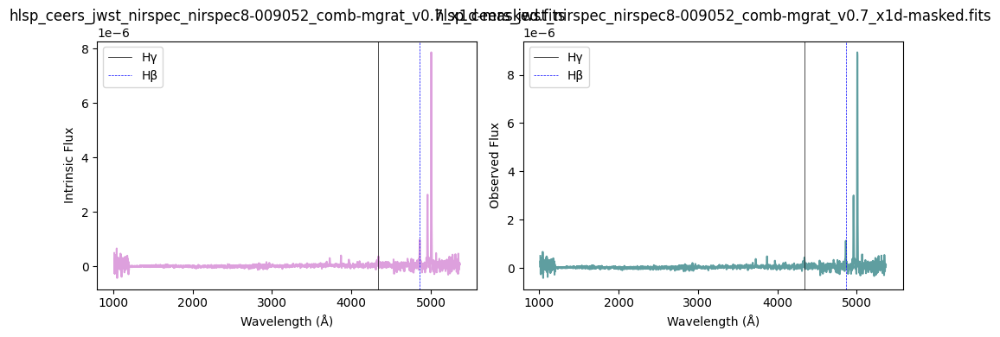

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.622716689796444
obs/intrinsic  1.2622706236224543
ebv 0.21743868261104055
k [3.35298488 3.35160056 3.35021698 ... 0.49945214 0.4991415  0.49883107]


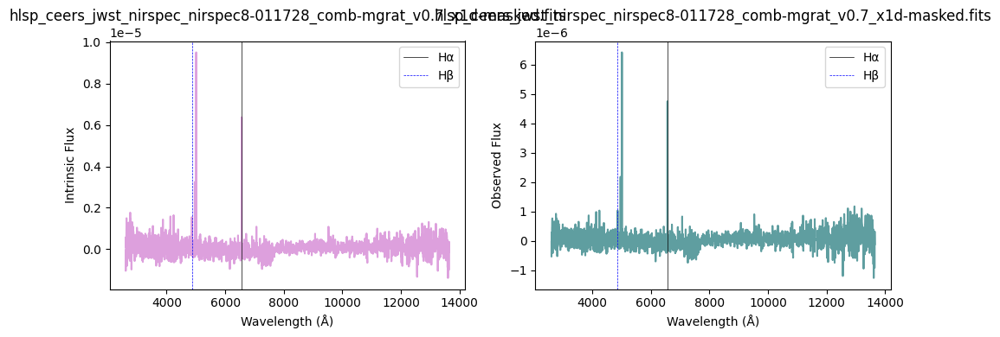

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.35216319307562
obs/intrinsic  1.1680011125699024
ebv 0.144976905546502
k [4.10541623 4.10404072 4.1026665  ... 0.87440002 0.87396519 0.87353066]


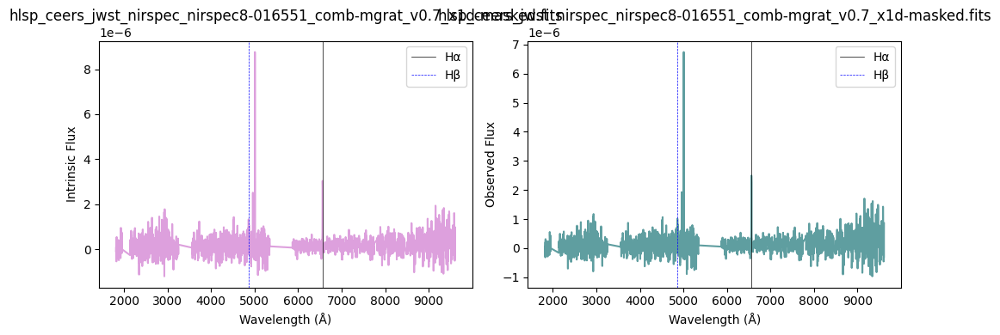

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.8950745771341087
obs/intrinsic  1.0087367864578776
ebv 0.008120934869654923
k [4.29756188 4.29609211 4.29462427 ... 0.98841943 0.98794457 0.98747003]


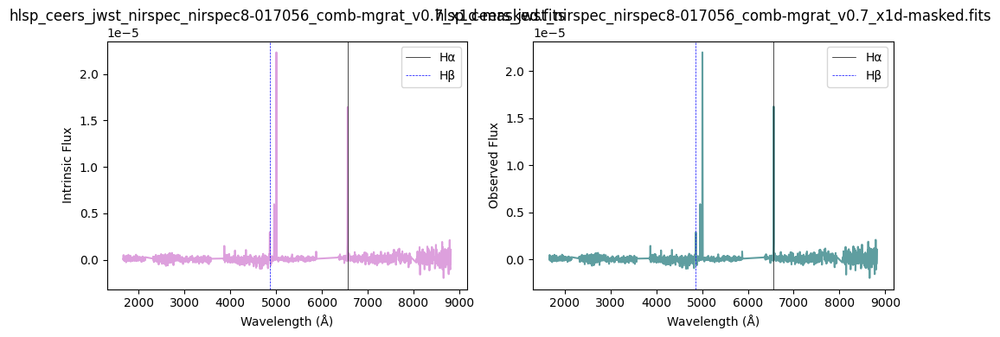

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.966113208590053
obs/intrinsic  1.033488922853677
ebv 0.0307519908230623
k [2.89928514 2.89787427 2.89646433 ... 0.32265135 0.32240593 0.32216068]


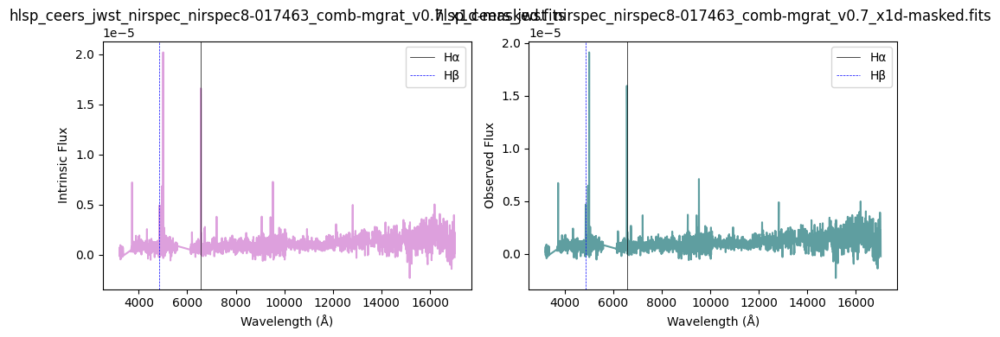

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.0698804710221737
obs/intrinsic  1.06964476342236
ebv 0.06285376046134869
k [3.08712948 3.08572134 3.08431405 ... 0.38971621 0.38944518 0.38917434]


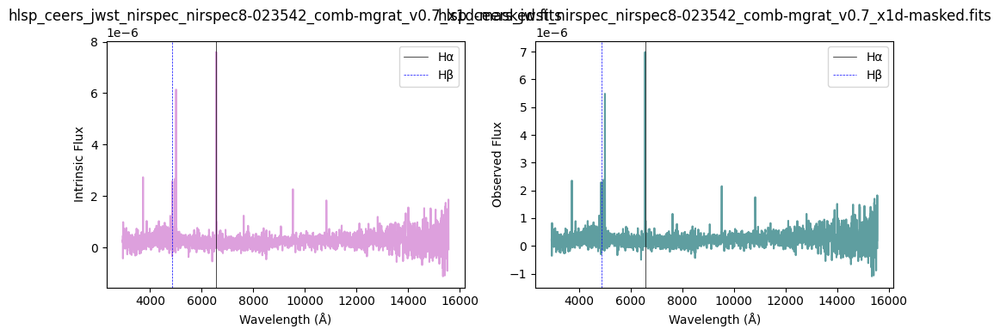

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.0914206016886894
obs/intrinsic  1.077150035431599
ebv 0.06938134150572597
k [4.44270721 4.44111542 4.43949702 ... 1.14178933 1.14123547 1.140682  ]


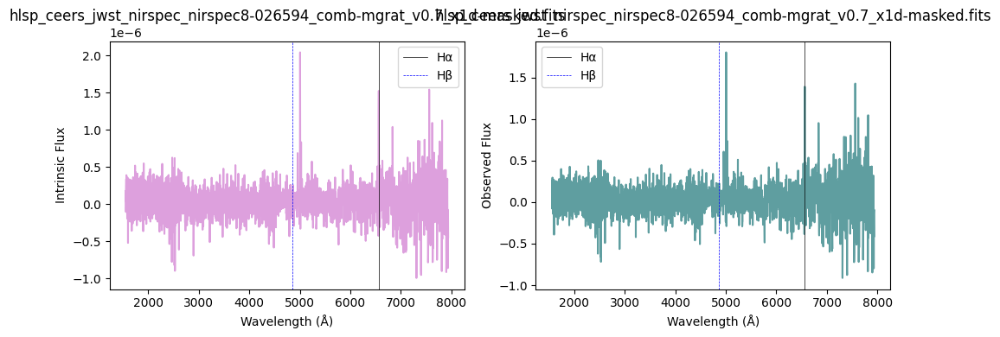

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 5.4501035893739695
obs/intrinsic  1.8989907976912785
ebv 0.5987163804749642
k [2.96206134 2.96065385 2.95924725 ... 0.34417864 0.34392651 0.34367456]


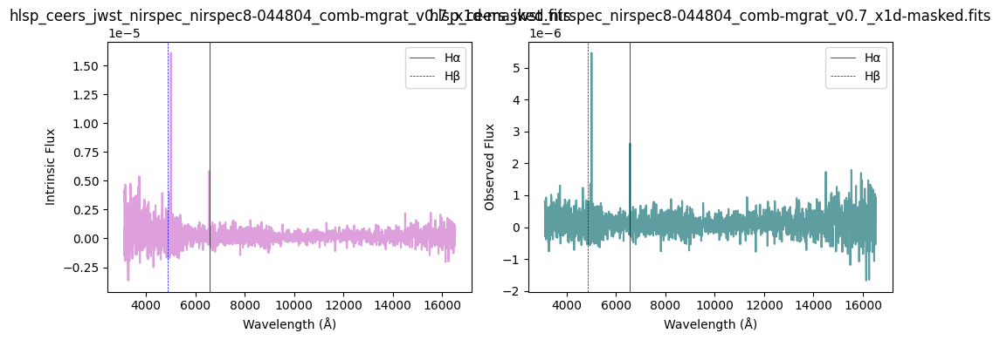

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.678862322181414
obs/intrinsic  1.2818335617356842
ebv 0.23179629913092173
k [3.63071062 3.62935594 3.628002   ... 0.61488908 0.61454128 0.61419371]


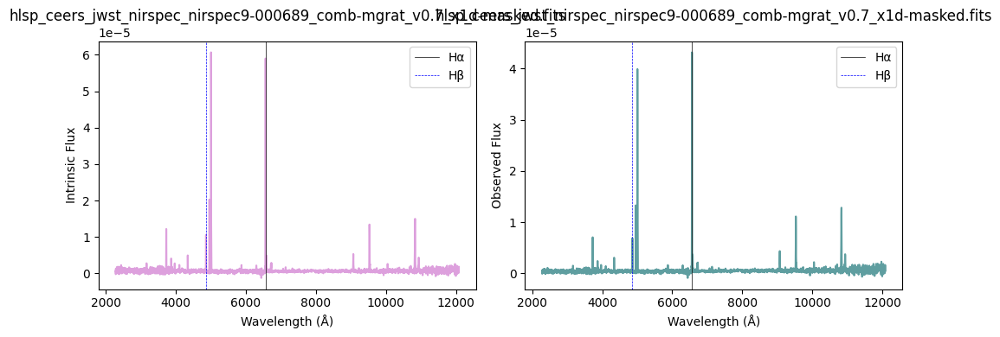

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.381717813678666
obs/intrinsic  1.526730945532636
ebv 0.3950182898978672
k [4.29790326 4.29643865 4.29497595 ... 0.98855248 0.98807687 0.98760159]


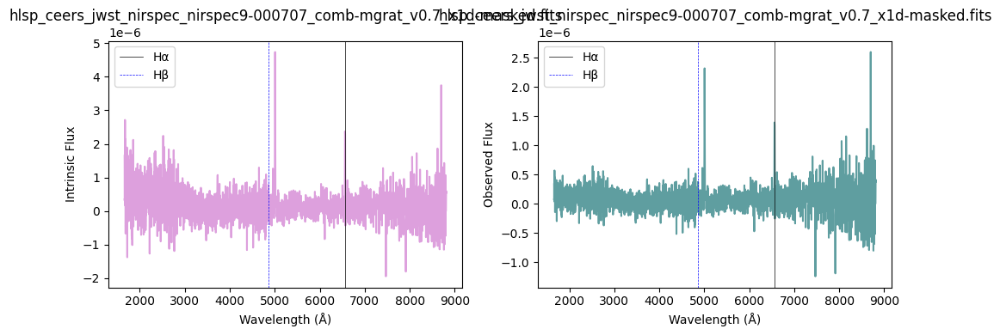

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.2746085160287866
obs/intrinsic  1.4894106327626433
ebv 0.3719141227556769
k [3.53503312 3.53366987 3.53230735 ... 0.56925769 0.56892622 0.56859497]


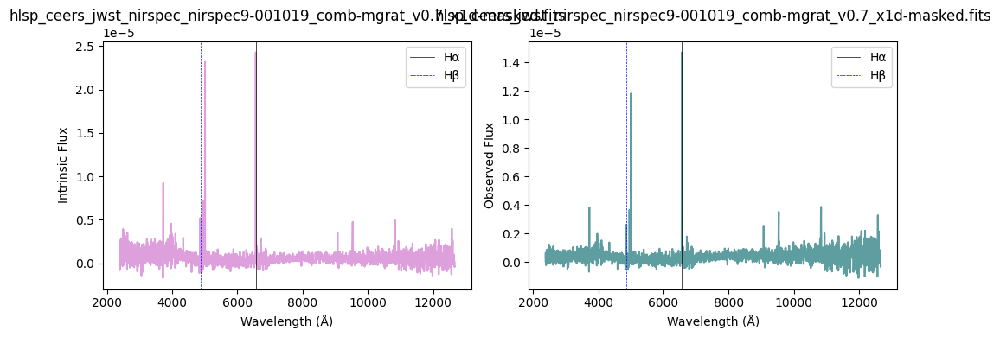

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.3283177380346225
obs/intrinsic  1.1596925916496943
ebv 0.13831230182768686
k [4.29079996 4.28933826 4.28787845 ... 1.04196101 1.04144611 1.04093158]


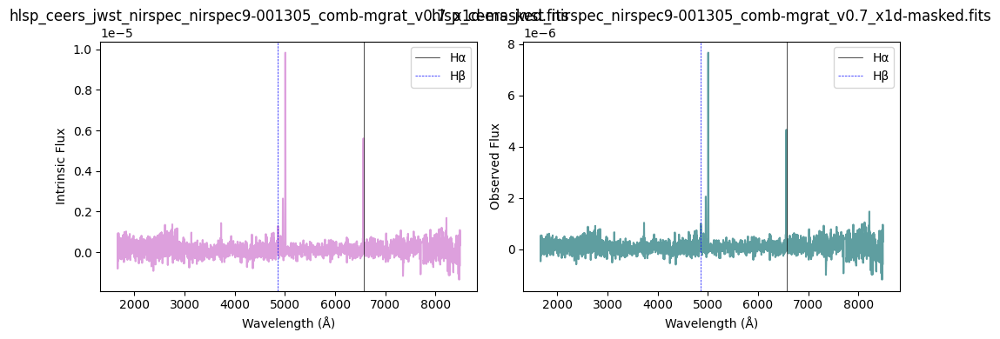

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.4204399531058503
obs/intrinsic  1.1917909244271254
ebv 0.16380067480204522
k [2.95770551 2.95629914 2.95489366 ... 0.34188081 0.34162868 0.34137672]


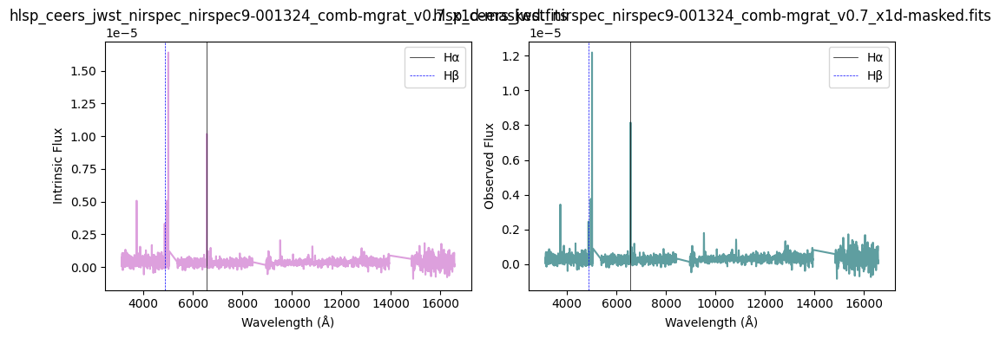

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.2901735332019517
obs/intrinsic  1.146401927944931
ebv 0.12755139242990557
k [4.33592768 4.33443485 4.33294411 ... 1.01317336 1.01268995 1.01220688]


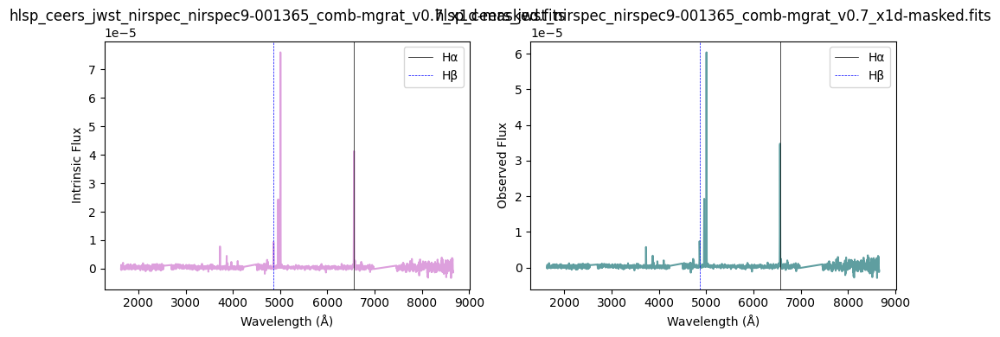

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.0513266919088213
obs/intrinsic  0.7147479762748506
ebv -0.31351475843115406
k [4.75849019 4.75647754 4.75446952 ... 1.3453886  1.34475572 1.34412329]


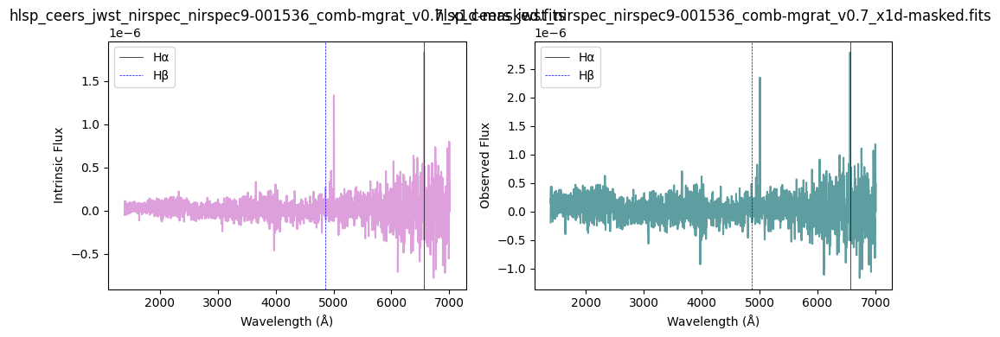

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.0311718392934073
obs/intrinsic  1.05615743529387
ebv 0.05100743937113263
k [3.06360272 3.06219472 3.06078759 ... 0.37913724 0.37887215 0.37860726]


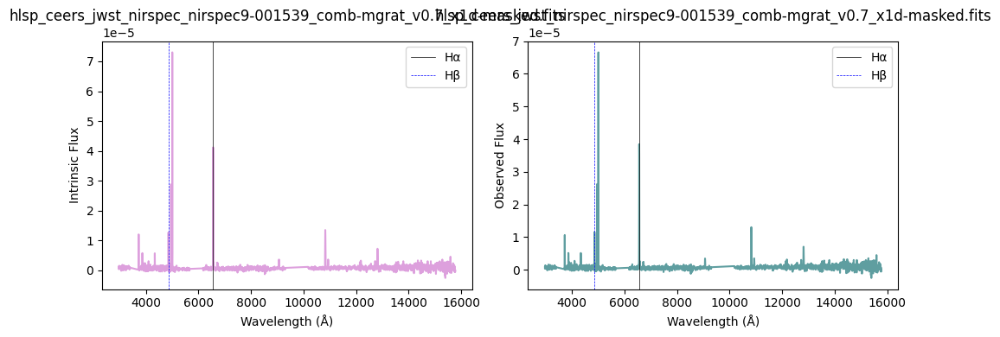

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.49908055337043
obs/intrinsic  0.8707597746935296
ebv -0.12919527446214868
k [3.59675337 3.59539814 3.59404366 ... 0.59754788 0.59720974 0.59687183]


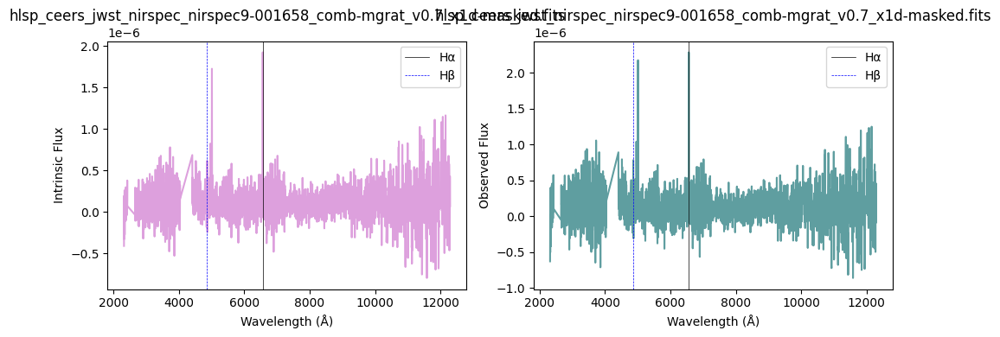

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.2122107709155836
obs/intrinsic  1.1192372024096109
ebv 0.1051636656720981
k [3.21810901 3.21671266 3.21531712 ... 0.43649433 0.43620931 0.43592448]


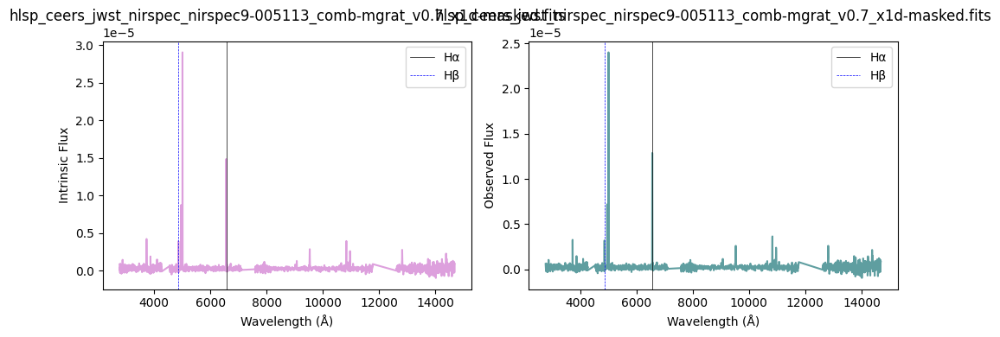

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.1504901479667344
obs/intrinsic  1.0107303695434555
ebv 0.02492104945241316
k [0.         0.         0.         ... 1.7799113  1.77920324 1.77849556]


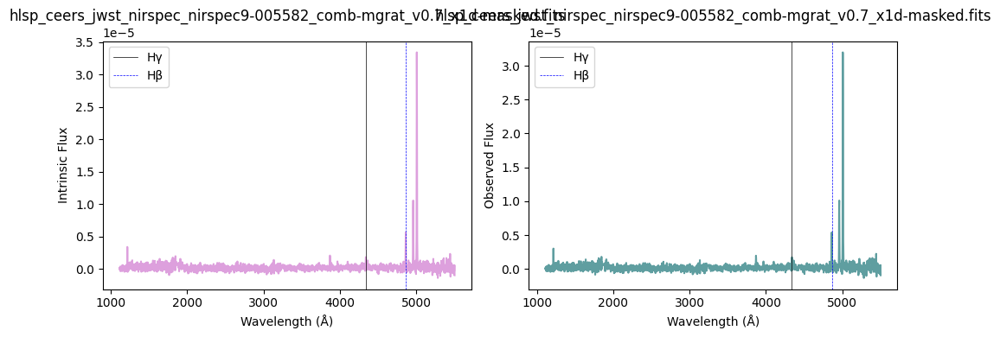

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 1.814804388312352
obs/intrinsic  0.6323360238022132
ebv -0.4278849440822968
k [2.79425432 2.79284739 2.79144142 ... 0.28923906 0.2890036  0.2887683 ]


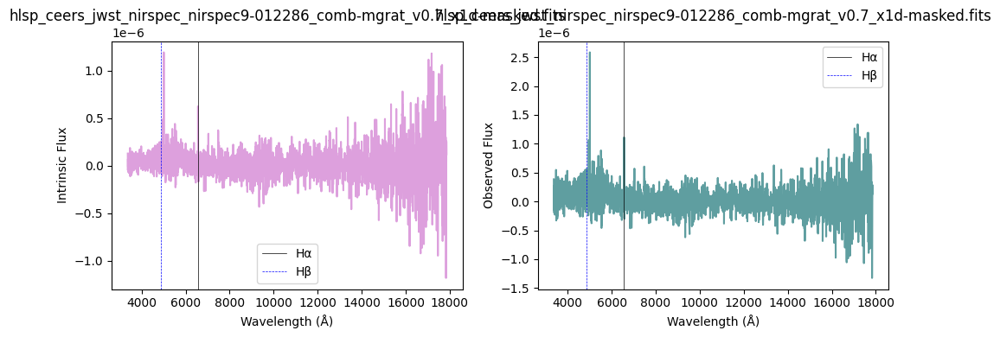

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 1.3292747765657602
obs/intrinsic  0.46316194305427183
ebv -0.7185449973943043
k [2.8192003  2.81778764 2.81637593 ... 0.3124452  0.31219596 0.31194691]


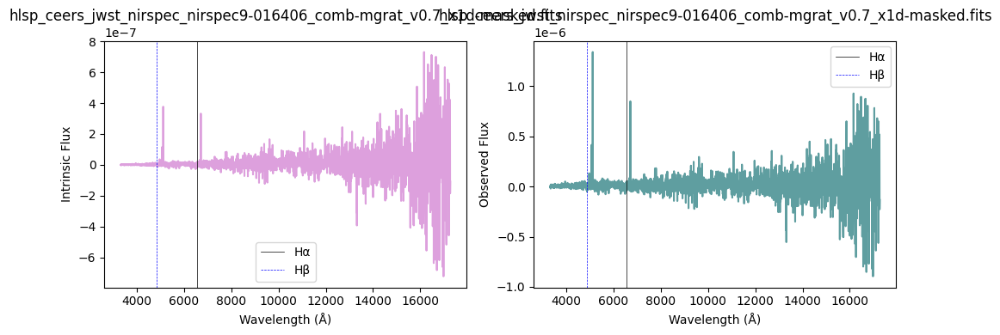

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 0.8900367900767875
obs/intrinsic  0.41831729133571366
ebv -2.034914963914928
k [5.06536161 5.062776   5.06019745 ... 1.41357833 1.41295405 1.4123302 ]


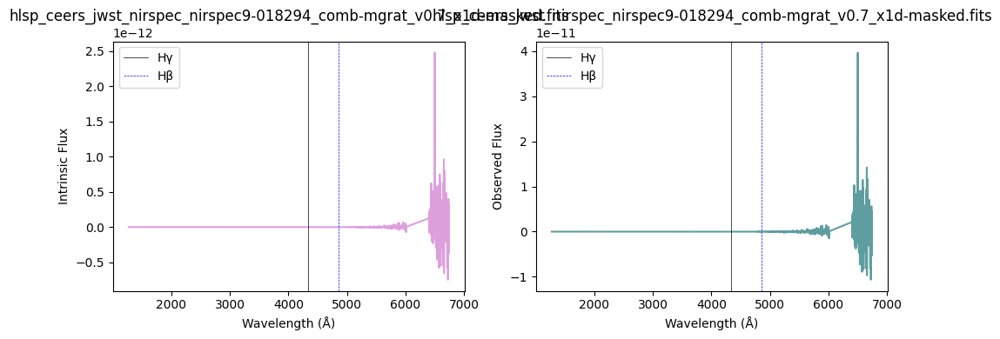

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.895032475737672
obs/intrinsic  0.8906652635959043
ebv -0.2703520702286432
k [2.64319058 2.64192257 2.64065539 ... 1.57155621 1.57093464 1.57031339]


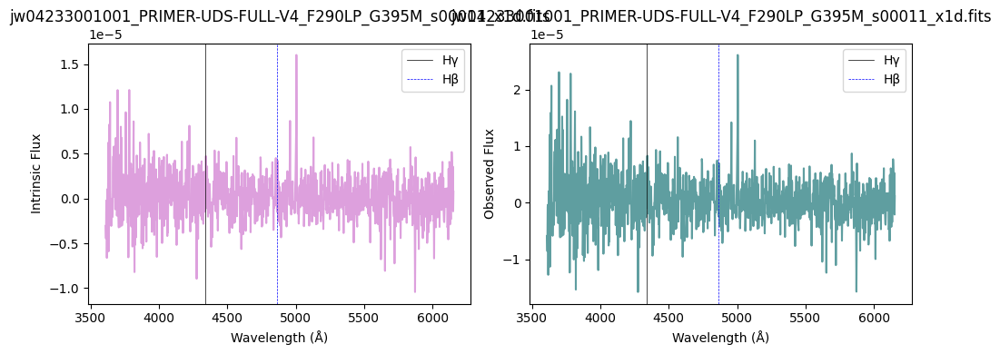

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.277518329046909
obs/intrinsic  1.0704336146510838
ebv 0.15892332643125323
k [2.59570111 2.59436977 2.59303936 ... 1.4338555  1.43323506 1.43261505]


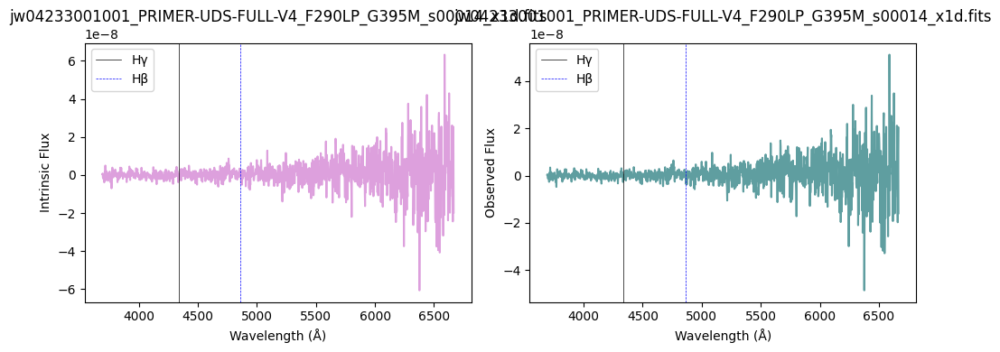

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.4995920104092866
obs/intrinsic  1.2193700384701347
ebv 0.18515803875508177
k [2.51028823 2.50895065 2.50761404 ... 1.36221386 1.36160675 1.36100007]


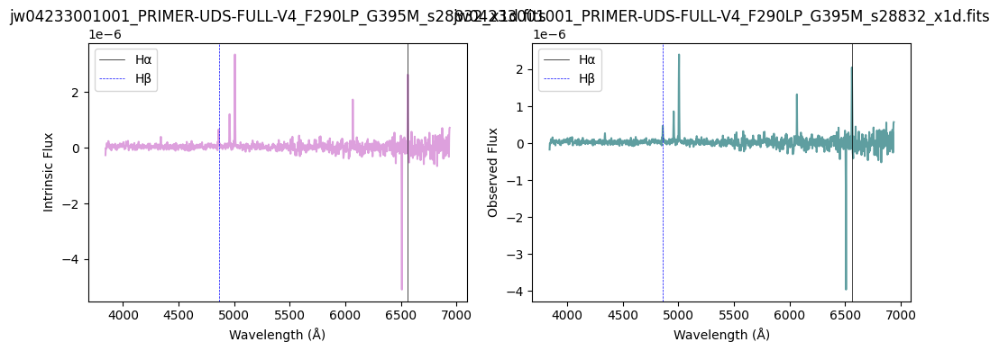

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.3176795807499753
obs/intrinsic  1.089309402951508
ebv 0.1997379166223464
k [2.65937711 2.6580344  2.65669262 ... 1.48993929 1.48929398 1.48864912]


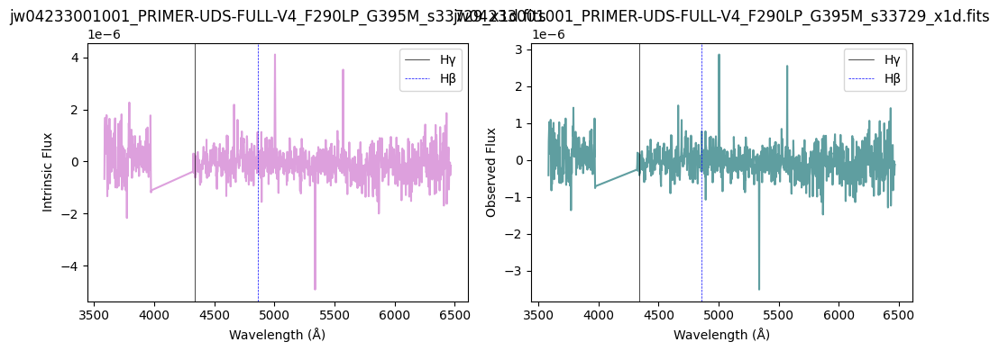

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.500380703039308
obs/intrinsic  1.1751789304274172
ebv 0.37690320679575606
k [2.7627995  2.76145186 2.76010511 ... 1.566573   1.56595475 1.56533682]


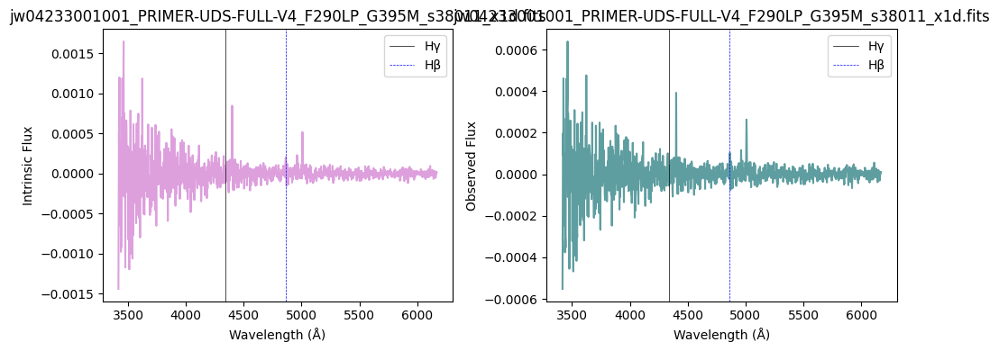

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.1320252104450064
obs/intrinsic  1.002051848908251
ebv 0.004785987629374833
k [2.72501411 2.72367101 2.72232881 ... 1.53481918 1.53420754 1.53359622]


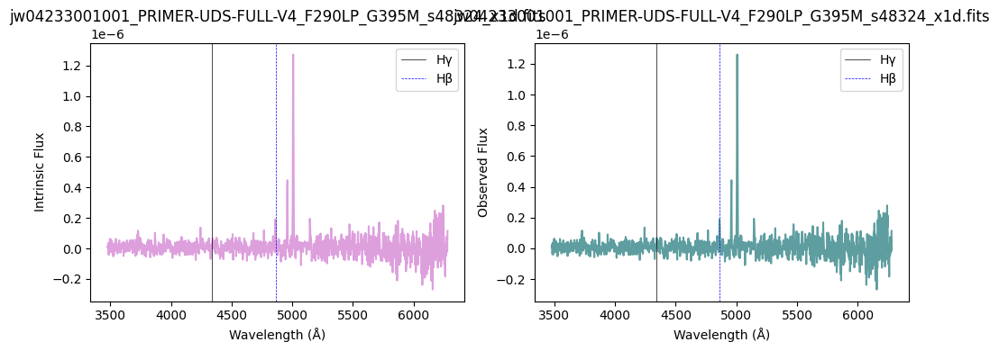

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.056965451814382
obs/intrinsic  0.9667737623518894
ebv -0.0788986268324813
k [2.57291801 2.57157534 2.57023363 ... 1.41508733 1.41446161 1.41383632]


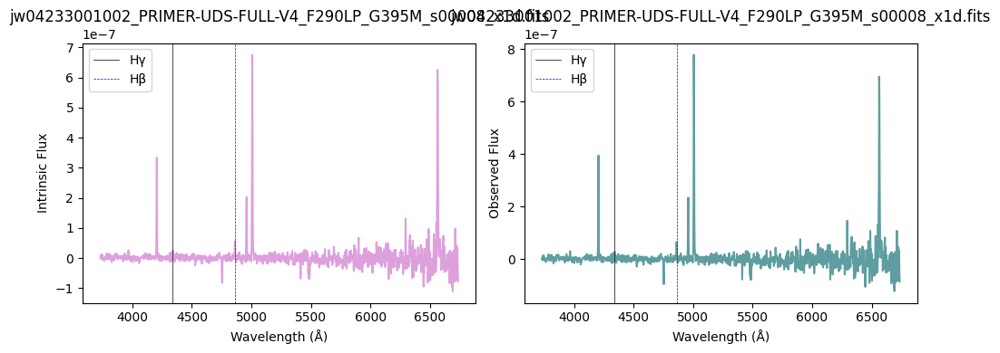

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.0582232992669387
obs/intrinsic  0.9673649506545906
ebv -0.07747124688573592
k [2.67647491 2.6751281  2.67378222 ... 1.50307358 1.5024205  1.50176788]


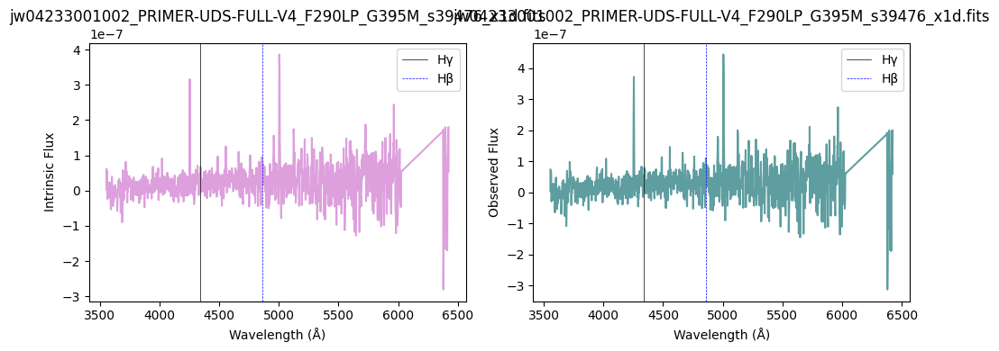

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.9665016663918977
obs/intrinsic  0.9242557832033601
ebv -0.1839130285074271
k [3.13453602 3.13318572 3.13183619 ... 1.88890181 1.8882282  1.88755492]


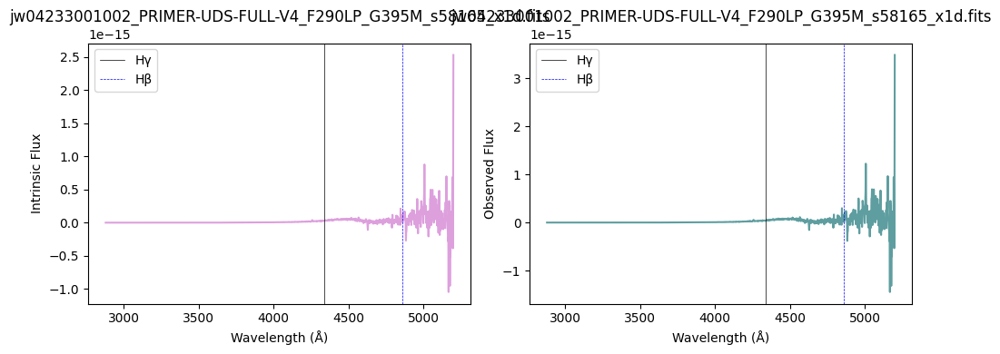

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.2543816076790675
obs/intrinsic  1.0595593556082081
ebv 0.13508220716900637
k [3.00788634 3.00653031 3.0051751  ... 1.7764642  1.77580421 1.77514454]


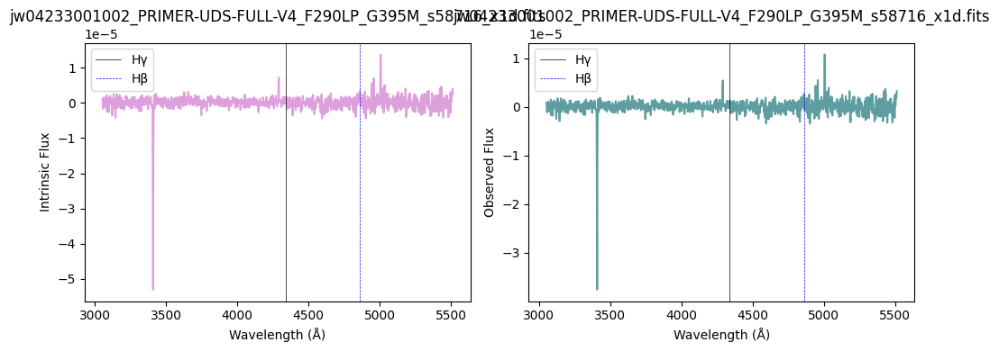

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.047431651389822
obs/intrinsic  1.4102549307978471
ebv 0.3209321299697449
k [2.42367474 2.42235228 2.42103081 ... 1.29170848 1.29112923 1.29055038]


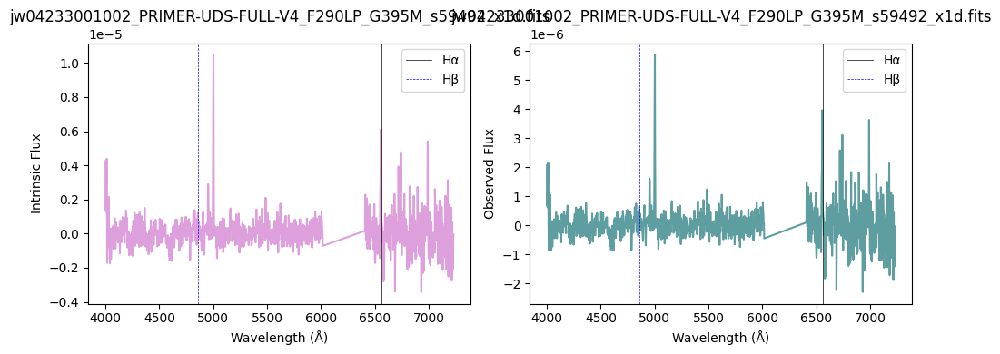

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.3890079925903493
obs/intrinsic  1.1228337565164537
ebv 0.27051322929923416
k [2.69991248 2.69856541 2.69721925 ... 1.60314513 1.60248353 1.60182228]


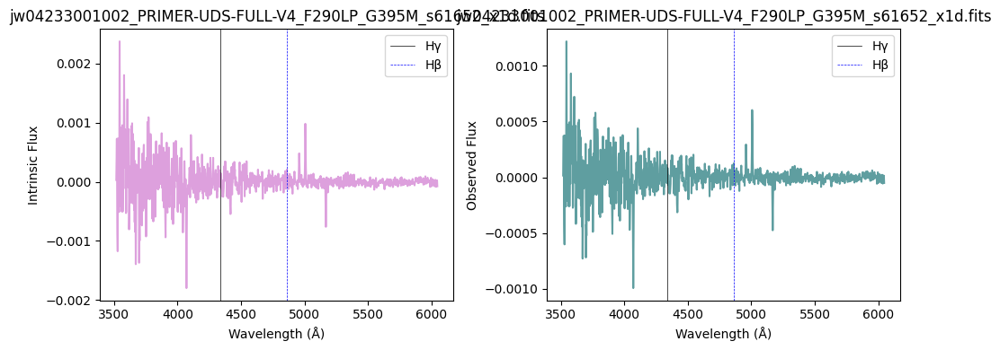

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.2072251850386615
obs/intrinsic  1.0373958369672374
ebv 0.08572312286389408
k [2.70196771 2.7006174  2.699268   ... 1.58349469 1.58284299 1.58219164]


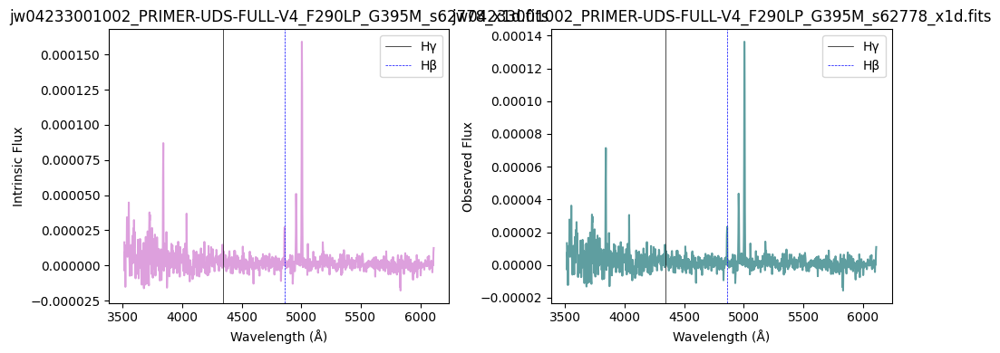

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.253183766613221
obs/intrinsic  1.481945563279868
ebv 0.3672232392000181
k [2.41768868 2.41636846 2.41504924 ... 1.2883974  1.2878179  1.2872388 ]


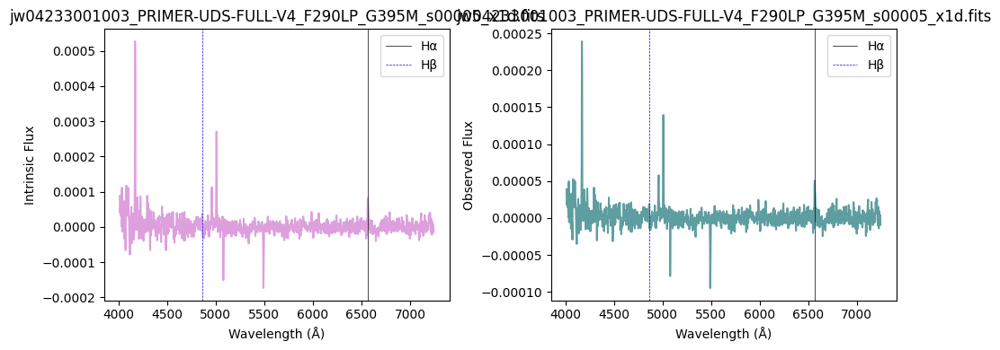

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.4358638154642827
obs/intrinsic  1.1971650924962658
ebv 0.16800095655563013
k [2.52353017 2.52219952 2.52086984 ... 1.37281877 1.37221325 1.37160815]


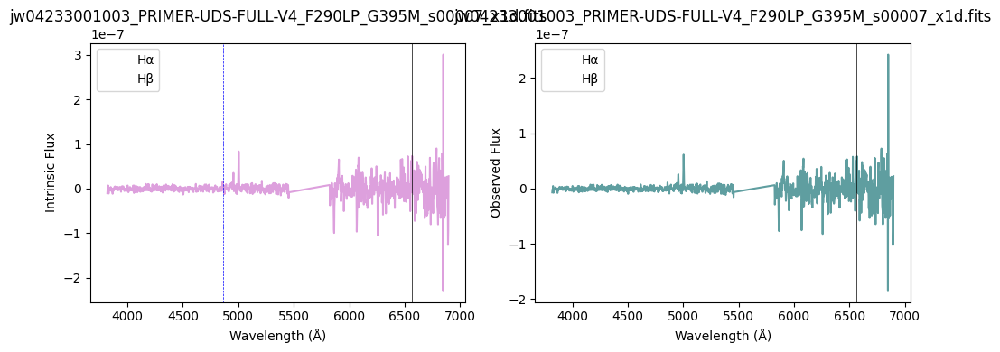

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.0409402430432952
obs/intrinsic  0.9592419142294855
ebv -0.09716049961007596
k [2.80625739 2.80490387 2.80355124 ... 1.60354862 1.60292012 1.60229194]


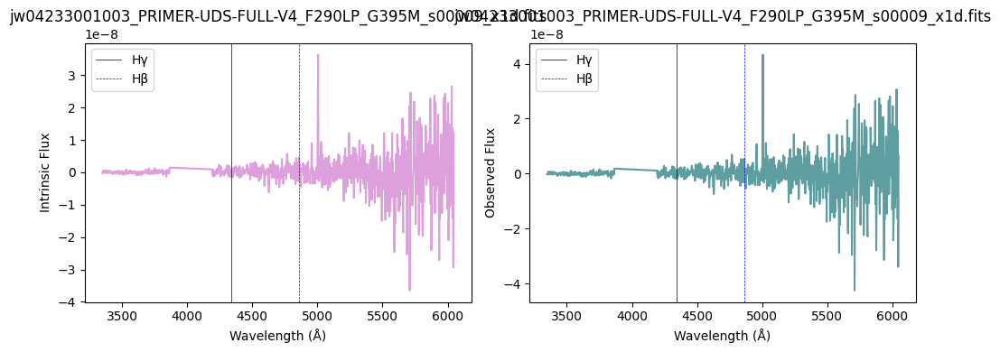

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.979303330979563
obs/intrinsic  0.9302725655595573
ebv -0.16876229315260538
k [2.72769676 2.72634909 2.72500233 ... 1.53819889 1.53758452 1.53697047]


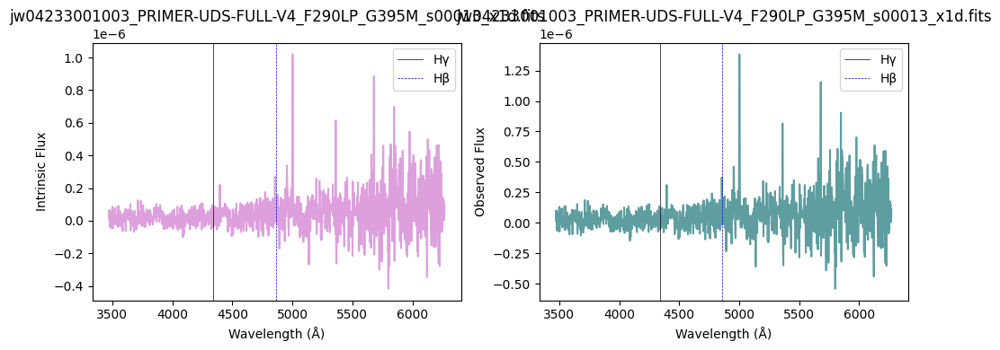

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.1300865098119615
obs/intrinsic  1.0011406596107209
ebv 0.002661827194145451
k [2.68575516 2.68445854 2.68316277 ... 1.5720067  1.57138468 1.57076298]


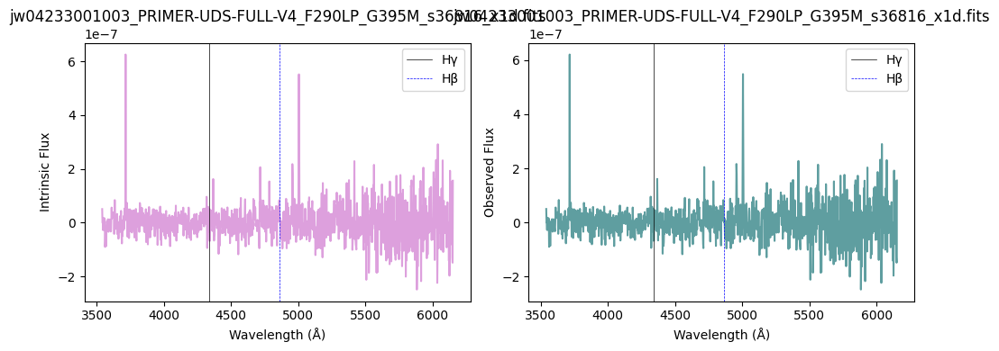

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.9732790918746452
obs/intrinsic  0.9274411731802485
ebv -0.17587971922539053
k [2.6445768  2.643235   2.64189413 ... 1.4762247  1.47558083 1.4749374 ]


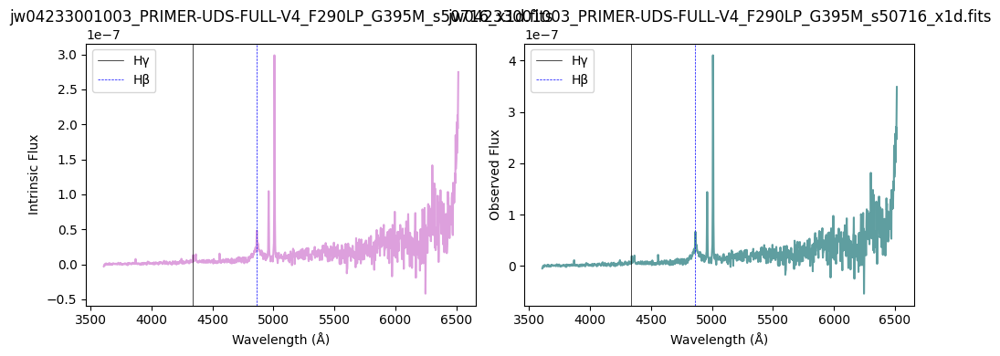

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.9575134560718717
obs/intrinsic  0.9200313243529517
ebv -0.1946096019170384
k [2.63239649 2.6310519  2.62970824 ... 1.46433059 1.46369321 1.46305626]


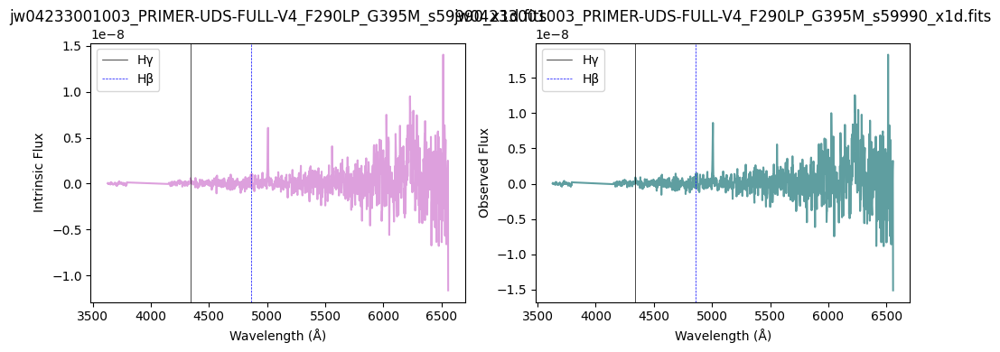

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.9449248490301296
obs/intrinsic  1.0261062191742611
ebv 0.024059157036369298
k [2.41881229 2.41749269 2.41617409 ... 1.28863633 1.28805827 1.2874806 ]


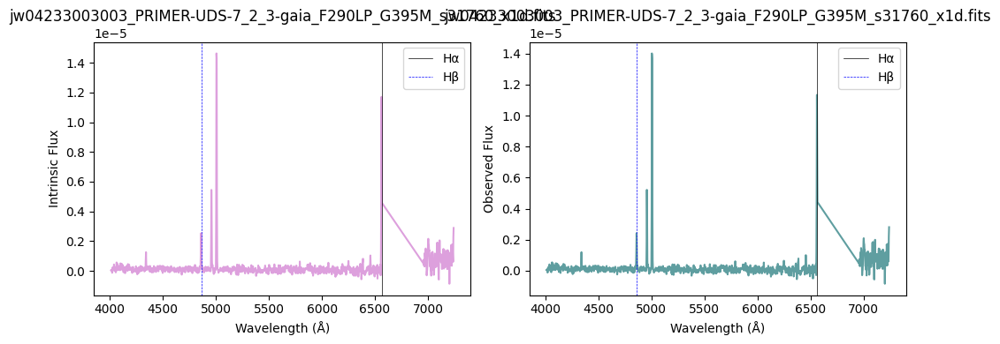

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.054891665402346
obs/intrinsic  1.0644221830670195
ebv 0.05828443009078337
k [2.5600395  2.55870349 2.55736844 ... 1.40383111 1.40321375 1.40259682]


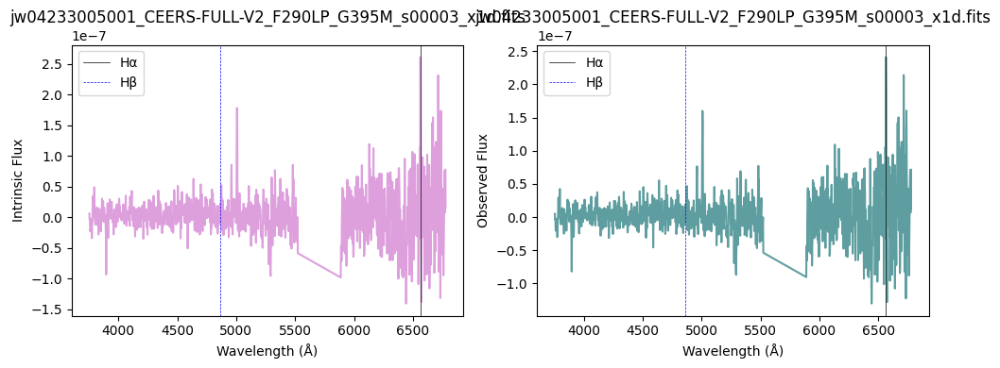

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.2656353532873625
obs/intrinsic  0.7894199837238197
ebv -0.2207478157357921
k [2.51181081 2.51048009 2.50915033 ... 1.36412256 1.36351897 1.36291579]


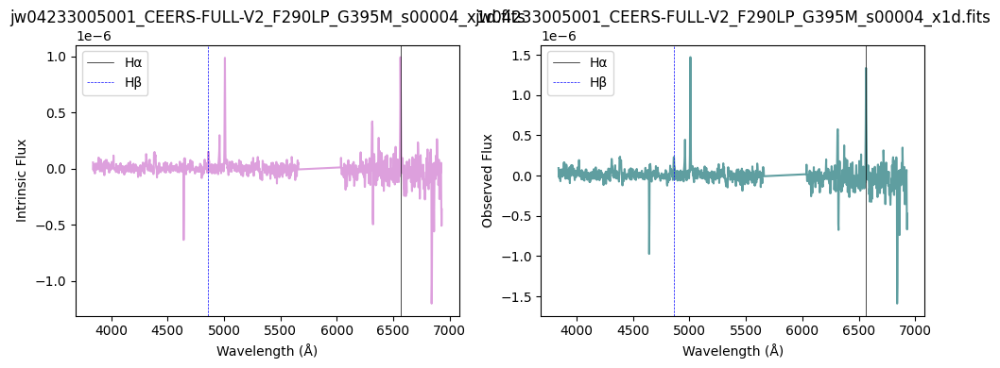

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.0463642479882256
obs/intrinsic  0.9617911965536005
ebv -0.09096345386498476
k [2.84780058 2.84645276 2.84510579 ... 1.63769504 1.63706594 1.63643716]


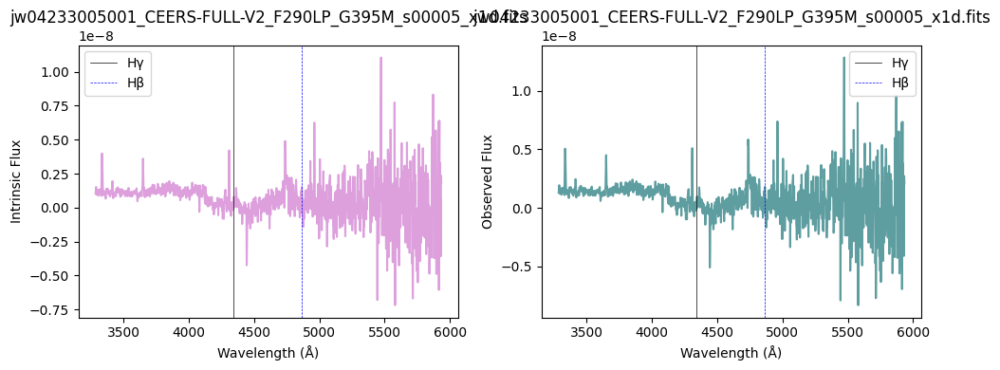

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.1653162688192293
obs/intrinsic  0.7544655988917175
ebv -0.2630278542841443
k [2.43957582 2.43825341 2.43693199 ... 1.30521525 1.30463001 1.30404518]


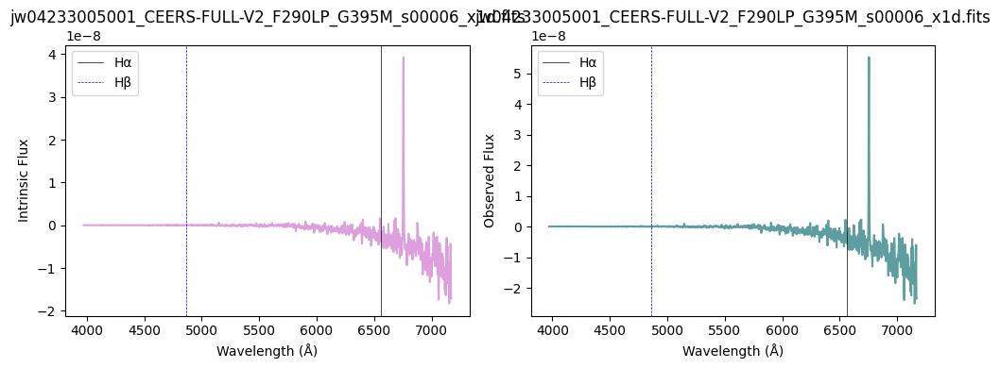

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.6317155592898285
obs/intrinsic  0.9169740624703234
ebv -0.08091777431340395
k [2.53406137 2.5327239  2.5313874  ... 1.38330426 1.38269142 1.38207901]


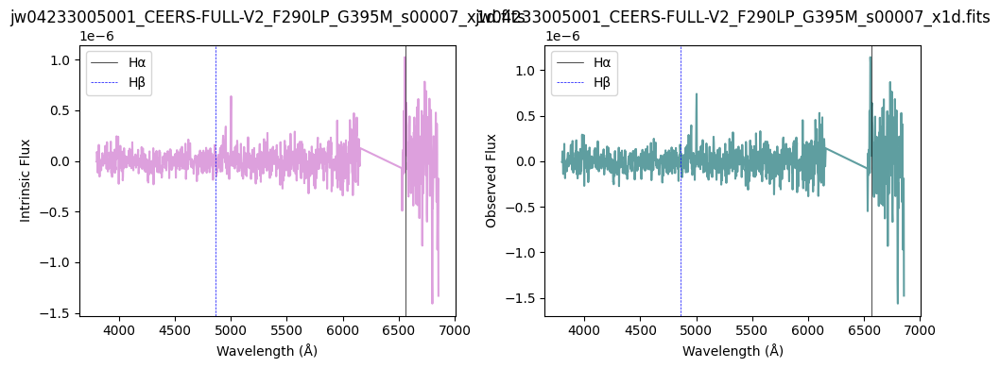

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.0451691448700435
obs/intrinsic  0.4912294980884784
ebv -1.6597610855641374
k [2.67848946 2.67714295 2.67579737 ... 1.50571036 1.50505872 1.50440754]


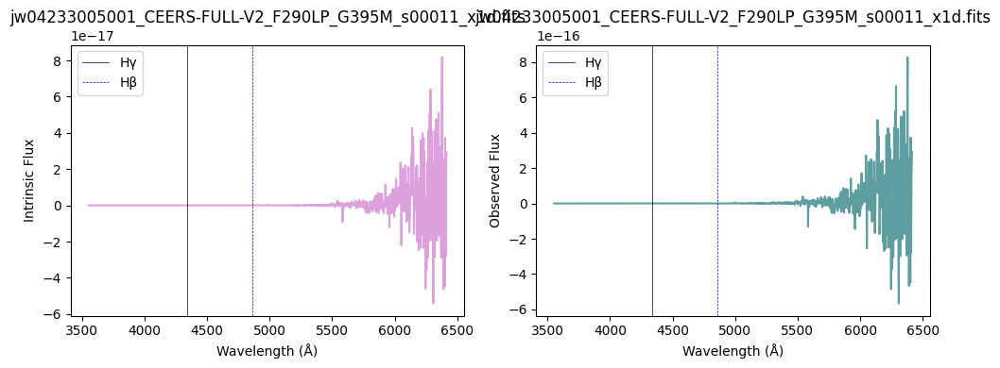

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.1189501116307117
obs/intrinsic  0.9959065524655382
ebv -0.009577474319430294
k [2.76707324 2.76571921 2.76436608 ... 1.60548408 1.60483987 1.60419601]


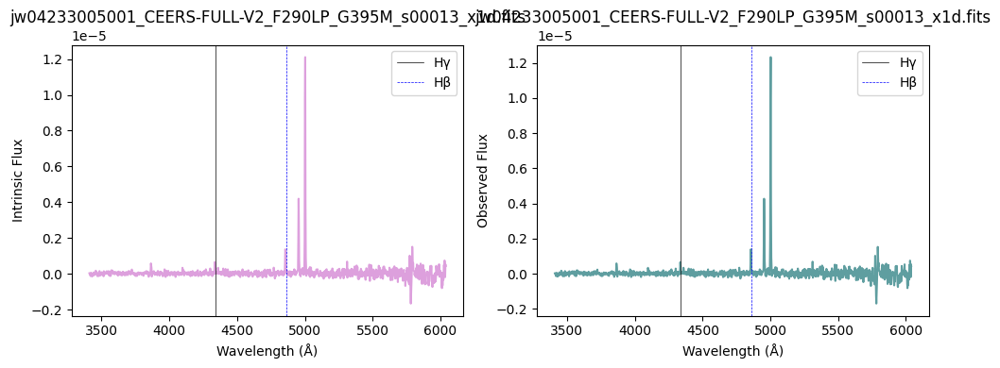

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.060573357316992
obs/intrinsic  0.9684694779381148
ebv -0.07480678416372441
k [2.69072634 2.68938294 2.68804045 ... 1.51753475 1.5168788  1.5162233 ]


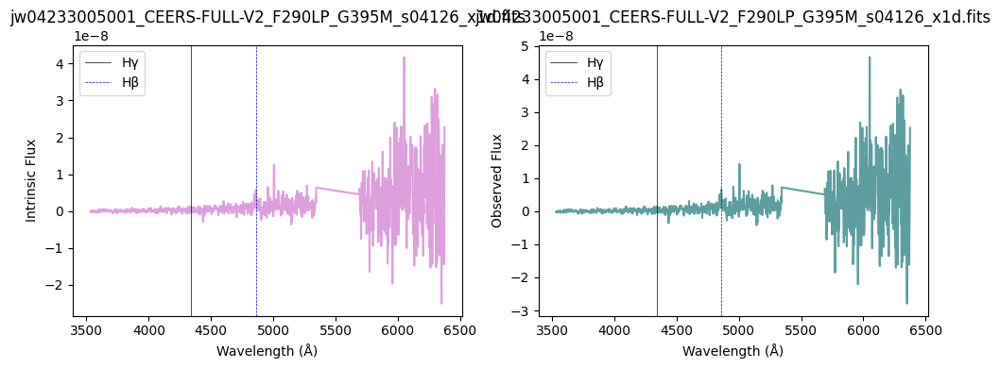

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.4364779598508703
obs/intrinsic  0.8489470243382823
ebv -0.1528792123510501
k [2.41834251 2.4170268  2.41571209 ... 1.28720702 1.28663464 1.28606266]


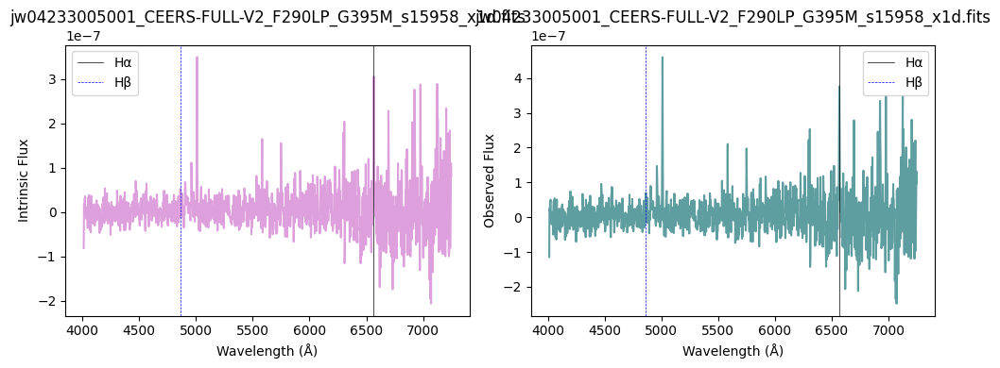

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 4.295419581258188
obs/intrinsic  1.4966618750028529
ebv 0.3764481854317431
k [2.55189139 2.55055019 2.54920994 ... 1.39716544 1.39654579 1.39592656]


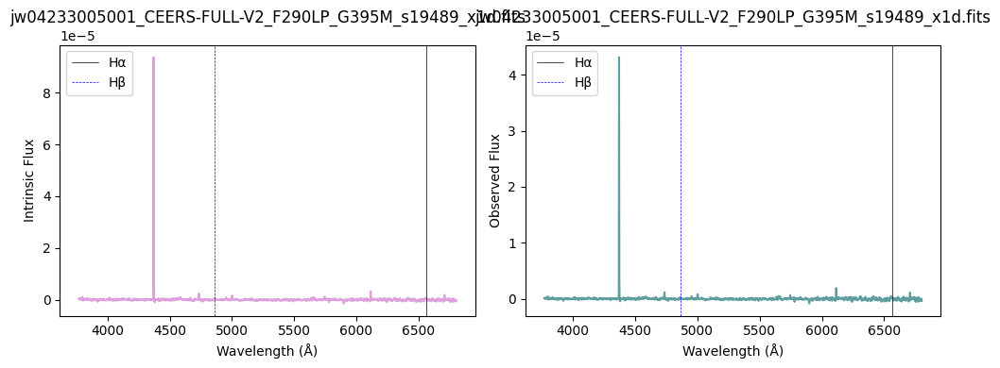

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.048109241898914
obs/intrinsic  0.9626113436916233
ebv -0.08897325148498914
k [2.87492056 2.87356244 2.87220517 ... 1.67182305 1.67117586 1.670529  ]


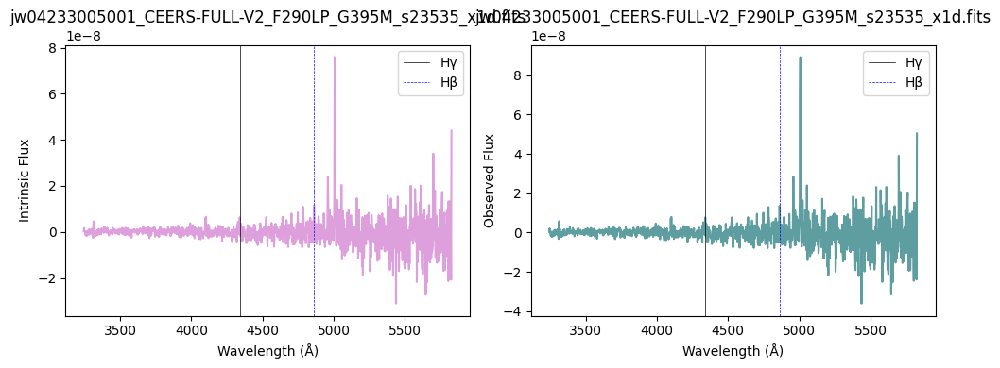

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.0710310080677643
obs/intrinsic  0.9733845737909732
ebv -0.06298677818021364
k [2.64743984 2.64609833 2.64475775 ... 1.47852269 1.47787944 1.47723663]


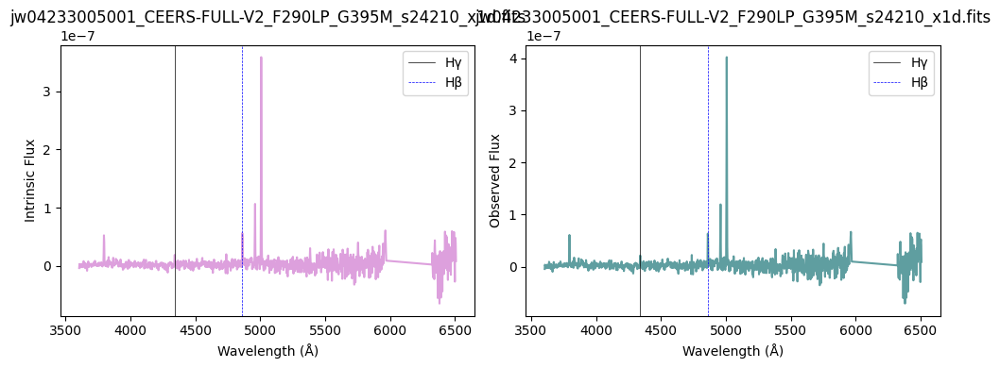

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.647983707689498
obs/intrinsic  0.9226424068604523
ebv -0.07516463467712091
k [2.42040181 2.41908136 2.41776191 ... 1.29024303 1.28966486 1.28908708]


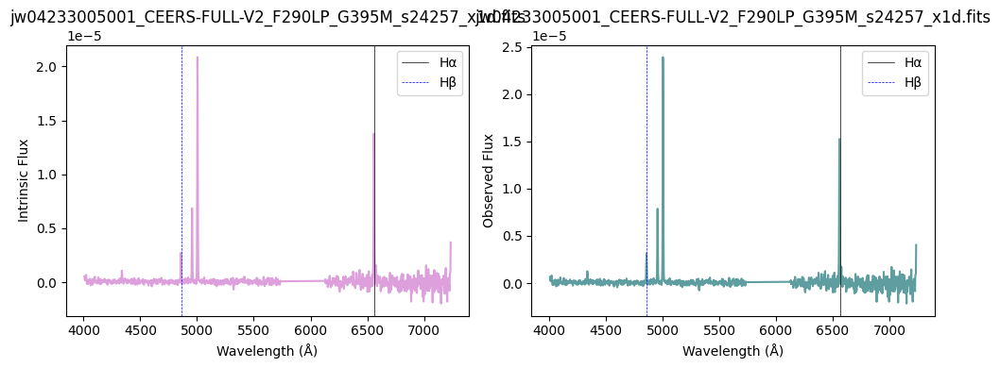

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.084931792450896
obs/intrinsic  0.9799179424510392
ebv -0.04736715193185461
k [2.63613322 2.63478924 2.63344621 ... 1.46937189 1.46873254 1.46809364]


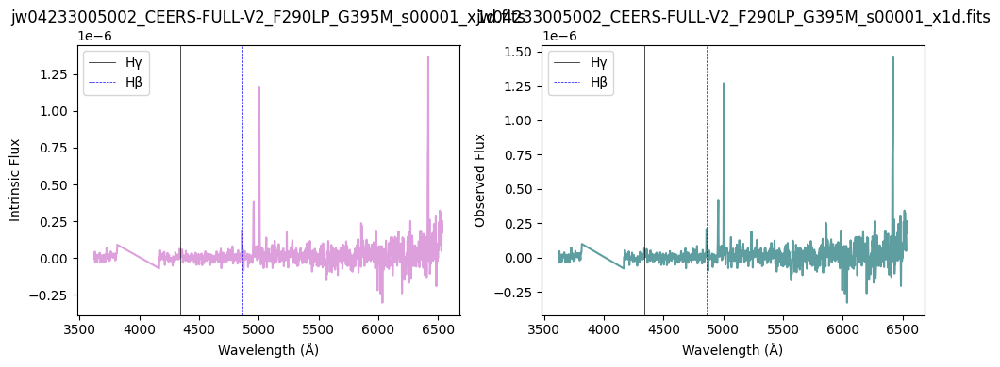

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.0414019119140723
obs/intrinsic  0.9594588985987504
ebv -0.09663239184271162
k [3.10900928 3.10768871 3.10636889 ... 1.8972805  1.89661215 1.89594412]


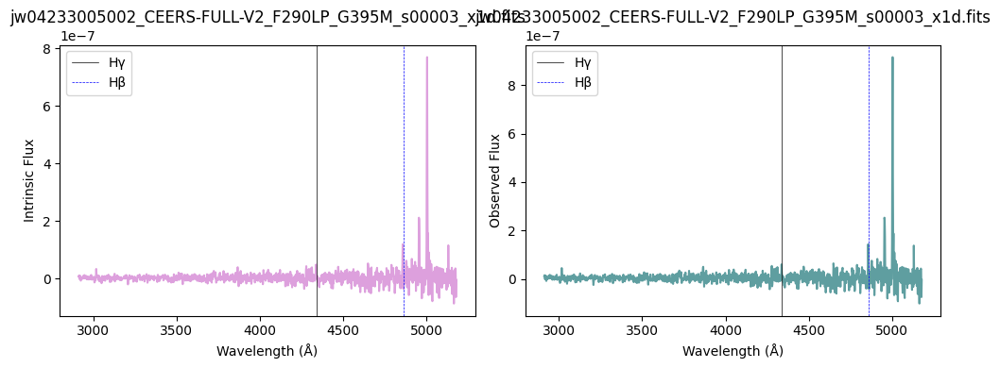

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.2366268232467066
obs/intrinsic  0.7793124819674936
ebv -0.23277809064215005
k [2.52223951 2.52091038 2.51958221 ... 1.37310426 1.37250101 1.37189817]


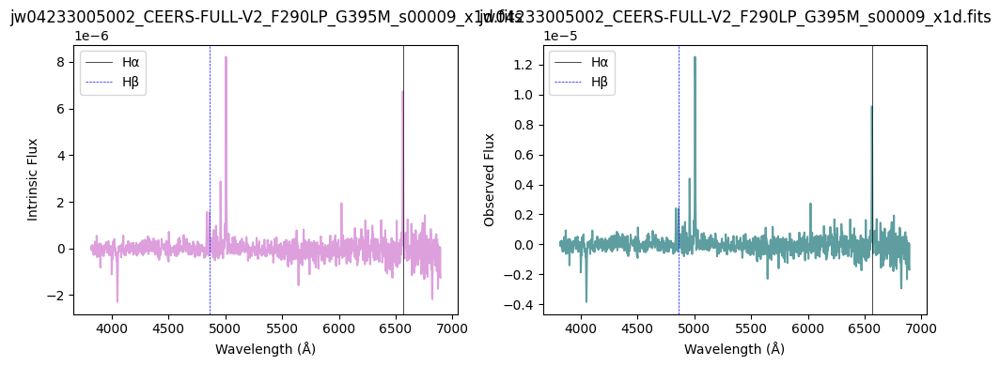

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 3.04390160081928
obs/intrinsic  1.0605928922715262
ebv 0.05491984587312298
k [2.42158537 2.42026422 2.41894406 ... 1.29133034 1.29075209 1.29017425]


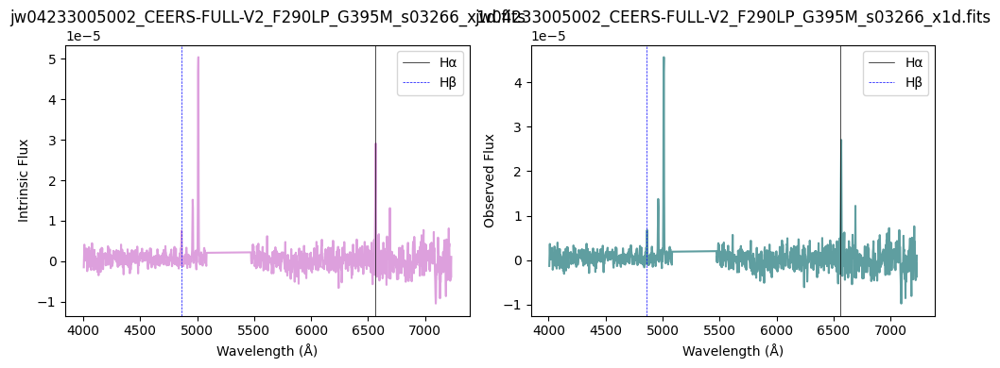

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.210730452771368
obs/intrinsic  1.0390433128016077
ebv 0.08942823450265064
k [2.7692946  2.76794309 2.76659247 ... 1.58812521 1.58749173 1.58685859]


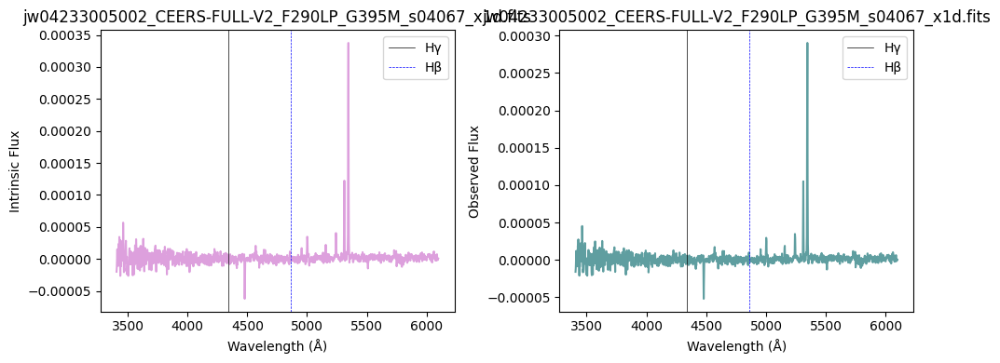

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.7894987194177037
obs/intrinsic  0.971950773316273
ebv -0.026560039467400674
k [2.4697754  2.46845138 2.46712835 ... 1.32899182 1.32840423 1.32781705]


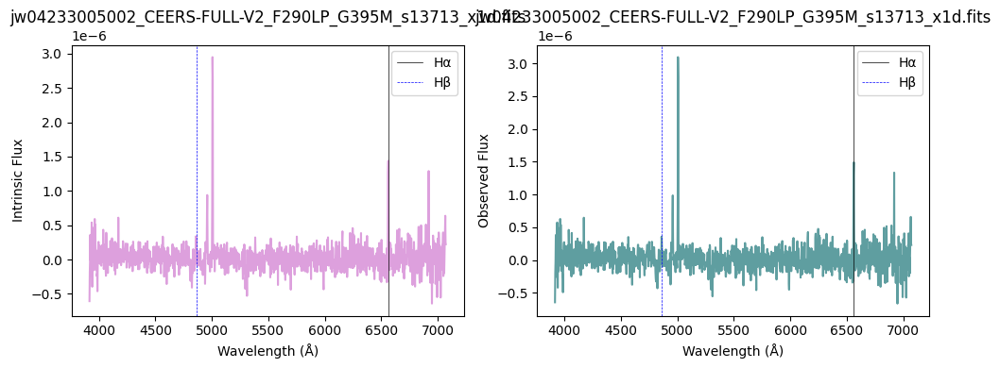

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.713225153802838
obs/intrinsic  0.8052158222866092
ebv -0.5058478490492376
k [2.77423609 2.77292428 2.77161331 ... 1.62391879 1.62329071 1.62266296]


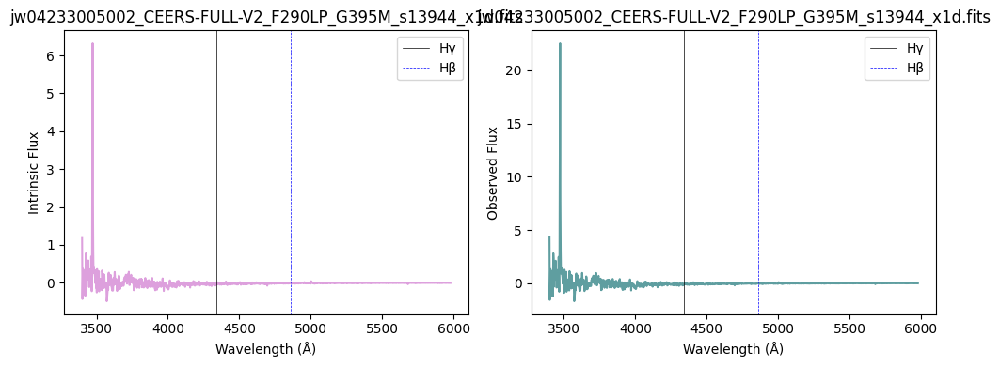

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.2290503917629185
obs/intrinsic  1.047653684127629
ebv 0.10869755133331963
k [2.63171647 2.63037005 2.62902458 ... 1.46699351 1.46635036 1.46570766]


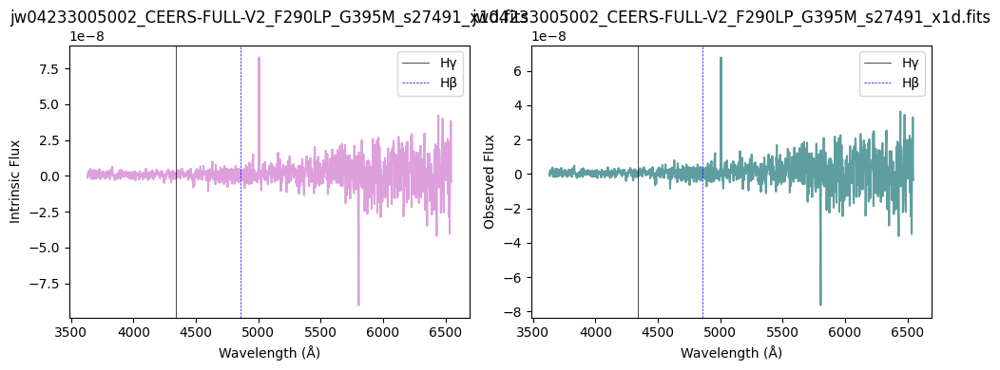

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.1313833654849867
obs/intrinsic  1.0017501817770422
ebv 0.00408295651389583
k [2.67754446 2.67620015 2.67485677 ... 1.50445092 1.50380027 1.50315006]


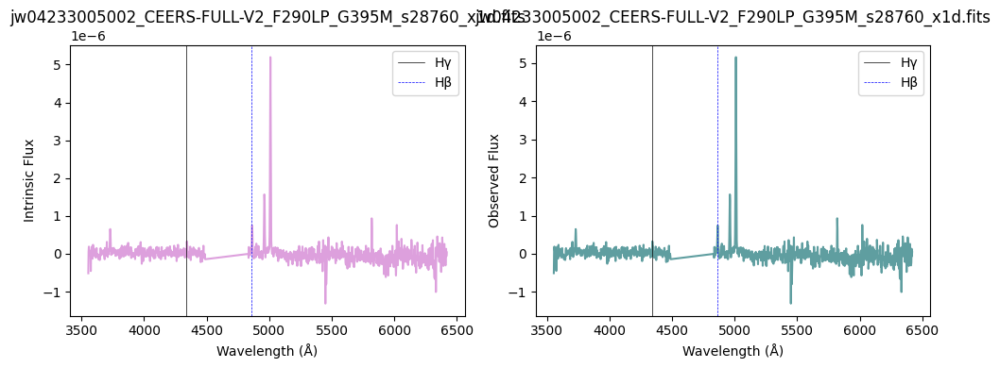

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.131788390888798
obs/intrinsic  1.0019405437168334
ebv 0.004526617048007433
k [2.77786858 2.77651314 2.7751586  ... 1.57801502 1.57738854 1.5767624 ]


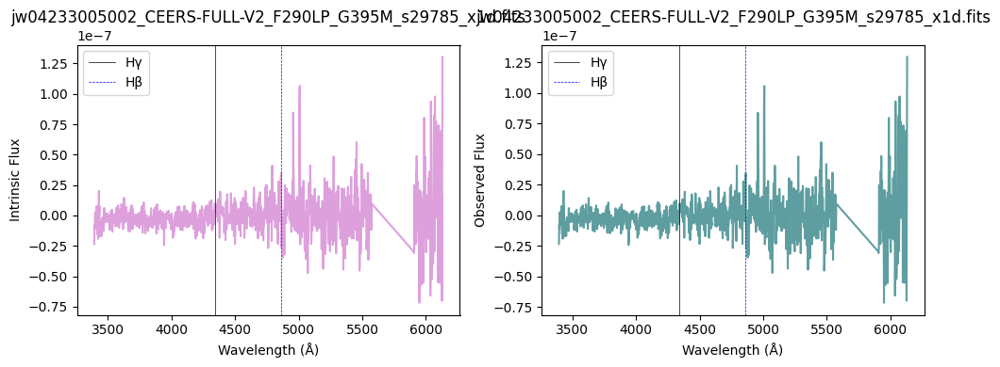

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 1.7100582005245095
obs/intrinsic  0.595839094259411
ebv -0.48338565178284365
k [2.41679659 2.41547679 2.41415797 ... 1.28759741 1.28701806 1.28643911]


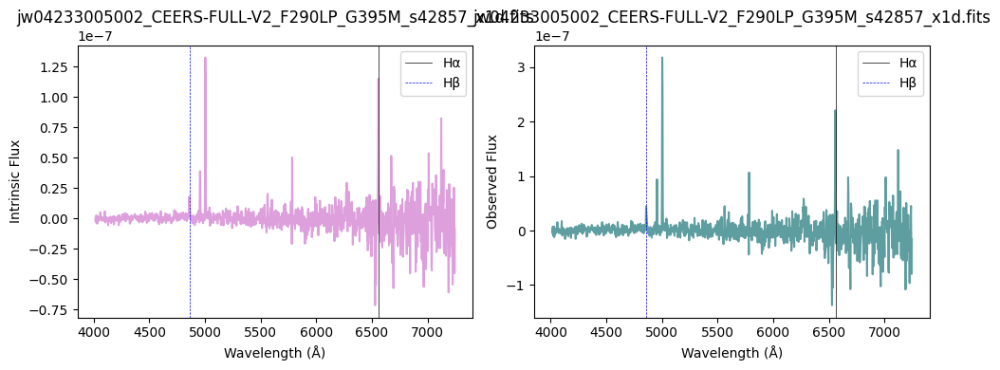

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.6168709743422993
obs/intrinsic  0.9118017332203133
ebv -0.08619859543020769
k [2.41834707 2.41702837 2.41571067 ... 1.28794688 1.28737302 1.28679956]


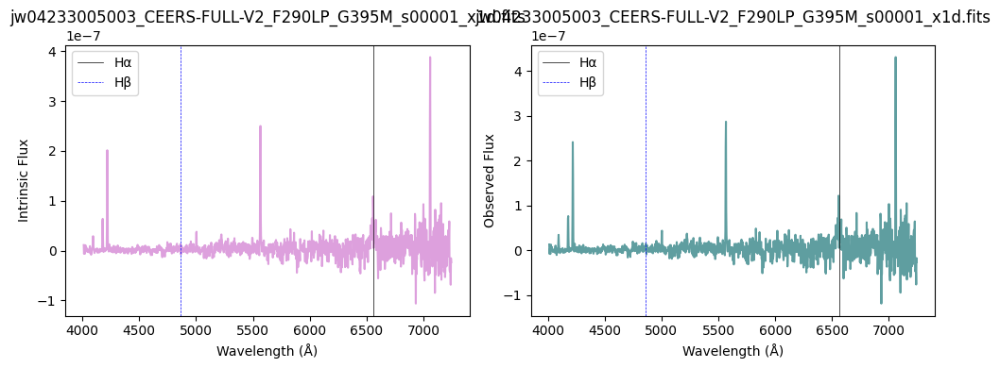

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.7613720773862371
obs/intrinsic  0.8278448763707864
ebv -0.44113459553933604
k [2.59677511 2.59543306 2.59409196 ... 1.43398557 1.43335793 1.43273071]


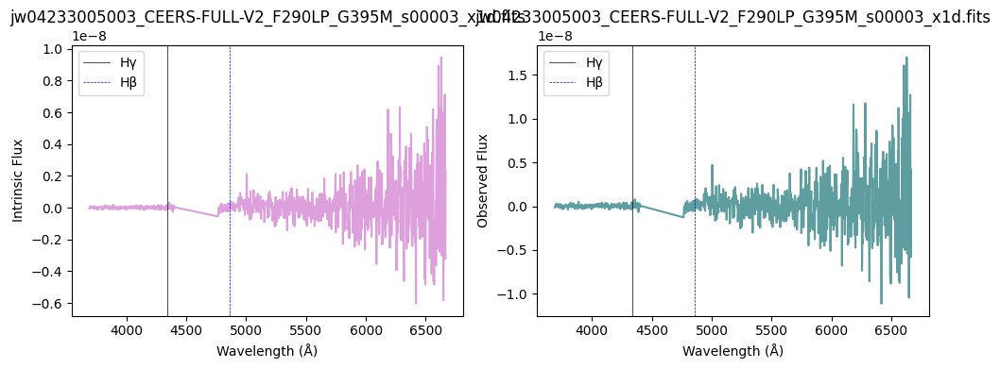

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.9585933685403416
obs/intrinsic  0.920538883213132
ebv -0.19332184052903423
k [2.59872579 2.59738144 2.59603804 ... 1.43629522 1.43566302 1.43503127]


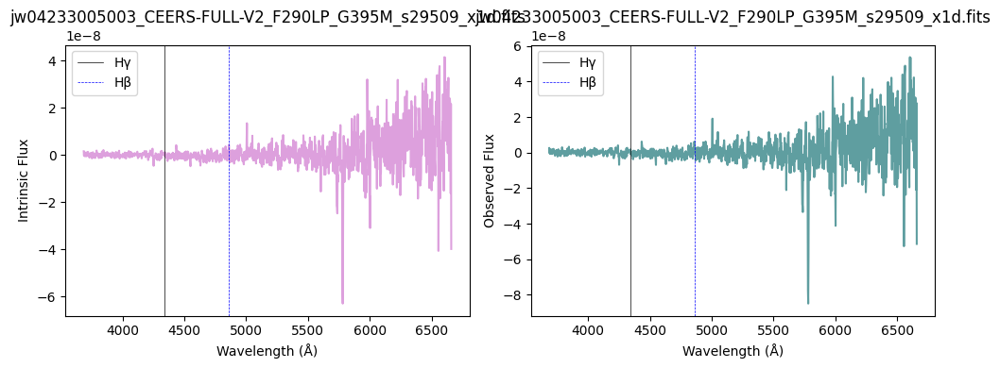

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.30147555219624
obs/intrinsic  1.0816935095312592
ebv 0.18335604207009065
k [2.79187869 2.79052606 2.78917432 ... 1.59048071 1.58985341 1.58922643]


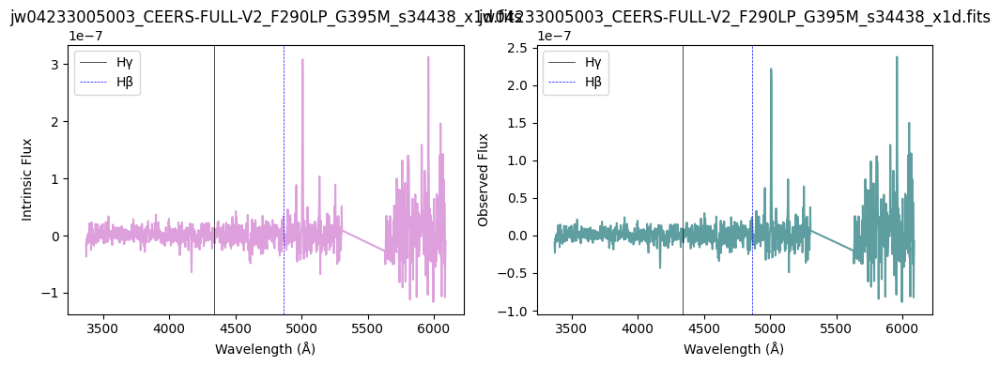

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.8288441148313155
obs/intrinsic  0.8595567339699447
ebv -0.3533626503515185
k [2.70281966 2.70146908 2.70011942 ... 1.52728705 1.52662363 1.52596067]


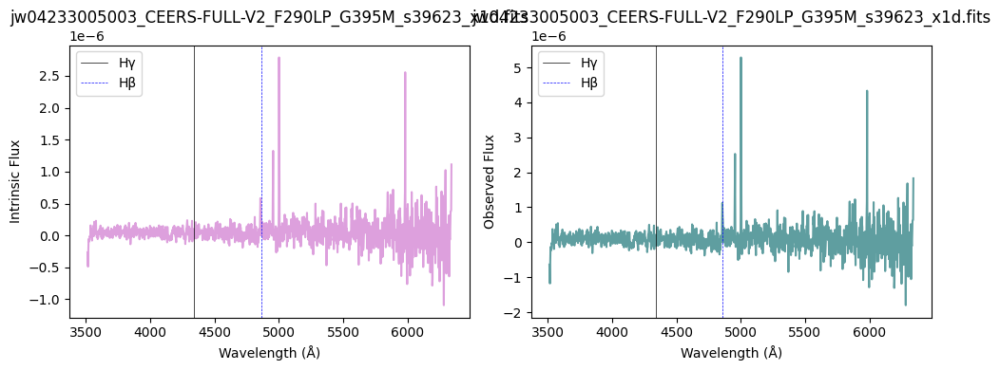

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.1406253066935257
obs/intrinsic  1.0060938941450517
ebv 0.014185555540141965
k [3.06555406 3.06420025 3.06284723 ... 1.92214102 1.92142653 1.9207124 ]


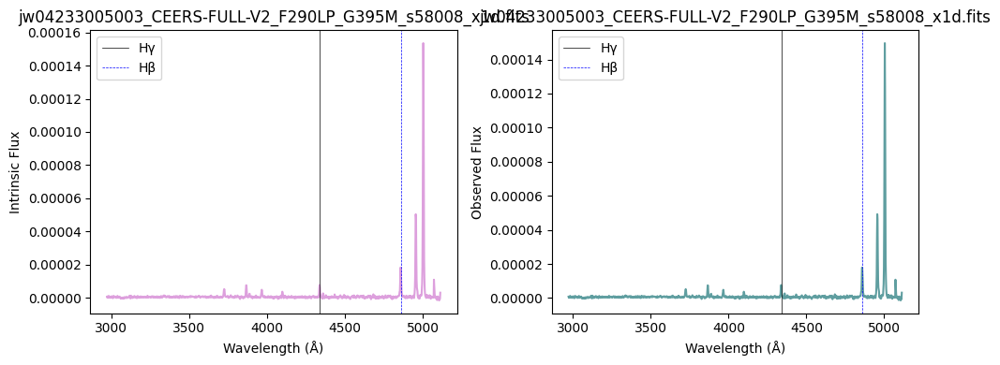

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.0556948672712108
obs/intrinsic  0.9661765876165995
ebv -0.08034134700232297
k [2.72140842 2.72006172 2.71868504 ... 1.53309985 1.53248214 1.53186476]


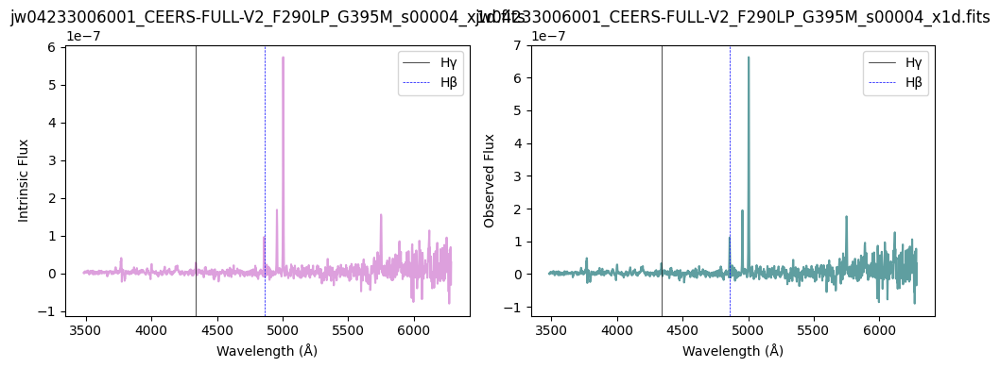

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.187151244013308
obs/intrinsic  0.7620736041858215
ebv -0.25366096452524906
k [2.56266016 2.56132345 2.55998769 ... 1.40514141 1.40452205 1.40390312]


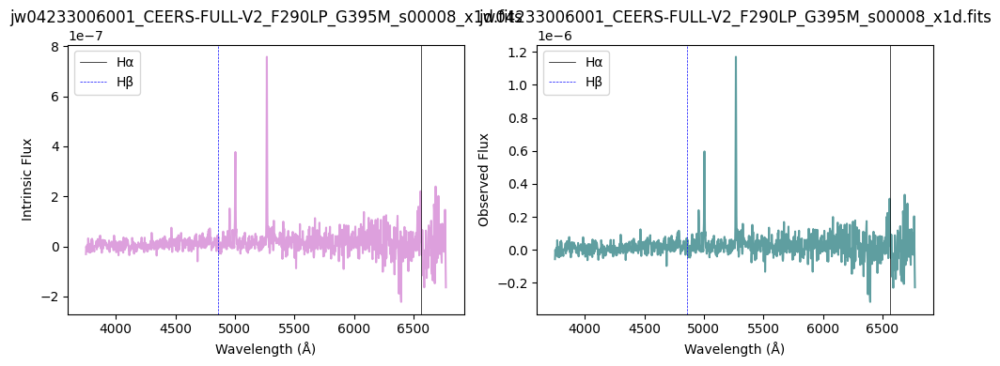

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.010331711222142
obs/intrinsic  0.9448559042735564
ebv -0.13244311150514812
k [2.57582892 2.57449209 2.57315622 ... 1.41774388 1.41712296 1.41650246]


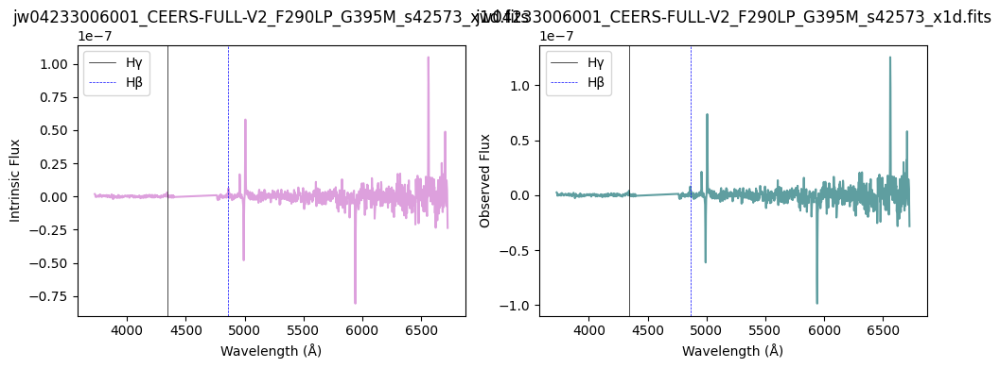

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.191014477229898
obs/intrinsic  1.0297768042971251
ebv 0.06851131788423717
k [2.88205817 2.88070188 2.87934645 ... 1.6672296  1.66658676 1.66594424]


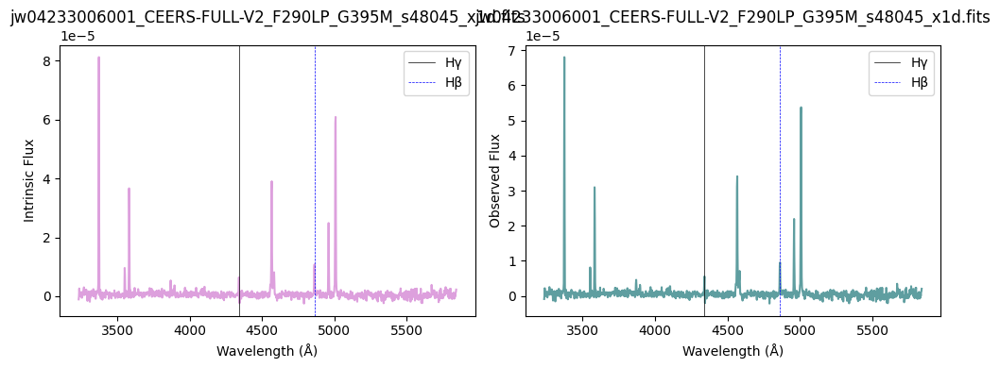

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.2736178746251836
obs/intrinsic  1.0686004010728745
ebv 0.1549211443476801
k [2.49882676 2.49758792 2.49634993 ... 1.48334553 1.48270181 1.48205854]


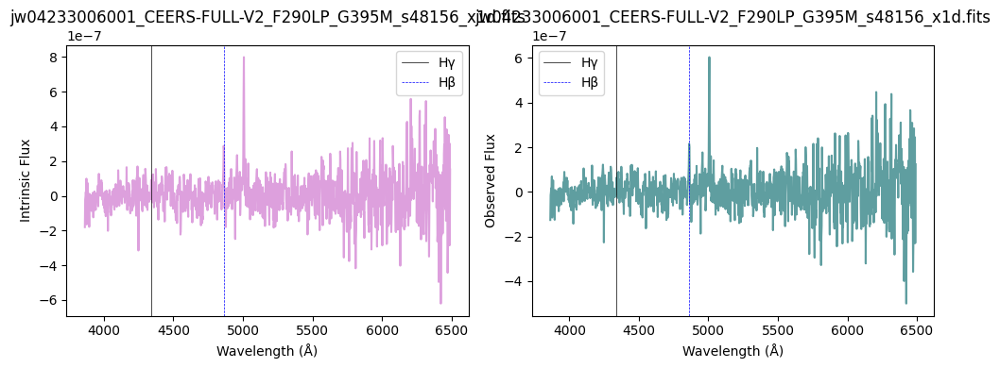

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.0158739851973957
obs/intrinsic  0.9474607730419232
ebv -0.12601484803013321
k [2.63693391 2.6355893  2.63424562 ... 1.46973247 1.46909287 1.46845372]


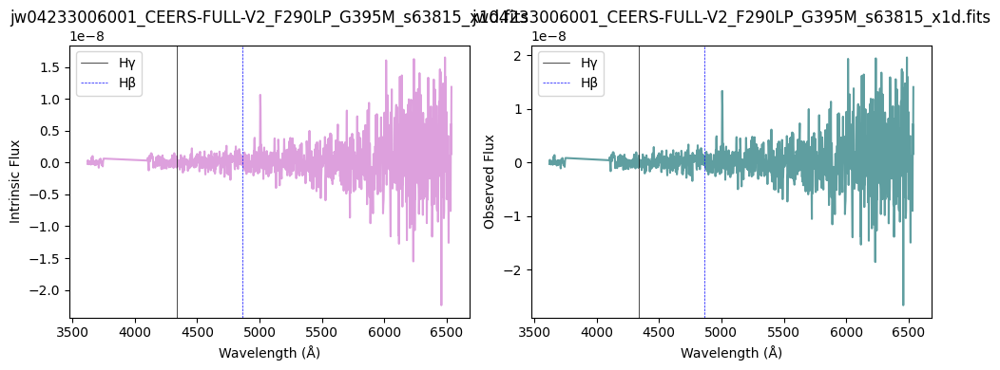

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.1299568108736926
obs/intrinsic  1.0010797011097345
ebv 0.0025196520201902816
k [2.86239258 2.8610379  2.85968408 ... 1.65126773 1.65063133 1.64999527]


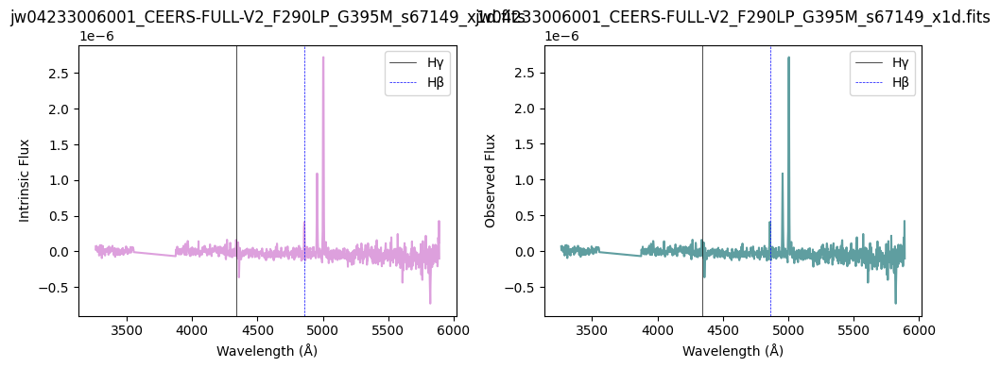

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.4630185142004666
obs/intrinsic  0.8581946042510337
ebv -0.1427648760653655
k [2.36490289 2.36359252 2.36228316 ... 1.24688132 1.24632113 1.24576133]


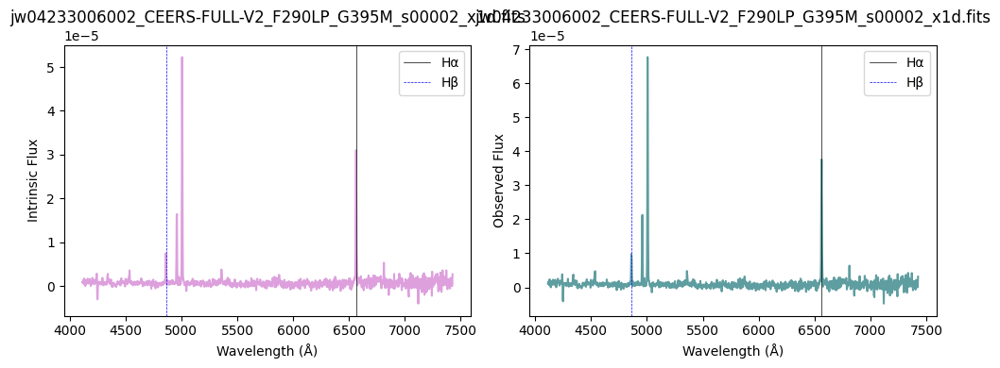

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.0611637476765754
obs/intrinsic  0.9687469614071186
ebv -0.07413788548954847
k [2.84983647 2.84848114 2.84712667 ... 1.69831853 1.69765097 1.69698377]


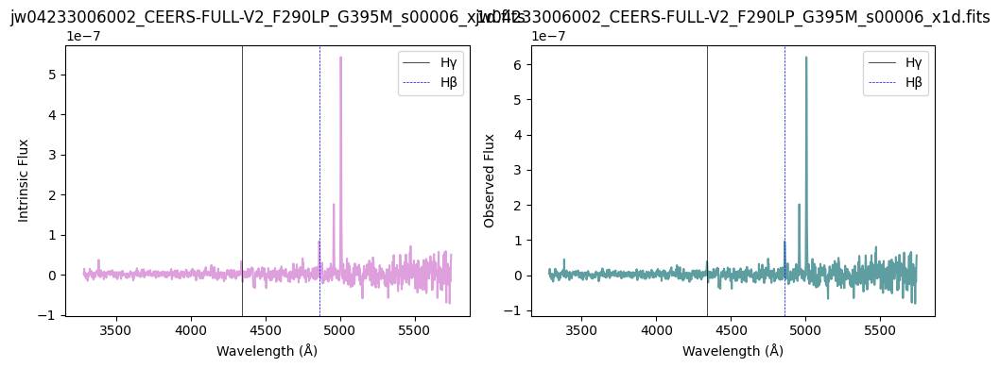

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.2669590628346166
obs/intrinsic  1.0654707595313109
ebv 0.14807277184248097
k [2.75108774 2.74974115 2.74839546 ... 1.5573143  1.55669401 1.55607404]


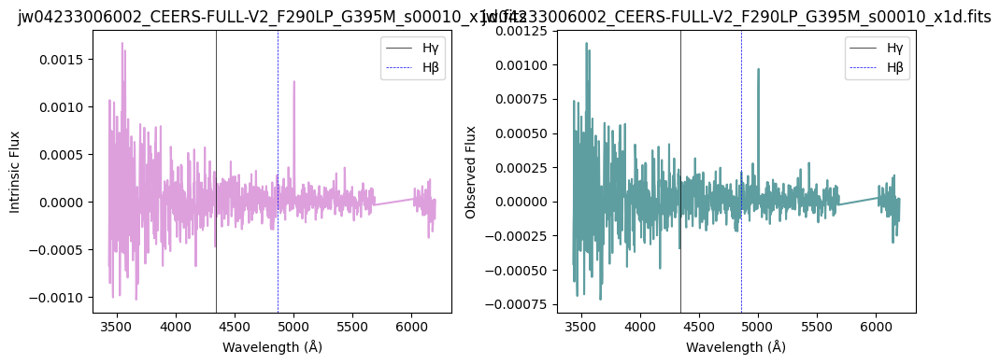

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.2032401342124146
obs/intrinsic  1.0355228630789028
ebv 0.08150372057294096
k [2.63823577 2.63688725 2.63553967 ... 1.47094175 1.47029696 1.46965262]


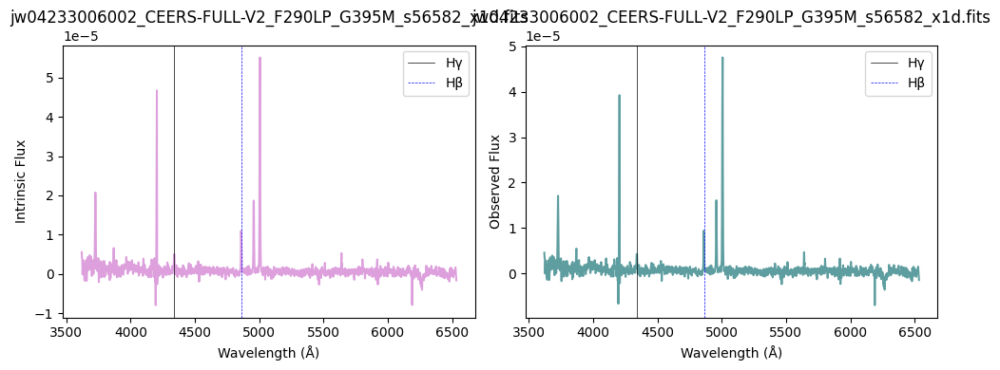

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.0228154038283654
obs/intrinsic  0.9507232397984761
ebv -0.11798865548372309
k [2.94310792 2.94183444 2.9405617  ... 1.82849129 1.82783135 1.82717173]


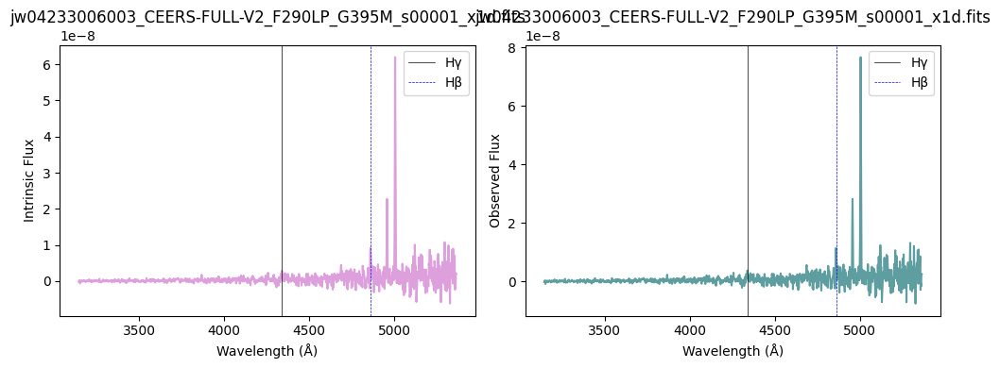

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.9660798664131205
obs/intrinsic  0.924057537213335
ebv -0.18441390446128544
k [3.03188015 3.03052966 3.02917996 ... 1.9033216  1.90260761 1.90189399]


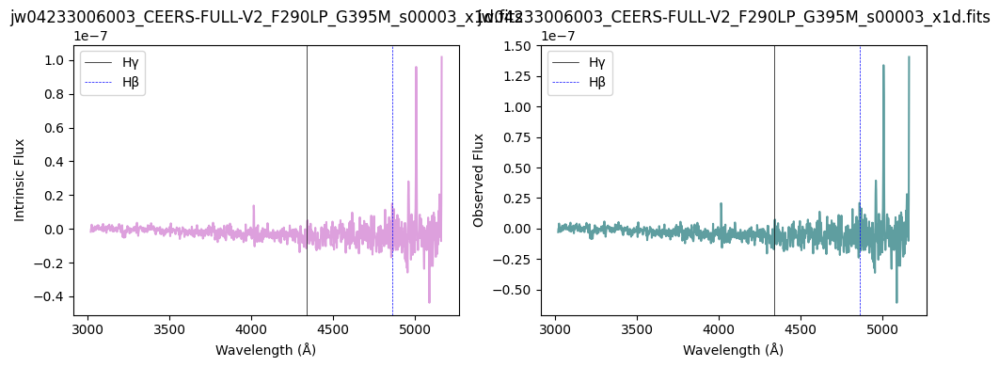

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 1.94334528262121
obs/intrinsic  0.9133722828311467
ebv -0.21157081514425513
k [2.98934734 2.98799979 2.98665306 ... 1.76094637 1.76029691 1.75964777]


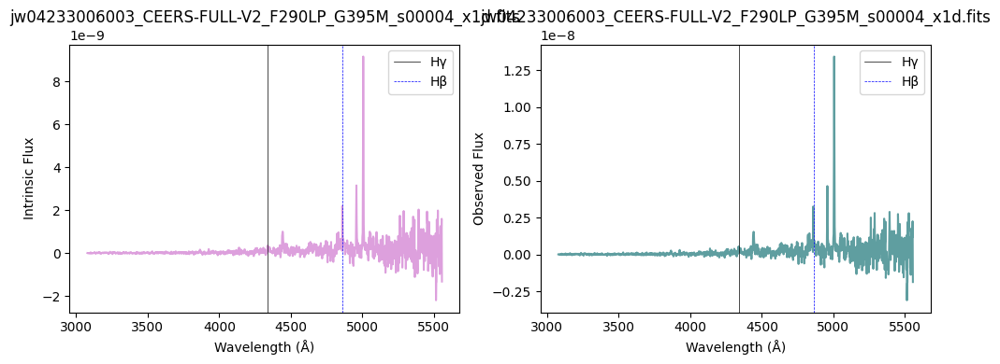

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


halpha ratio: 2.615418457081005
obs/intrinsic  0.9112956296449495
ebv -0.08671692281508504
k [2.36815405 2.36688756 2.36562201 ... 1.31151767 1.31093325 1.31034924]


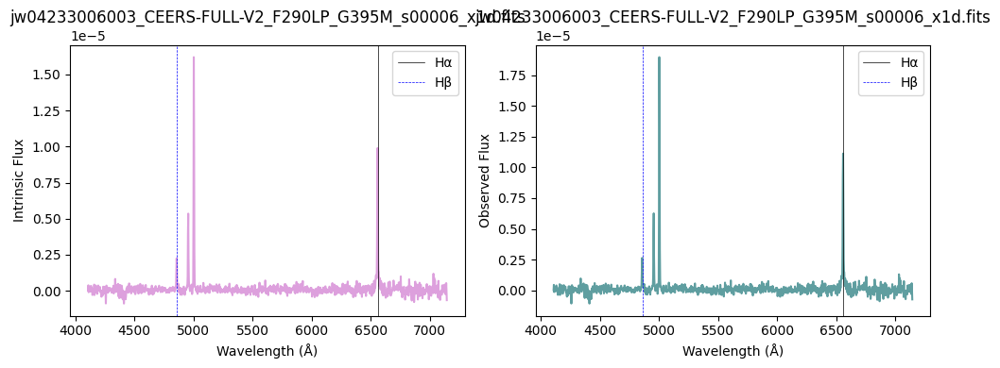

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.166965023435807
obs/intrinsic  1.0184735610139126
ebv 0.04274064219520439
k [2.63563578 2.63429406 2.63295326 ... 1.46792881 1.46728916 1.46664995]


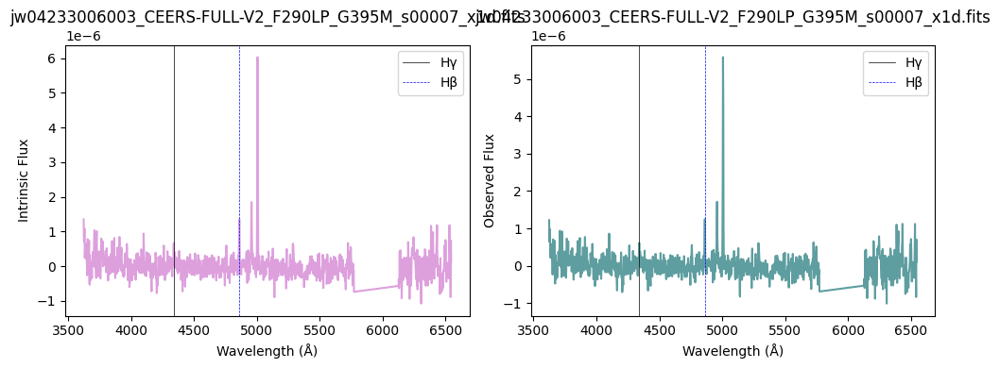

/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
/opt/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


hgamma ratio: 2.2218628025185465
obs/intrinsic  1.0442755171827771
ebv 0.1011564310839702
k [2.5961822  2.59483754 2.59349383 ... 1.43359647 1.4329666  1.43233716]


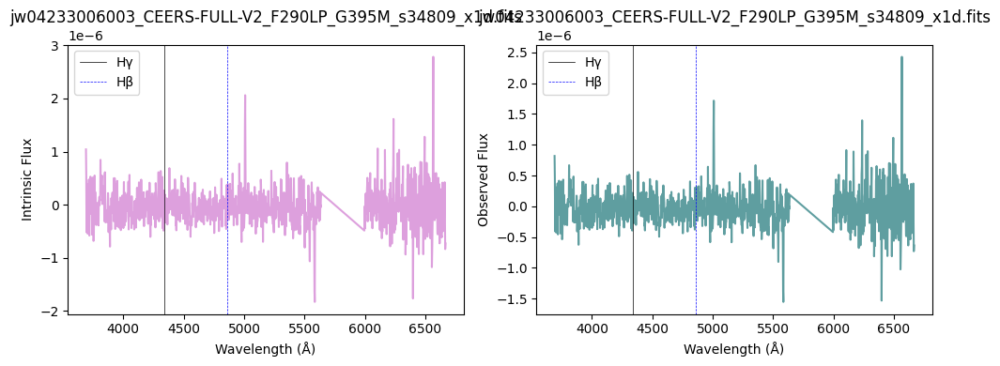

In [41]:
Hgamma_fluxes = []
Hbeta_fluxes = []
Halpha_fluxes= []

flux_instrinsic = []
flux_instrinsic_master = []
flux_error_master = []
flux_boolean = []
ratios = []
R_master =[]
rest_frame_wavelength = []

which_ratios_label= []
# Process each source
for i, r in enumerate(redshift):
    if flags[i] == True:
        file_name = source_name[i]
        after_wavelength = rest_frame[i]
        before_flux = flux_lambda_cleaned_for_each_spectra[i]
        before_flux_error = flux_error[i]

    
        mask = ((np.isfinite(before_flux) )) & ((np.isfinite(before_flux_error) )) 
     
        flux_cleaned = before_flux[mask]
        flux_error_cleaned = before_flux_error[mask]
        equation_cleaned = (after_wavelength[mask])*um_to_ang

        if r<6.7:
            if (((np.amax(equation_cleaned)) >= h_alpha) & wavelength_exists(equation_cleaned, h_alpha) & wavelength_exists(equation_cleaned, h_beta))  :
                which_ratios_label.append('Halpha')

#             plt.figure()
#             plt.plot(equation_cleaned,flux_cleaned)
#             plt.axvline(h_alpha, c= 'red', label = 'halpha',linewidth=.5,alpha=.5)
#             plt.axvline(h_beta, c='blue', label = 'hbeta',linewidth=.5,ls='--')

#             plt.title(file_name)
#             plt.show()


        #----
    
                window_wavelength = 15   
        
                #Halpha_fit = emcee_fit(equation_cleaned, flux_cleaned, flux_error_cleaned, h_alpha, window_wavelength,diagnose= False,save=False)
                Hbeta_fit = emcee_fit(equation_cleaned, flux_cleaned, flux_error_cleaned, h_beta, window_wavelength,diagnose= False,save=False)
                Halpha_fit = emcee_fit(equation_cleaned, flux_cleaned, flux_error_cleaned, h_alpha, window_wavelength,diagnose= False,save=False)
        
                #reddening 
                R = (Halpha_fit /Hbeta_fit) / 2.87
                ratio = ((Halpha_fit/Hbeta_fit))
                #E(B-V)
                # if R<3:
                #     R_master.append('Yes')
                # if R>3:
                #     R_master.append('No')
                EBV = (np.log10(R) / (0.4*  1.163))
                #piecewise k function
                k = np.piecewise(equation_cleaned/ um_to_ang,
                    [np.logical_and(equation_cleaned / um_to_ang >= (0.63), equation_cleaned / um_to_ang <= (2.20 )),
                     np.logical_and(equation_cleaned / um_to_ang >= (0.12 ), equation_cleaned / um_to_ang <= (0.63))],
                    [lambda x: 1.17 * (-1.857 + (1.040 / x)) + 1.78,
                     lambda x: 1.17 * ((-2.156 + (1.509 / x)) - (0.198 / (x**2)) + (0.011 / (x**3)) )+ 1.78])
                
                print('halpha ratio:',ratio)
                print('obs/intrinsic ', R)
                print('ebv',EBV)
                print('k',k)

                #calculate flux array
                f_instrinsic = flux_cleaned*(10**(0.4*EBV*k))
                flux_error_corrected = flux_error_cleaned*(10**(0.4*EBV*k)) 
##calzetti 2001 takes only wavelengths in um (microns) NOT angstorms
##also make sure to divide every wavelength by required unit conversion to get A -> microns
                before_flux[mask] = f_instrinsic
                before_flux_error[mask] = flux_error_corrected
        
                flux_instrinsic_master.append(before_flux.astype(float))
                flux_error_master.append(before_flux_error.astype(float))
                flux_boolean.append('Yes')
        
                Halpha_fluxes.append(Halpha_fit)  
                Hbeta_fluxes.append(Hbeta_fit)
        
                ratios.append(ratio)
        
                # Create a figure with 2 subplots (1 row, 2 columns)
                fig, axes = plt.subplots(1, 2,figsize=(10,4))
        
                # Plot f_instrinsic on the left subplot
                axes[0].plot(equation_cleaned, f_instrinsic, color='plum')
                axes[0].axvline(h_alpha, c='k', label='Hα', linewidth=0.5)
                axes[0].axvline(h_beta, c='blue', label='Hβ', linewidth=0.5, ls='--')
                axes[0].set_title(f"{file_name}")
                axes[0].set_xlabel('Wavelength (Å)')
                axes[0].set_ylabel('Intrinsic Flux')
                axes[0].legend()
        
                # Plot flux_cleaned on the right subplot
                axes[1].plot(equation_cleaned, flux_cleaned, color='cadetblue')
                axes[1].axvline(h_alpha, c='k', label='Hα', linewidth=0.5)
                axes[1].axvline(h_beta, c='blue', label='Hβ', linewidth=0.5, ls='--')
                axes[1].set_title(f"{file_name}")
                axes[1].set_xlabel('Wavelength (Å)')
                axes[1].set_ylabel('Observed Flux')
                axes[1].legend()
        
                # Display the plots
                plt.tight_layout()
                plt.show()
        
            else:
                flux_instrinsic_master.append(before_flux.astype(float))
                flux_boolean.append('No')
                #flux_instrinsic_master.append(np.ones(len(flux))*np.nan)
                flux_error_master.append(before_flux_error.astype(float))
                ratios.append(0)
                which_ratios_label.append('None')

        elif r >6.7:
            if (((np.amax(equation_cleaned)) >= h_beta) & wavelength_exists(equation_cleaned, h_gamma) & wavelength_exists(equation_cleaned, h_beta))  :

                which_ratios_label.append('Hgamma')

#             plt.figure()
#             plt.plot(equation_cleaned,flux_cleaned)
#             plt.axvline(h_alpha, c= 'red', label = 'halpha',linewidth=.5,alpha=.5)
#             plt.axvline(h_beta, c='blue', label = 'hbeta',linewidth=.5,ls='--')

#             plt.title(file_name)
#             plt.show()


        #----
    
                window_wavelength = 15   
        
                #Halpha_fit = emcee_fit(equation_cleaned, flux_cleaned, flux_error_cleaned, h_alpha, window_wavelength,diagnose= False,save=False)
                Hbeta_fit = emcee_fit(equation_cleaned, flux_cleaned, flux_error_cleaned, h_beta, window_wavelength,diagnose= False,save=False)
                Hgamma_fit = emcee_fit(equation_cleaned, flux_cleaned, flux_error_cleaned, h_gamma, window_wavelength,diagnose= False,save=False)
        
                #reddening 
                R = (Hbeta_fit/Hgamma_fit) / 2.12765957447
                ratio = ((Hbeta_fit/Hgamma_fit))
                #E(B-V)
                # if R<3:
                #     R_master.append('Yes')
                # if R>3:
                #     R_master.append('No')
                EBV = (np.log10(R) / (0.4*0.465))
                #piecewise k function
                k = np.piecewise(equation_cleaned/ um_to_ang,
                    [np.logical_and(equation_cleaned / um_to_ang >= (0.63), equation_cleaned / um_to_ang <= (2.20 )),
                     np.logical_and(equation_cleaned / um_to_ang >= (0.12 ), equation_cleaned / um_to_ang <= (0.63))],
                    [lambda x: 1.17 * (-1.857 + (1.040 / x)) + 1.78,
                     lambda x: 1.17 * ((-2.156 + (1.509 / x)) - (0.198 / (x**2)) + (0.011 / (x**3)) )+ 1.78])
               
                print('hgamma ratio:',ratio)
                print('obs/intrinsic ', R)
                print('ebv',EBV)
                print('k',k)
                
                #calculate flux array
                f_instrinsic = flux_cleaned*(10**(0.4*EBV*k))
       
                flux_error_corrected = flux_error_cleaned*(10**(0.4*EBV*k)) 
##calzetti 2001 takes only wavelengths in um (microns) NOT angstorms
##also make sure to divide every wavelength by required unit conversion to get A -> microns
                before_flux[mask] = f_instrinsic
                before_flux_error[mask] = flux_error_corrected
        
                flux_instrinsic_master.append(before_flux.astype(float))
                flux_error_master.append(before_flux_error.astype(float))
                flux_boolean.append('Yes')
        
                #Halpha_fluxes.append(Halpha_fit)  # A from the fit is the flux
                Hgamma_fluxes.append(Hgamma_fit)
                Hbeta_fluxes.append(Hbeta_fit)
        
                ratios.append(ratio)
        
                # Create a figure with 2 subplots (1 row, 2 columns)
                fig, axes = plt.subplots(1, 2,figsize=(10,4))
        
                # Plot f_instrinsic on the left subplot
                axes[0].plot(equation_cleaned, f_instrinsic, color='plum')
                axes[0].axvline(h_gamma, c='k', label='Hγ', linewidth=0.5)
                axes[0].axvline(h_beta, c='blue', label='Hβ', linewidth=0.5, ls='--')
                axes[0].set_title(f"{file_name}")
                axes[0].set_xlabel('Wavelength (Å)')
                axes[0].set_ylabel('Intrinsic Flux')
                axes[0].legend()
        
                # Plot flux_cleaned on the right subplot
                axes[1].plot(equation_cleaned, flux_cleaned, color='cadetblue')
                axes[1].axvline(h_gamma, c='k', label='Hγ', linewidth=0.5)
                axes[1].axvline(h_beta, c='blue', label='Hβ', linewidth=0.5, ls='--')
                axes[1].set_title(f"{file_name}")
                axes[1].set_xlabel('Wavelength (Å)')
                axes[1].set_ylabel('Observed Flux')
                axes[1].legend()
        
                # Display the plots
                plt.tight_layout()
                plt.show()
        
            else:
                flux_instrinsic_master.append(before_flux.astype(float))
                flux_boolean.append('No')
                #flux_instrinsic_master.append(np.ones(len(flux))*np.nan)
                flux_error_master.append(before_flux_error.astype(float))
                ratios.append(0)
                which_ratios_label.append('None')
    else:
        flux_instrinsic_master.append(before_flux.astype(float))
        flux_boolean.append('No')
        #flux_instrinsic_master.append(np.ones(len(flux))*np.nan)
        flux_error_master.append(before_flux_error.astype(float))
        ratios.append(0) 
        which_ratios_label.append('None')


In [42]:
RUBIES_and_CEERS_table['flux_intrinsic'] = flux_instrinsic_master
RUBIES_and_CEERS_table['flux_error_corrected']= flux_error_master
RUBIES_and_CEERS_table['dust_corrected']= flux_boolean
RUBIES_and_CEERS_table['ratios']= ratios
RUBIES_and_CEERS_table['which_ratio']= which_ratios_label

#RUBIES_table['R VALUES']= R_master
RUBIES_and_CEERS_table.write('MASTER_RUBIES_AND_CEERS_TABLE.fits',overwrite=True)

In [ ]:
print(RUBIES_and_CEERS_table['which_ratio'].type)
